In [2]:
import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

In [3]:
def show(tensor, ch=1, size=(28,28), num=16):
  data = tensor.detach().cpu().view(-1,ch,*size)
  grid = make_grid(data[:num], nrow=4).permute(1,2,0)
  plt.imshow(grid)
  plt.show()

In [4]:
epochs = 500
cur_step = 0
info_step = 300
mean_gen_loss = 0
mean_disc_loss = 0

z_dim = 64
lr = 0.00001
loss_func = nn.BCEWithLogitsLoss()
bs = 128
device = 'cuda'
dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()),shuffle=True, batch_size=bs)




100%|██████████| 9912422/9912422 [00:00<00:00, 150001303.34it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 39215180.91it/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 34861134.95it/s]


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 22151777.64it/s]


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [5]:
def genBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace=True)
  )

class Generator(nn.Module):
  def __init__(self, z_dim=64, i_dim=784, h_dim=128):
    super().__init__()
    self.gen = nn.Sequential(
        genBlock(z_dim, h_dim),
        genBlock(h_dim, h_dim*2),
        genBlock(h_dim*2, h_dim*4),
        genBlock(h_dim*4, h_dim*8),
        nn.Linear(h_dim*8, i_dim),
        nn.Sigmoid(),

    )

  def forward(self, noise):
    return self.gen(noise)

def gen_noise(number, z_dim):
  return torch.randn(number, z_dim).to(device)

def discBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.LeakyReLU(0.2)
  )


class Discriminator(nn.Module):
  def __init__(self, i_dim=784, h_dim=256):
    super().__init__()
    self.disc = nn.Sequential(
        discBlock(i_dim, h_dim*4),
        discBlock(h_dim*4, h_dim*2),
        discBlock(h_dim*2, h_dim),
        nn.Linear(h_dim, 1),
    )
  def forward(self, image):
    return self.disc(image)


In [6]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [7]:
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

In [8]:
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

In [9]:
x,y= next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([3, 7, 8, 0, 9, 1, 6, 2, 6, 6])


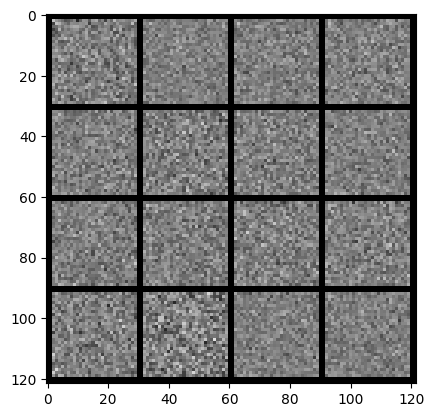

In [10]:
noise=gen_noise(bs, z_dim)
fake=gen(noise)
show(fake)

In [13]:
def calc_gen_loss(loss_func, gen, disc, number, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)
  pred = disc(fake)
  targets = torch.ones_like(pred)
  gen_loss = loss_func(pred, targets)
  return gen_loss

def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)
  disc_fake=disc(fake.detach())
  disc_fake_targets = torch.zeros_like(disc_fake)
  disc_fake_loss = loss_func(disc_fake, disc_fake_targets)

  disc_real = disc(real)
  disc_real_targets = torch.ones_like(disc_real)
  disc_real_loss = loss_func(disc_real, disc_real_targets)

  disc_loss=(disc_fake_loss+disc_real_loss)/2
  return disc_loss




  0%|          | 0/469 [00:00<?, ?it/s]

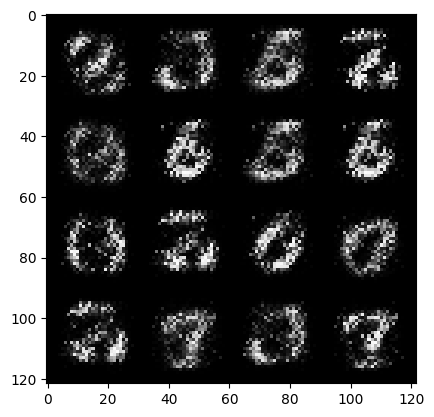

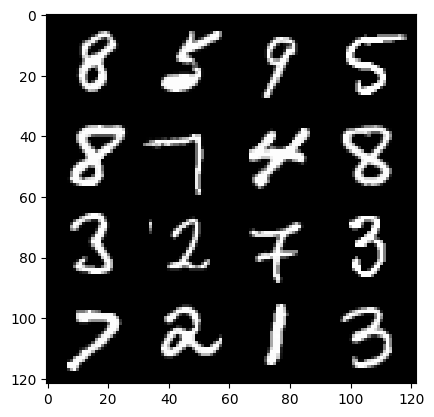

0: step 7200 / Gen loss: 7.331463756561283 / disc_loss: 0.011853664876737946


  0%|          | 0/469 [00:00<?, ?it/s]

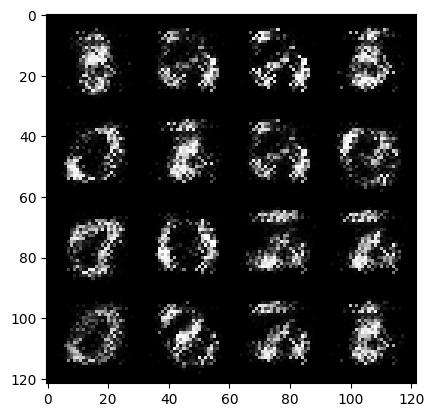

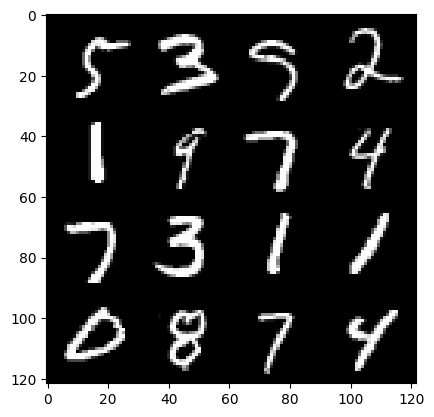

1: step 7500 / Gen loss: 7.078606454531354 / disc_loss: 0.01047059720925366


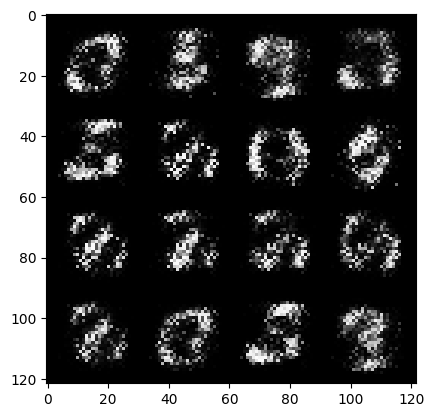

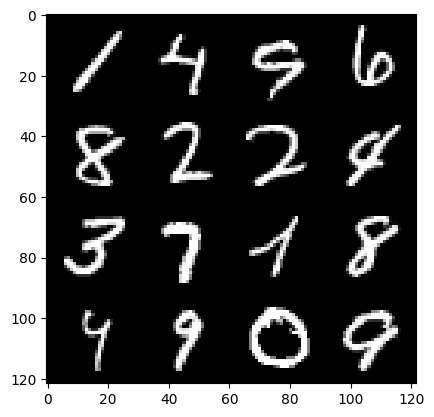

1: step 7800 / Gen loss: 7.069060508410135 / disc_loss: 0.00815559230434398


  0%|          | 0/469 [00:00<?, ?it/s]

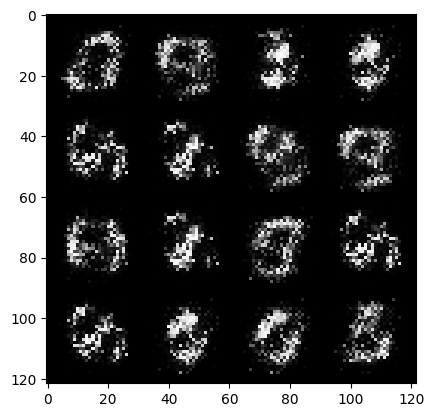

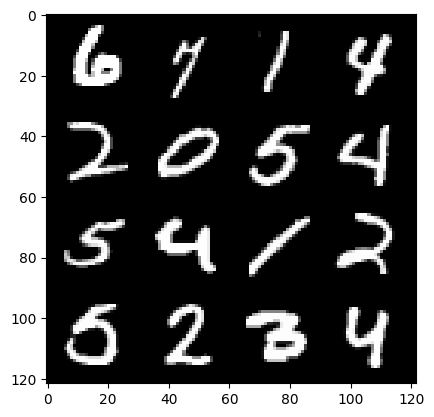

2: step 8100 / Gen loss: 7.071953825950625 / disc_loss: 0.007893365032505244


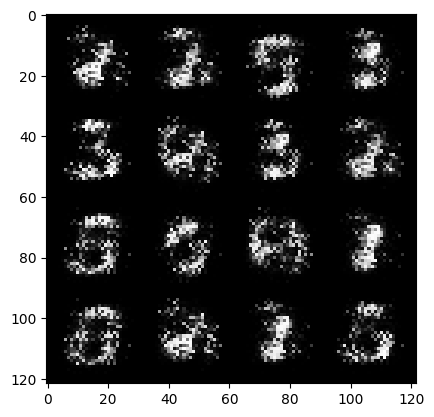

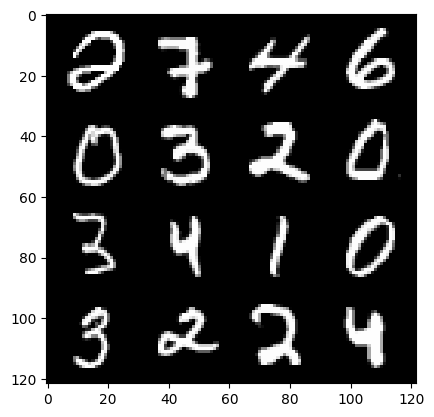

2: step 8400 / Gen loss: 7.223727780977888 / disc_loss: 0.008698378428040691


  0%|          | 0/469 [00:00<?, ?it/s]

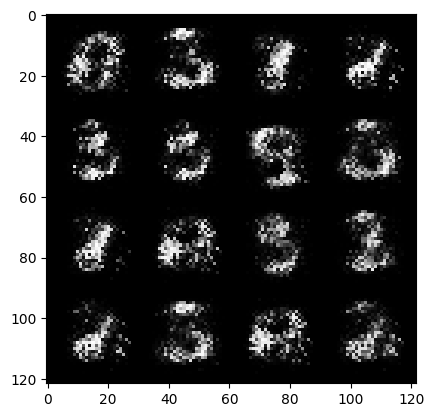

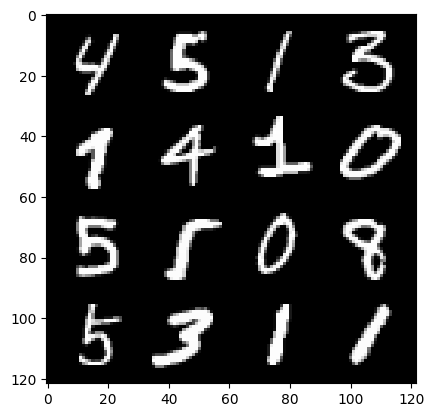

3: step 8700 / Gen loss: 7.761839628219604 / disc_loss: 0.010442099125745398


  0%|          | 0/469 [00:00<?, ?it/s]

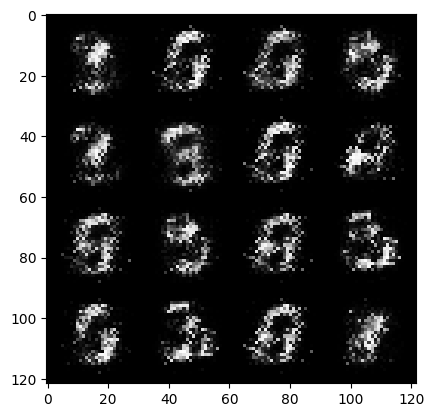

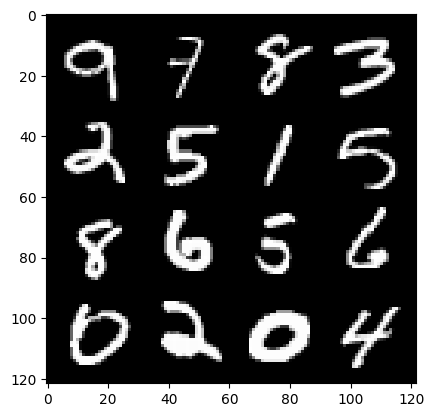

4: step 9000 / Gen loss: 7.601745386123658 / disc_loss: 0.011681885245100915


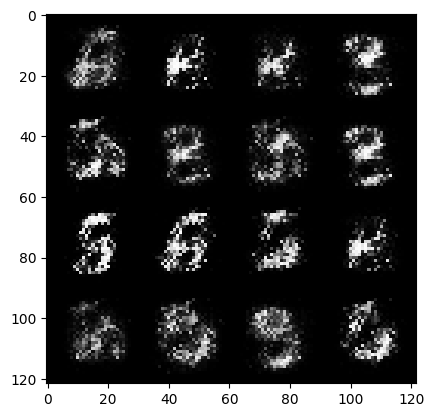

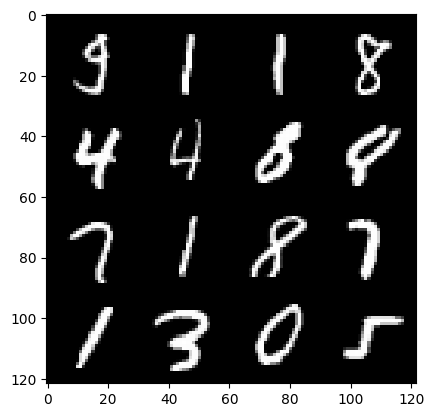

4: step 9300 / Gen loss: 7.438822700182598 / disc_loss: 0.011066411025046062


  0%|          | 0/469 [00:00<?, ?it/s]

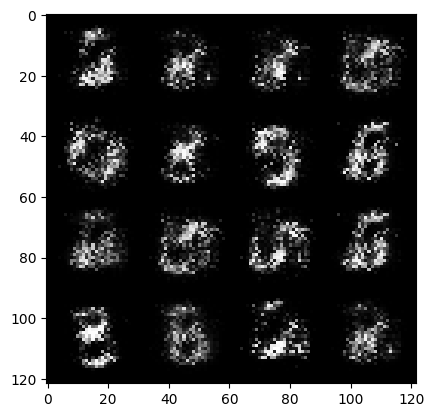

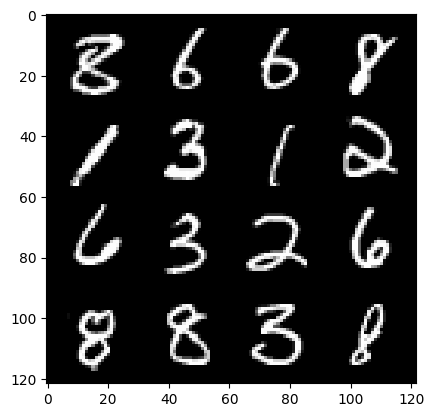

5: step 9600 / Gen loss: 6.997727413177486 / disc_loss: 0.012854165203558893


  0%|          | 0/469 [00:00<?, ?it/s]

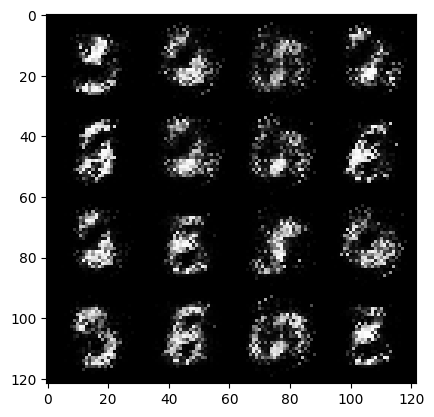

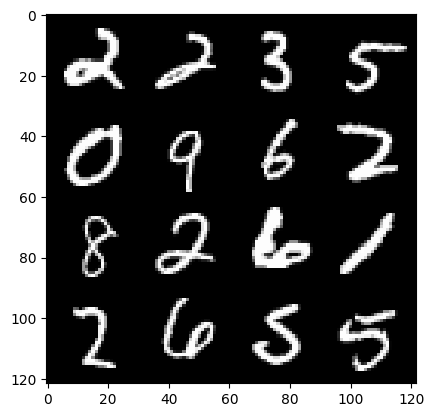

6: step 9900 / Gen loss: 7.575590759913126 / disc_loss: 0.01095908121516307


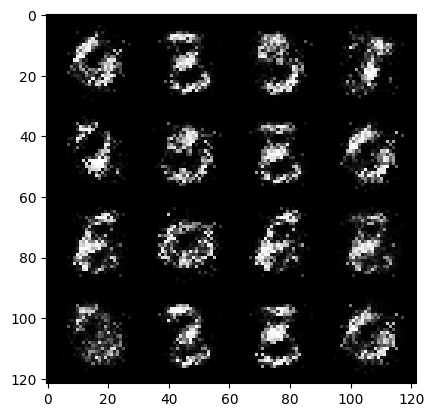

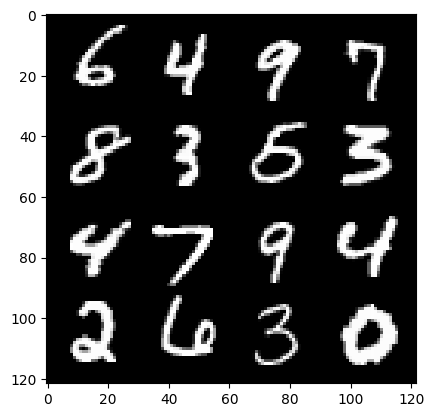

6: step 10200 / Gen loss: 7.598722246487934 / disc_loss: 0.010093005154437078


  0%|          | 0/469 [00:00<?, ?it/s]

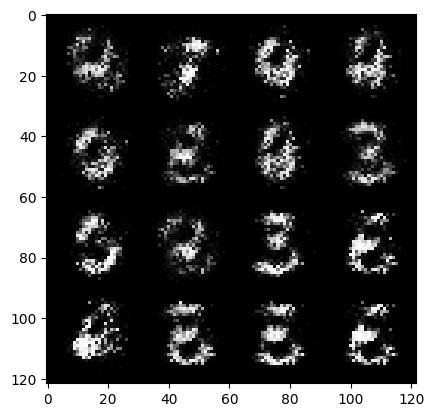

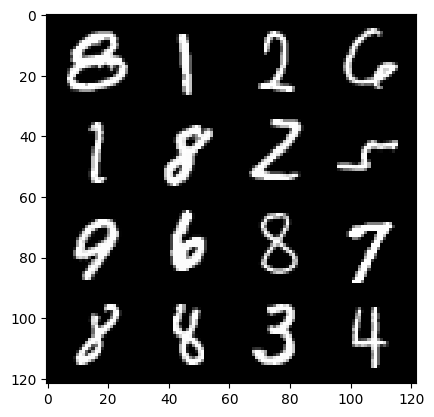

7: step 10500 / Gen loss: 7.408356029192603 / disc_loss: 0.01122009530663491


  0%|          | 0/469 [00:00<?, ?it/s]

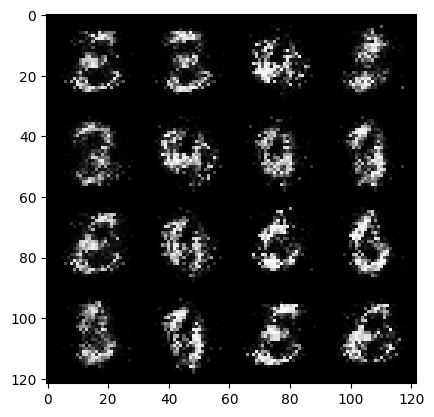

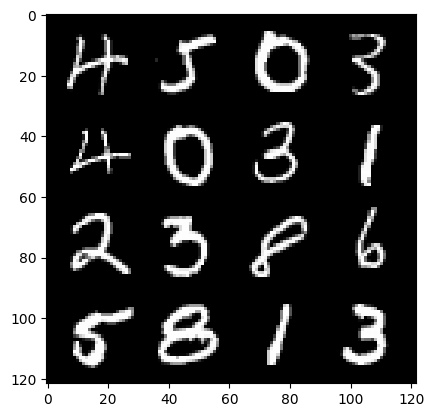

8: step 10800 / Gen loss: 7.53469488143921 / disc_loss: 0.00966956486459821


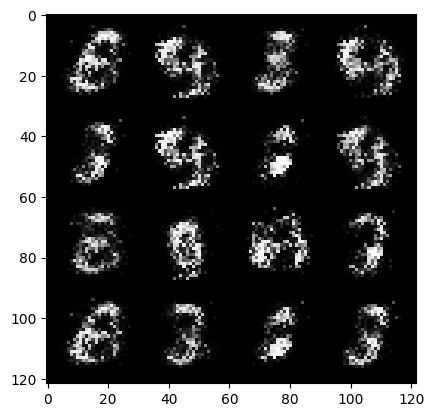

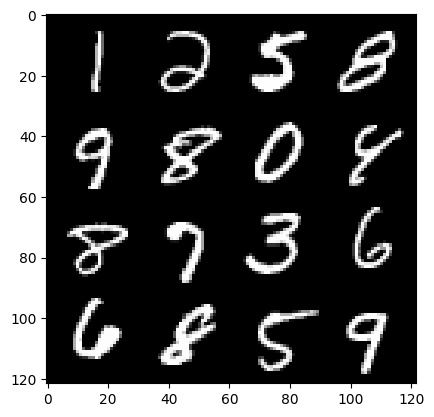

8: step 11100 / Gen loss: 7.802941207885742 / disc_loss: 0.010903455593312777


  0%|          | 0/469 [00:00<?, ?it/s]

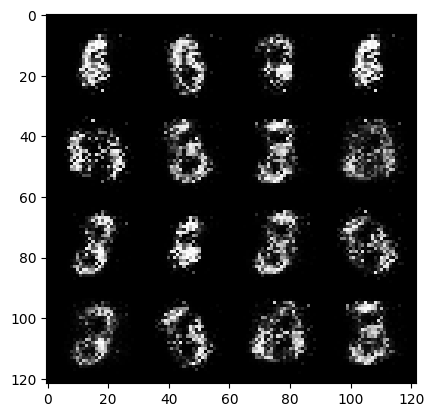

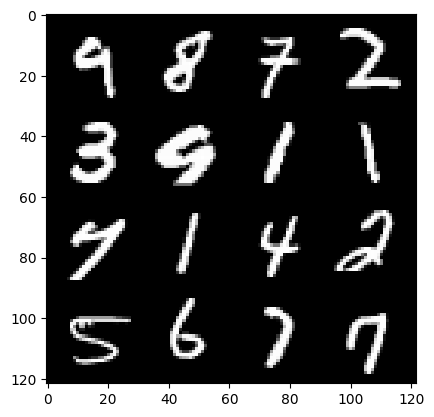

9: step 11400 / Gen loss: 7.245756200154622 / disc_loss: 0.011354588112638639


  0%|          | 0/469 [00:00<?, ?it/s]

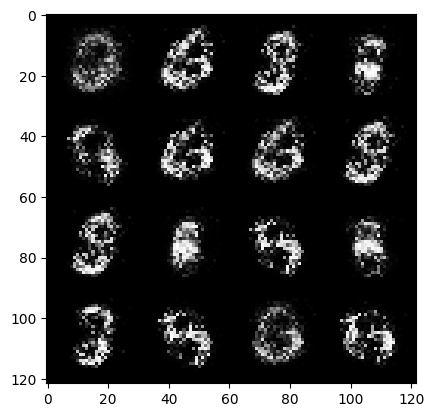

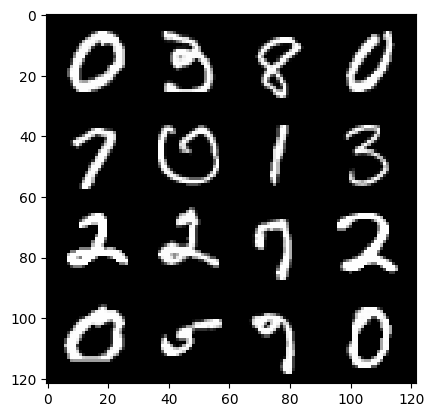

10: step 11700 / Gen loss: 7.1044049056371 / disc_loss: 0.011180097976854698


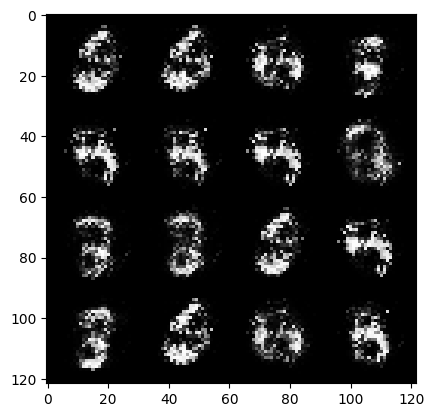

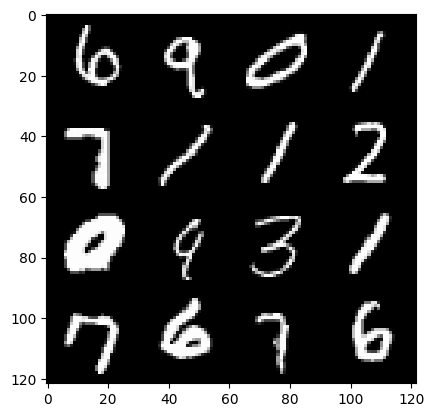

10: step 12000 / Gen loss: 7.0071541039148935 / disc_loss: 0.01086845701094717


  0%|          | 0/469 [00:00<?, ?it/s]

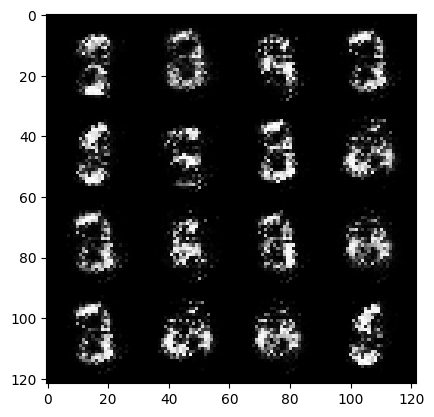

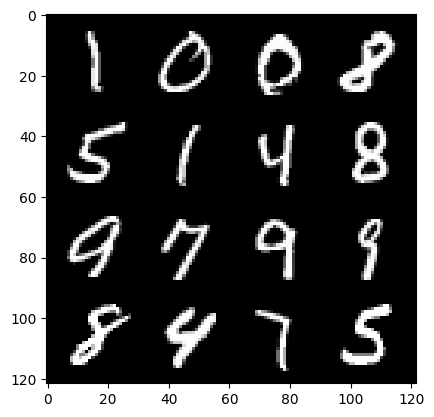

11: step 12300 / Gen loss: 7.193816383679702 / disc_loss: 0.012440209039486939


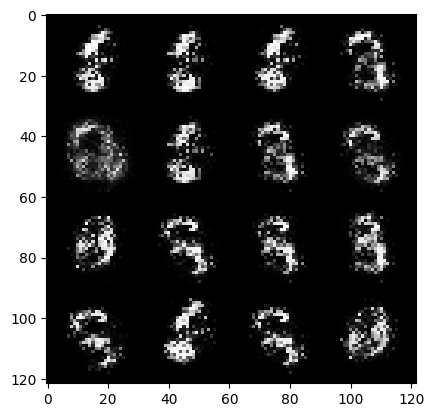

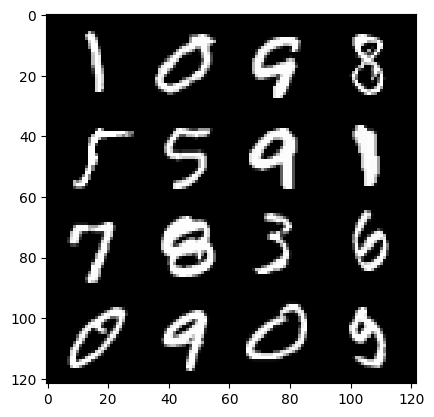

11: step 12600 / Gen loss: 6.7526981210708605 / disc_loss: 0.016467832345515483


  0%|          | 0/469 [00:00<?, ?it/s]

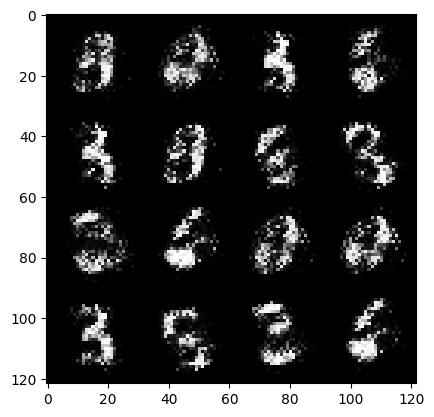

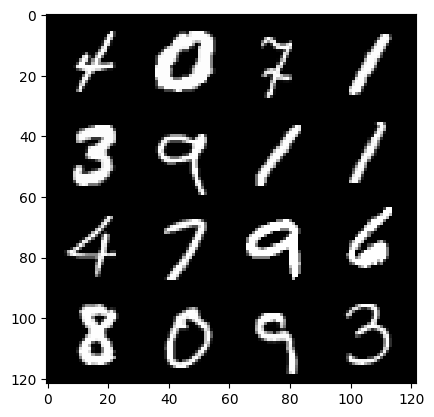

12: step 12900 / Gen loss: 6.669696857134499 / disc_loss: 0.01453958743639912


  0%|          | 0/469 [00:00<?, ?it/s]

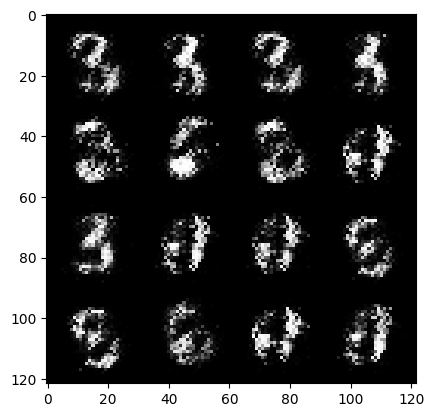

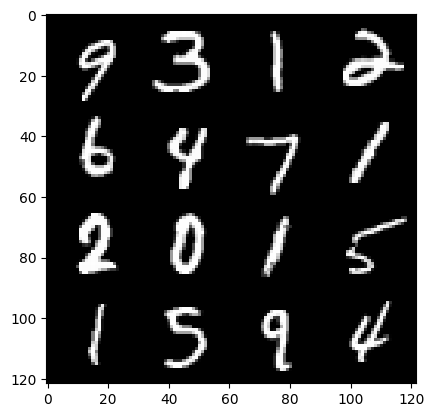

13: step 13200 / Gen loss: 6.2997023979822835 / disc_loss: 0.01801663567156841


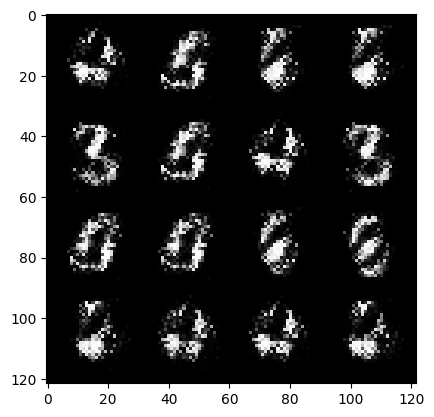

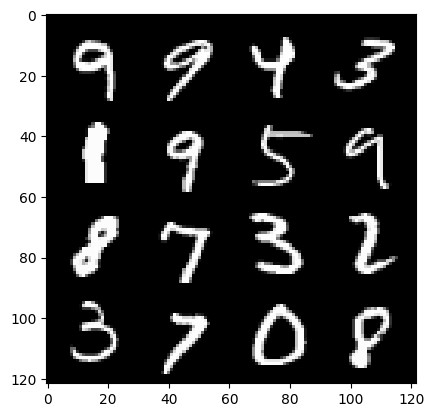

13: step 13500 / Gen loss: 6.454173707962034 / disc_loss: 0.014141018112810948


  0%|          | 0/469 [00:00<?, ?it/s]

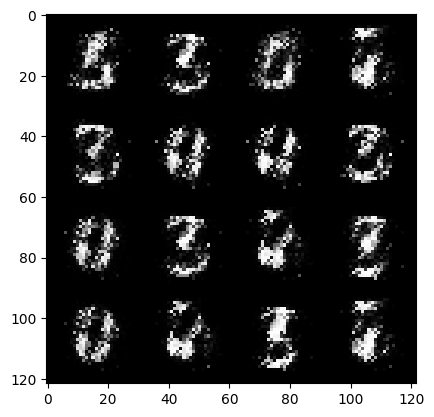

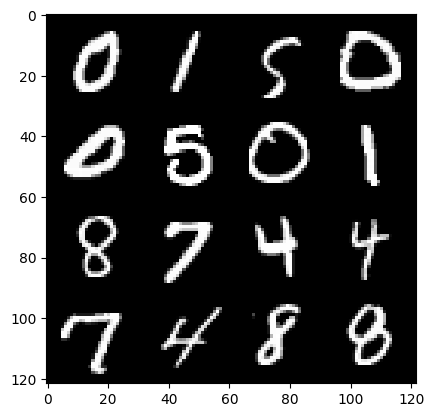

14: step 13800 / Gen loss: 6.631038751602175 / disc_loss: 0.010482735001714899


  0%|          | 0/469 [00:00<?, ?it/s]

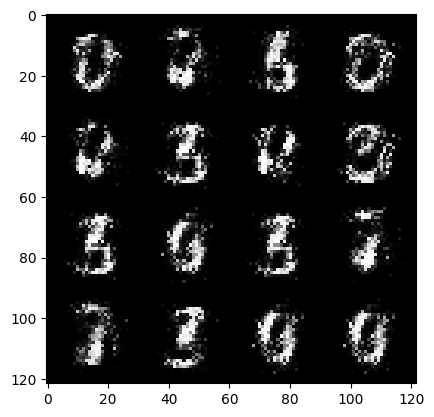

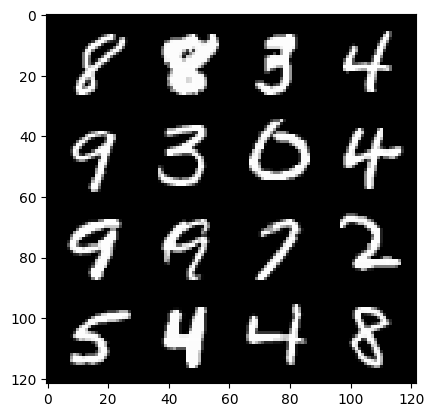

15: step 14100 / Gen loss: 7.339620072046913 / disc_loss: 0.012187329093382384


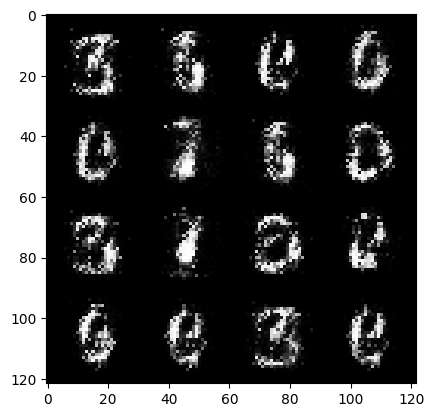

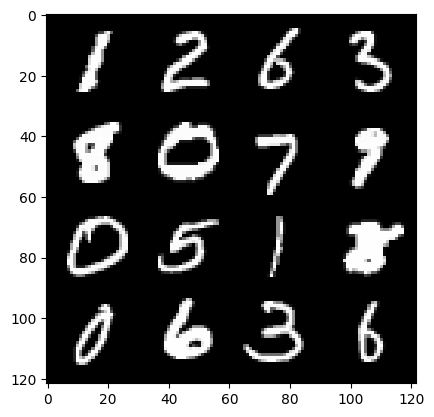

15: step 14400 / Gen loss: 7.043032277425131 / disc_loss: 0.017377234116817512


  0%|          | 0/469 [00:00<?, ?it/s]

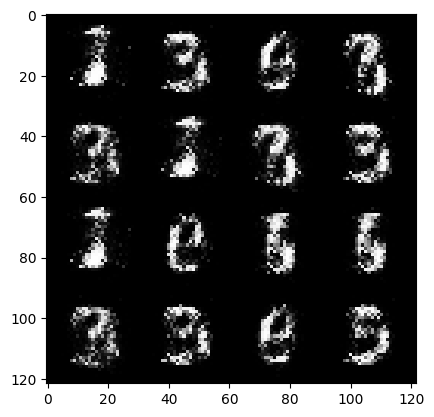

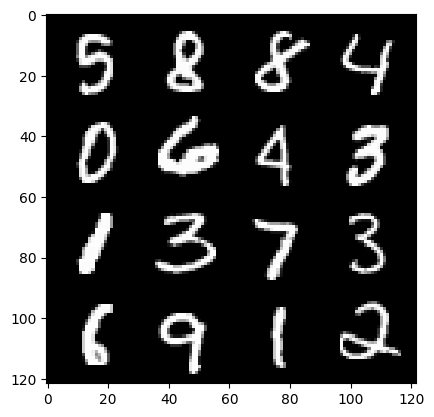

16: step 14700 / Gen loss: 6.952364009221398 / disc_loss: 0.019990003878871593


  0%|          | 0/469 [00:00<?, ?it/s]

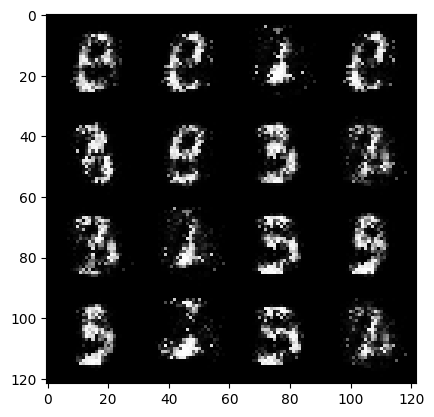

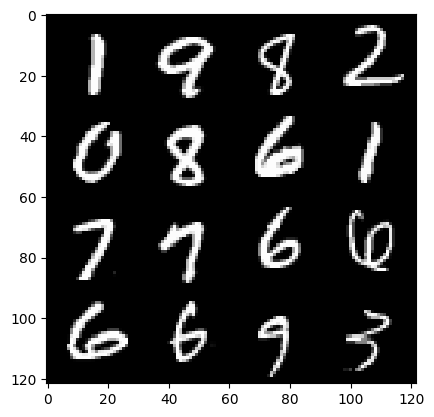

17: step 15000 / Gen loss: 6.966612904866533 / disc_loss: 0.02025707349103565


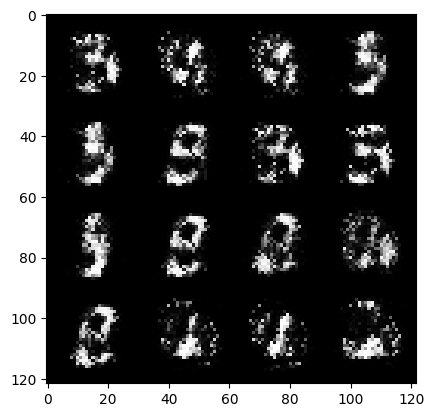

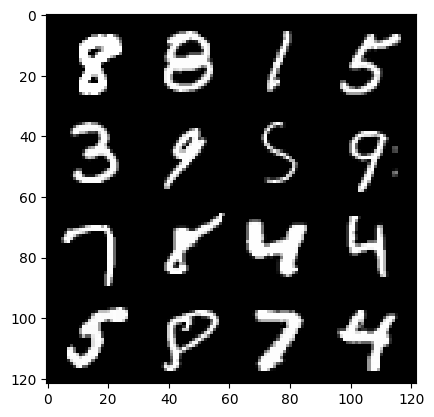

17: step 15300 / Gen loss: 6.865966119766231 / disc_loss: 0.01862361765466631


  0%|          | 0/469 [00:00<?, ?it/s]

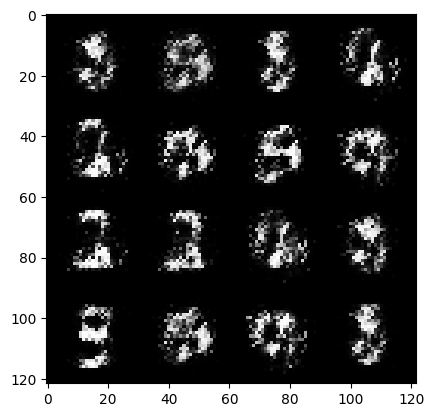

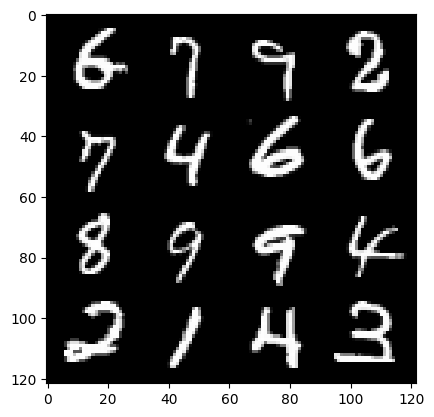

18: step 15600 / Gen loss: 6.629317124684651 / disc_loss: 0.018382576997391896


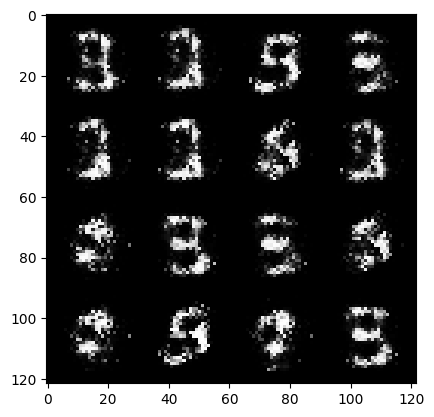

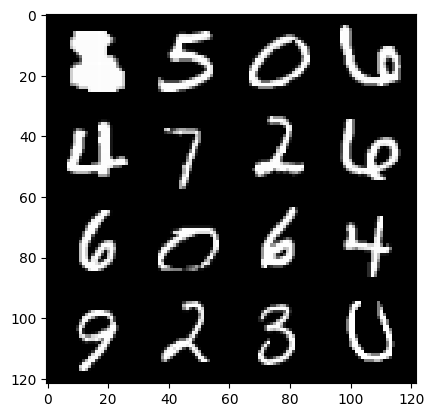

18: step 15900 / Gen loss: 6.408957266807554 / disc_loss: 0.01859419999023278


  0%|          | 0/469 [00:00<?, ?it/s]

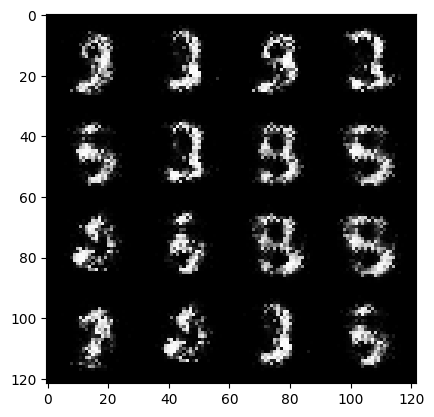

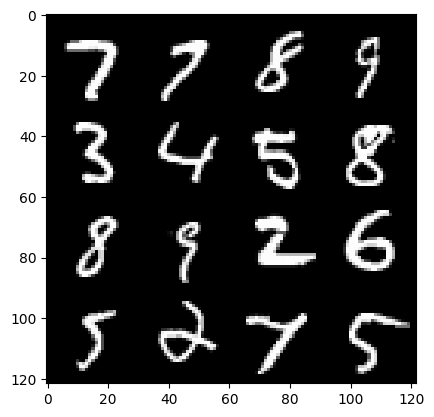

19: step 16200 / Gen loss: 6.25670400937398 / disc_loss: 0.017416372522711752


  0%|          | 0/469 [00:00<?, ?it/s]

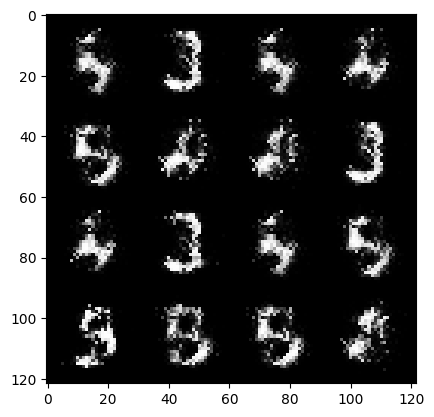

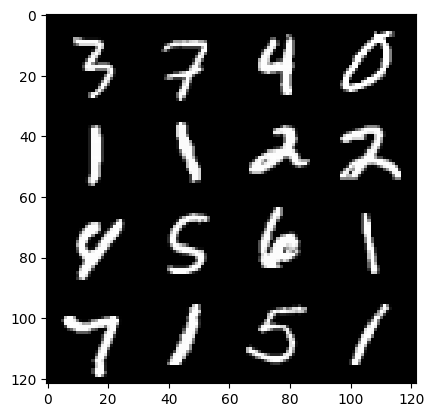

20: step 16500 / Gen loss: 6.47982286930084 / disc_loss: 0.017621069422457357


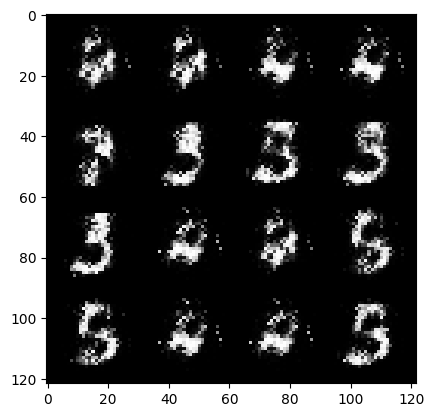

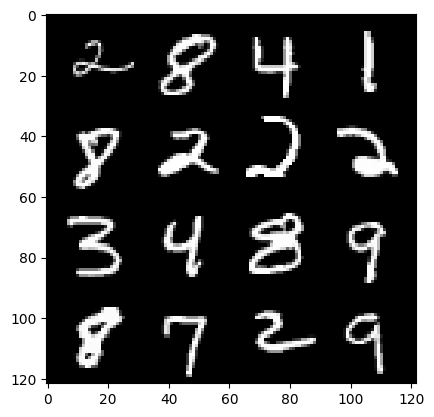

20: step 16800 / Gen loss: 6.209668351809186 / disc_loss: 0.018887139548702792


  0%|          | 0/469 [00:00<?, ?it/s]

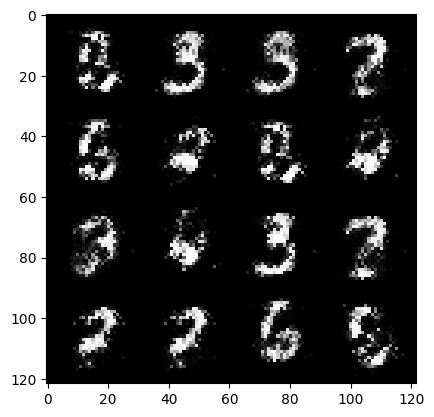

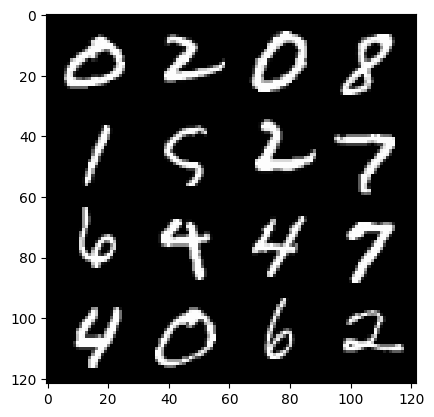

21: step 17100 / Gen loss: 6.255224776268007 / disc_loss: 0.02035770789176844


  0%|          | 0/469 [00:00<?, ?it/s]

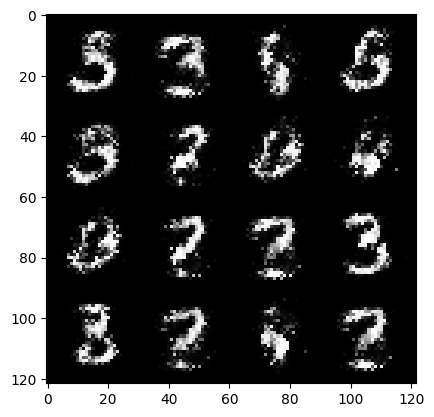

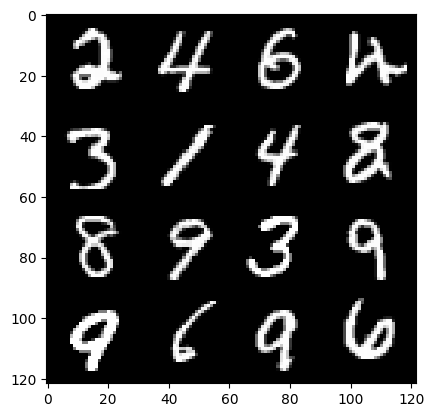

22: step 17400 / Gen loss: 6.256684815088907 / disc_loss: 0.019383356602241598


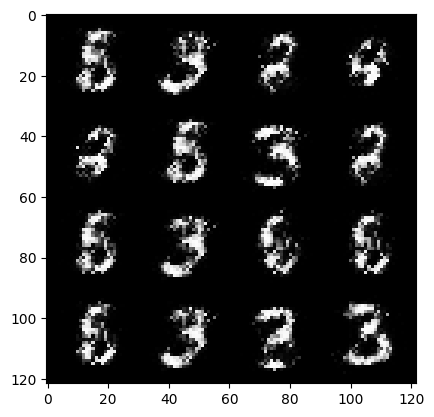

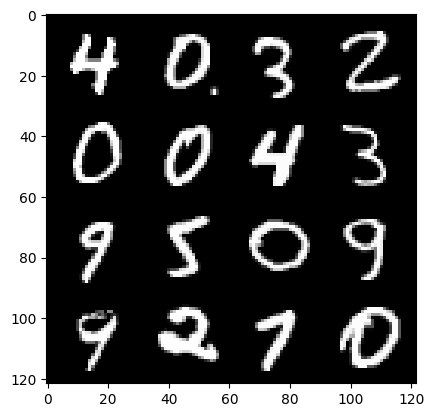

22: step 17700 / Gen loss: 6.233359622955319 / disc_loss: 0.019958842883352194


  0%|          | 0/469 [00:00<?, ?it/s]

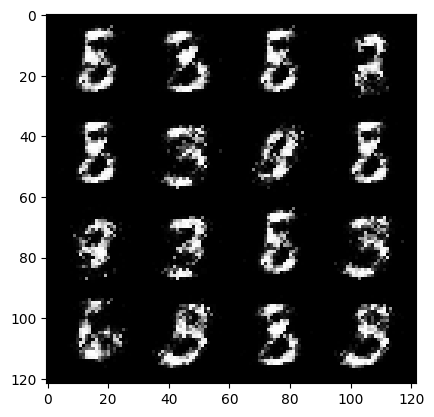

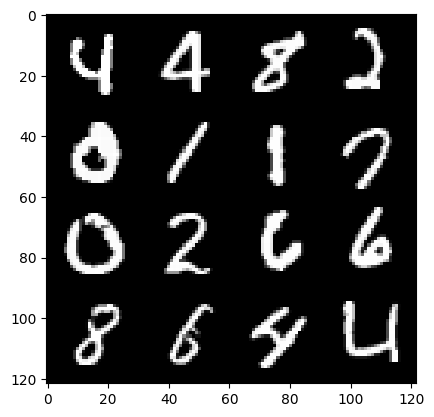

23: step 18000 / Gen loss: 6.181788660685215 / disc_loss: 0.02061792939590912


  0%|          | 0/469 [00:00<?, ?it/s]

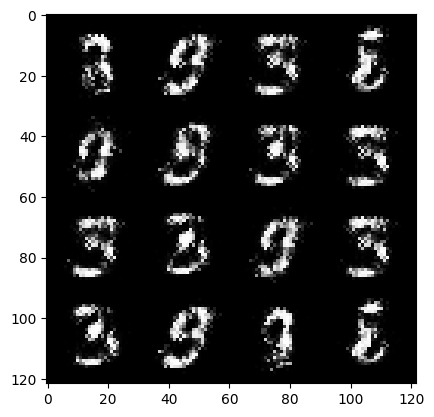

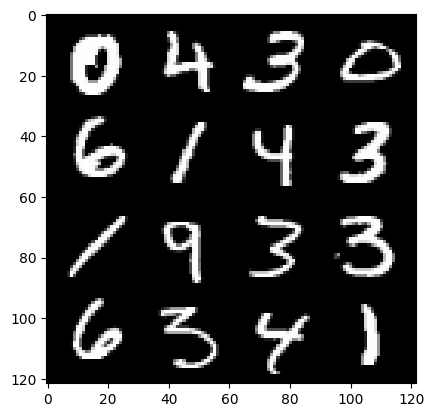

24: step 18300 / Gen loss: 6.0192721366882305 / disc_loss: 0.01935954757655659


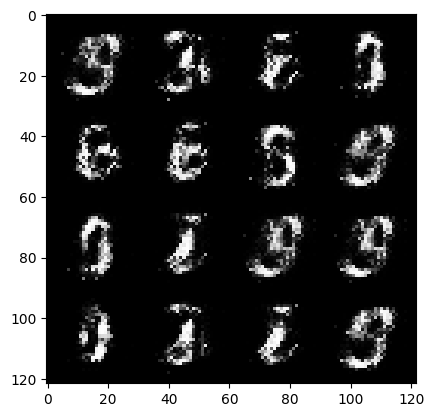

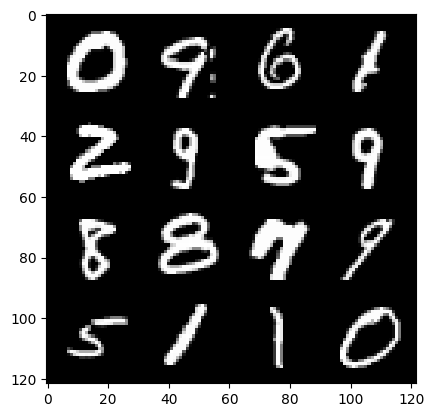

24: step 18600 / Gen loss: 6.232033031781514 / disc_loss: 0.02110079320147632


  0%|          | 0/469 [00:00<?, ?it/s]

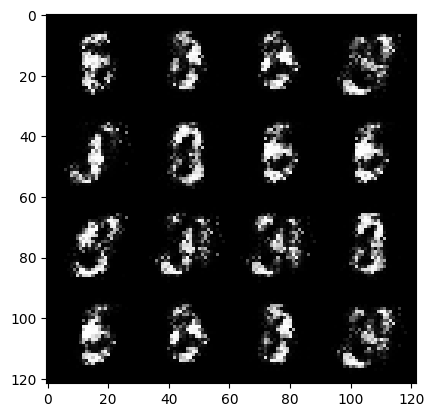

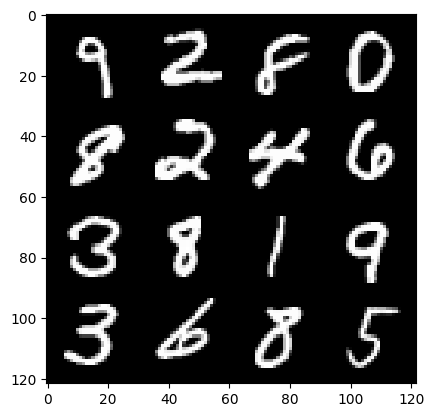

25: step 18900 / Gen loss: 5.879554522832233 / disc_loss: 0.02583371783141047


  0%|          | 0/469 [00:00<?, ?it/s]

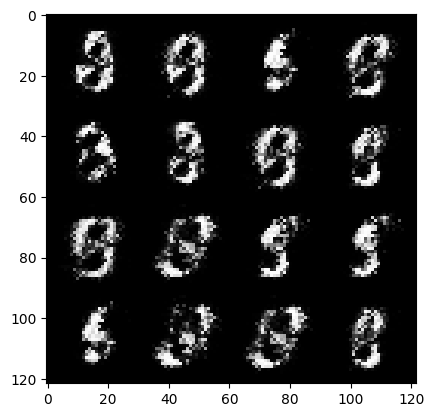

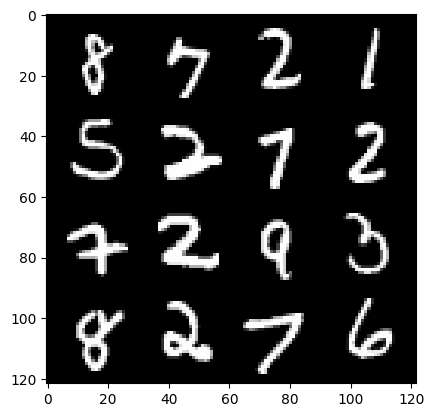

26: step 19200 / Gen loss: 5.992718981107077 / disc_loss: 0.025689382019142313


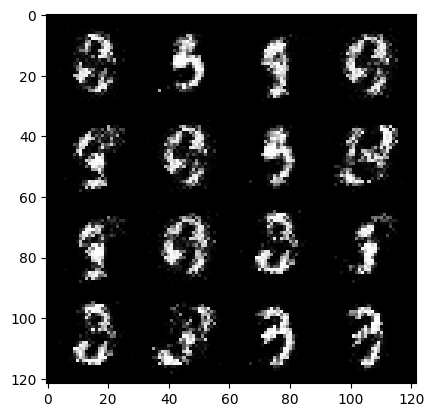

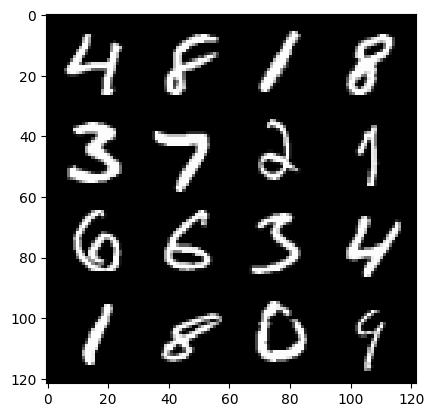

26: step 19500 / Gen loss: 5.983736774126687 / disc_loss: 0.028771800144265093


  0%|          | 0/469 [00:00<?, ?it/s]

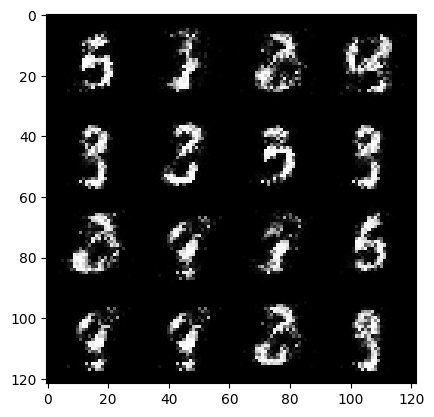

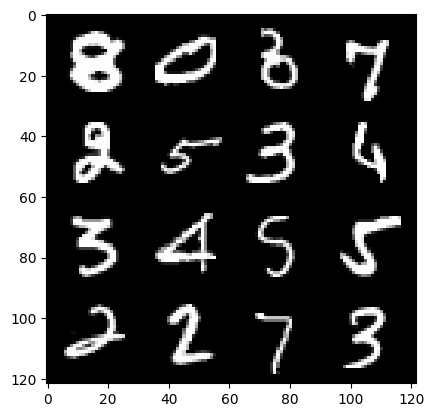

27: step 19800 / Gen loss: 5.944895861943559 / disc_loss: 0.027220867667347208


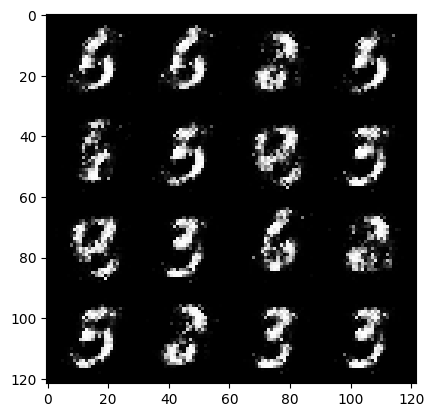

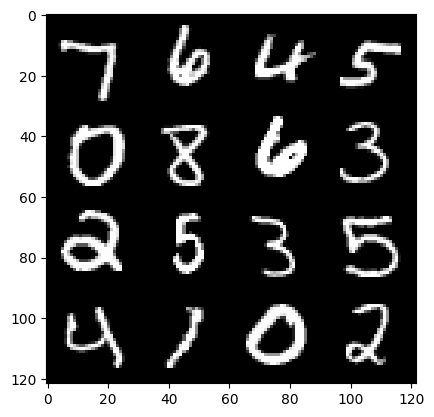

27: step 20100 / Gen loss: 6.004111917813618 / disc_loss: 0.026256342370373508


  0%|          | 0/469 [00:00<?, ?it/s]

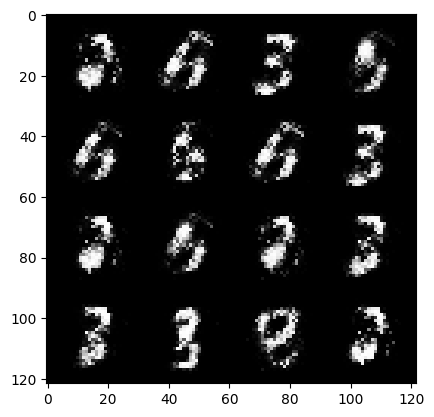

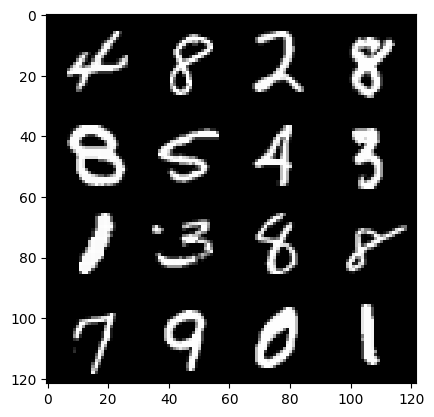

28: step 20400 / Gen loss: 5.734314510027567 / disc_loss: 0.031289177630096664


  0%|          | 0/469 [00:00<?, ?it/s]

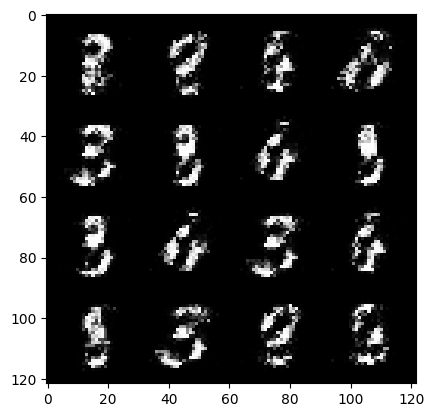

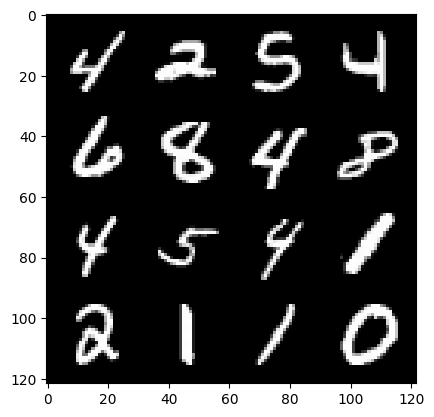

29: step 20700 / Gen loss: 5.435675252278644 / disc_loss: 0.0316007356531918


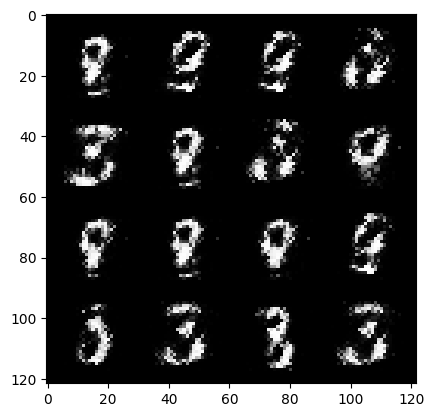

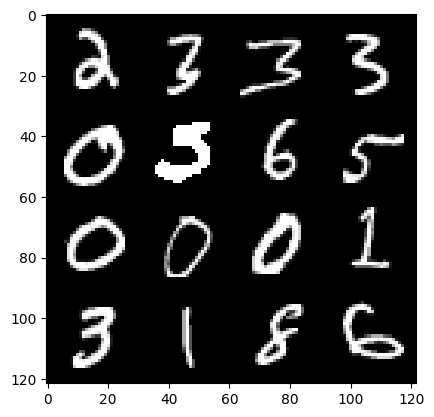

29: step 21000 / Gen loss: 5.8544692325592 / disc_loss: 0.027449825576040896


  0%|          | 0/469 [00:00<?, ?it/s]

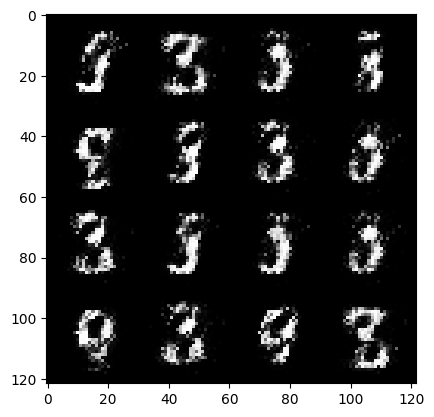

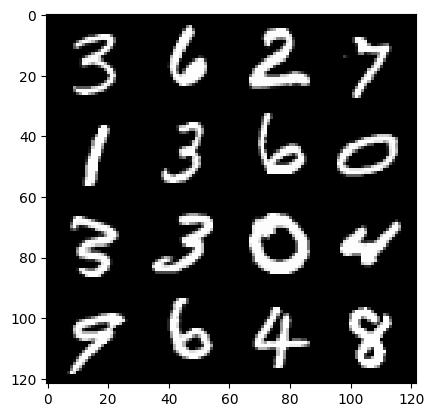

30: step 21300 / Gen loss: 5.714701393445335 / disc_loss: 0.03165749984793366


  0%|          | 0/469 [00:00<?, ?it/s]

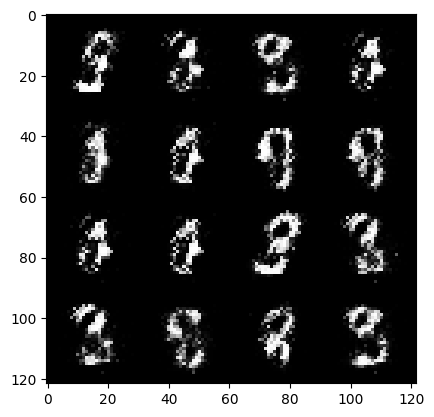

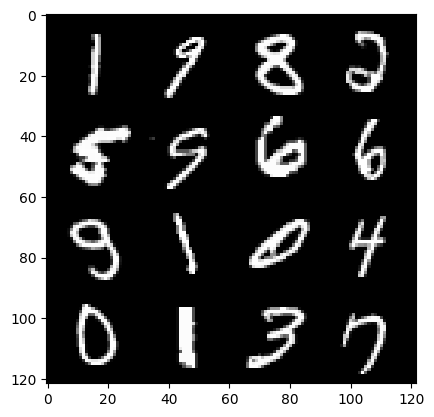

31: step 21600 / Gen loss: 6.063143765131638 / disc_loss: 0.030901770556035133


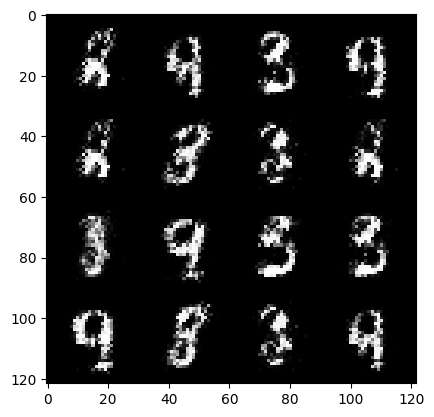

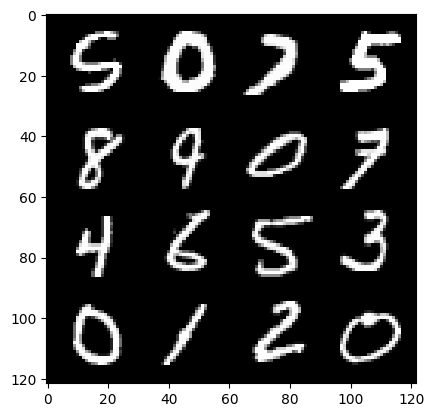

31: step 21900 / Gen loss: 5.89024444103241 / disc_loss: 0.03153039711837968


  0%|          | 0/469 [00:00<?, ?it/s]

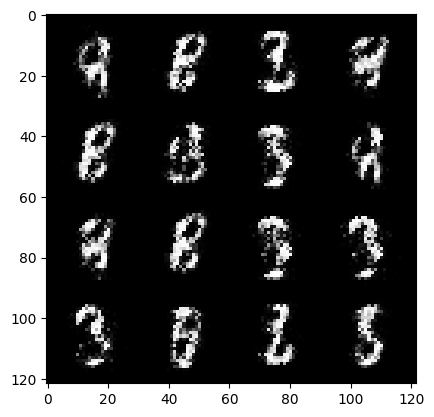

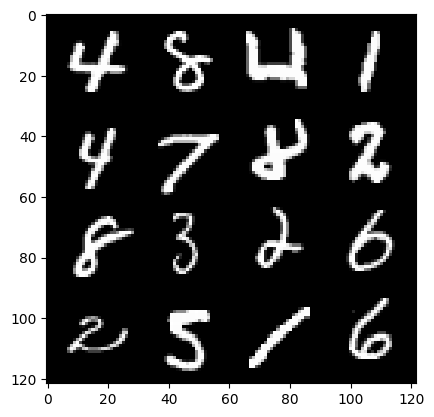

32: step 22200 / Gen loss: 5.47790485858917 / disc_loss: 0.034005023818463084


  0%|          | 0/469 [00:00<?, ?it/s]

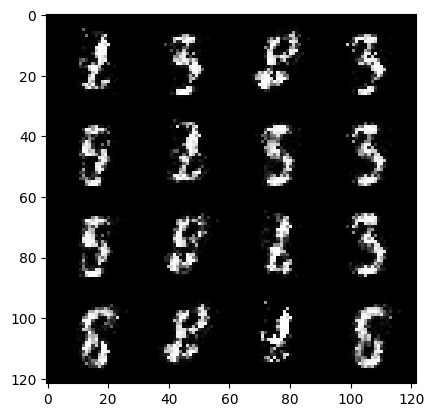

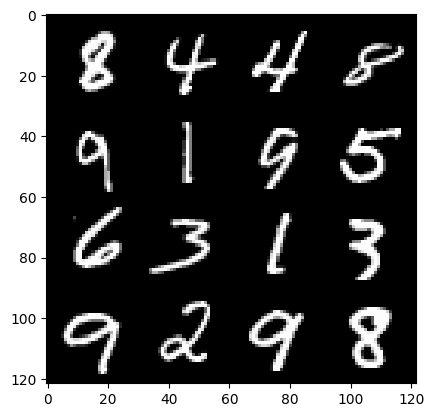

33: step 22500 / Gen loss: 5.413884797096249 / disc_loss: 0.044227395337075


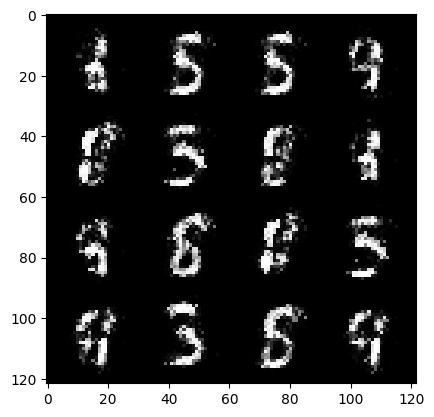

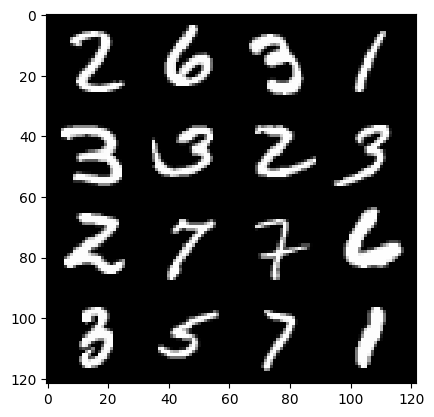

33: step 22800 / Gen loss: 5.536560686429341 / disc_loss: 0.04604765506616486


  0%|          | 0/469 [00:00<?, ?it/s]

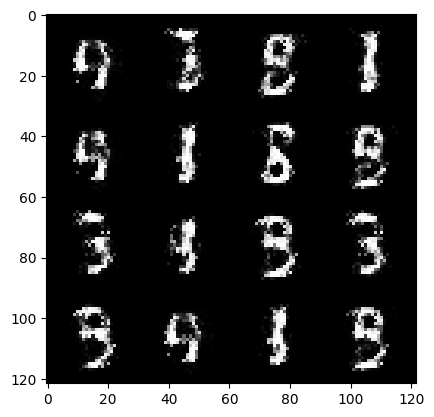

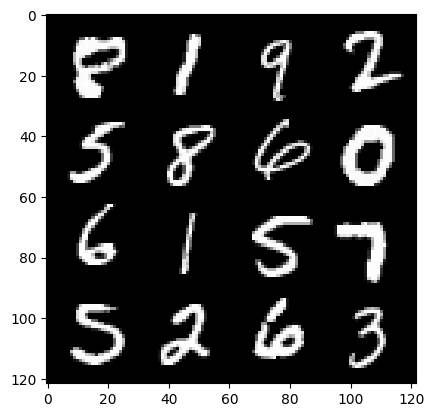

34: step 23100 / Gen loss: 5.459930836359651 / disc_loss: 0.03670825071632859


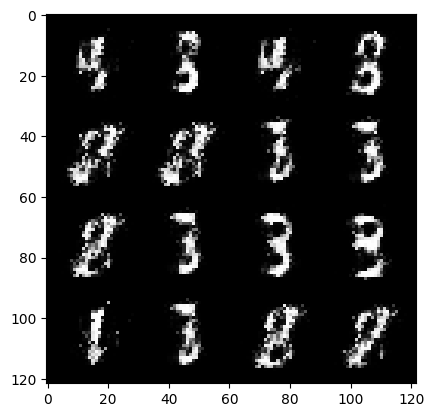

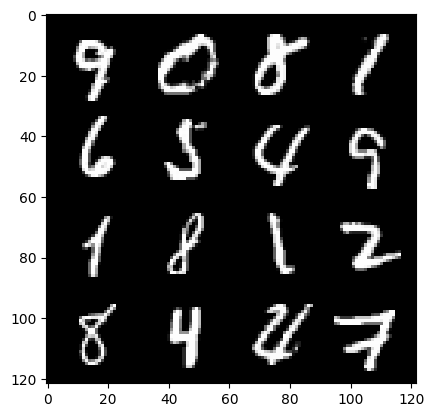

34: step 23400 / Gen loss: 5.39034079551697 / disc_loss: 0.04126735217248397


  0%|          | 0/469 [00:00<?, ?it/s]

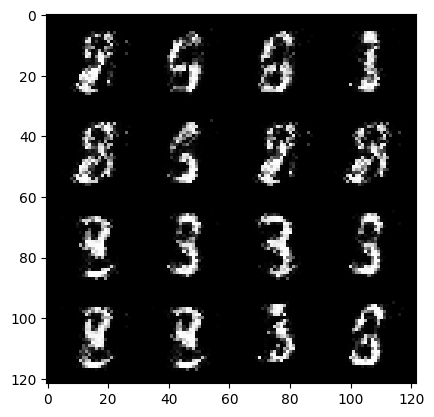

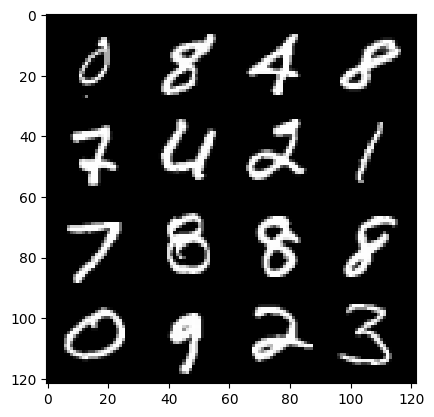

35: step 23700 / Gen loss: 5.522871197064719 / disc_loss: 0.041673058667220195


  0%|          | 0/469 [00:00<?, ?it/s]

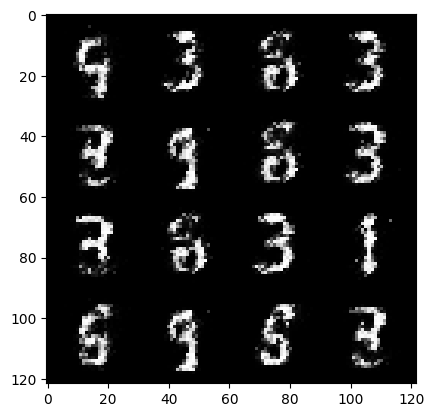

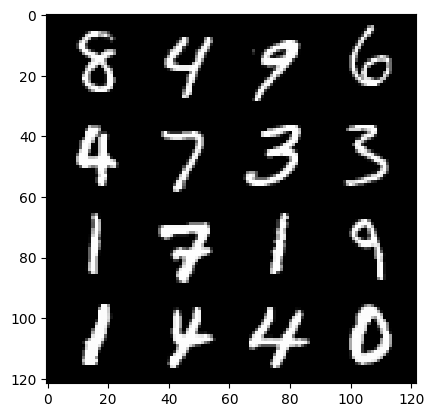

36: step 24000 / Gen loss: 5.444140227635699 / disc_loss: 0.039566300412019056


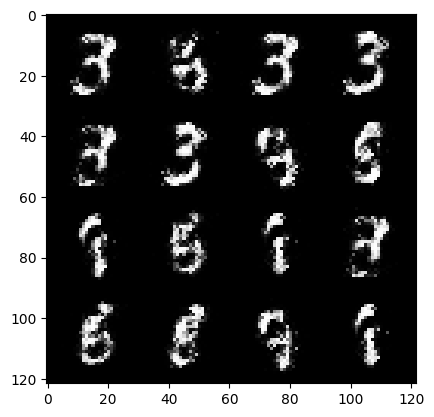

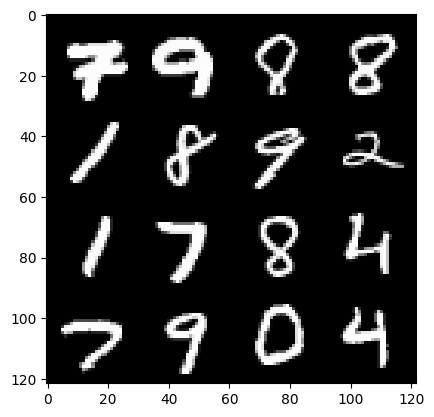

36: step 24300 / Gen loss: 5.218081197738647 / disc_loss: 0.05465131798448664


  0%|          | 0/469 [00:00<?, ?it/s]

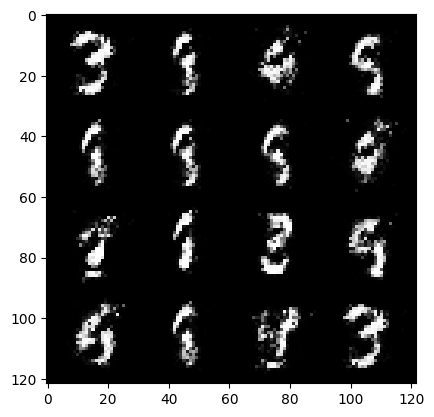

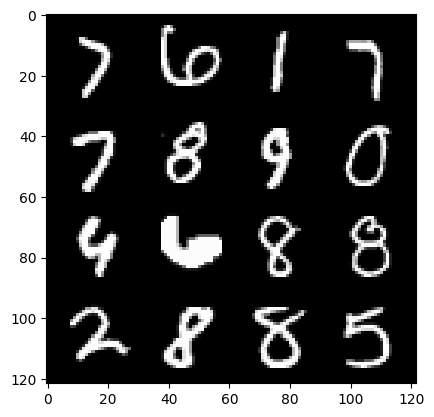

37: step 24600 / Gen loss: 5.56743369897207 / disc_loss: 0.04723465423720574


  0%|          | 0/469 [00:00<?, ?it/s]

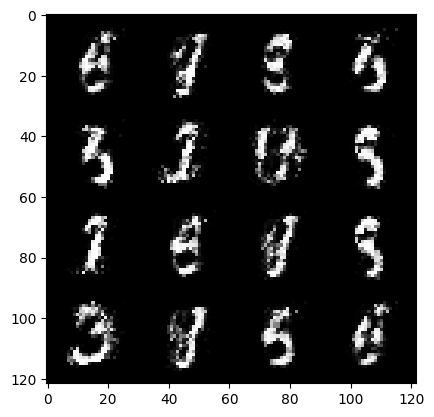

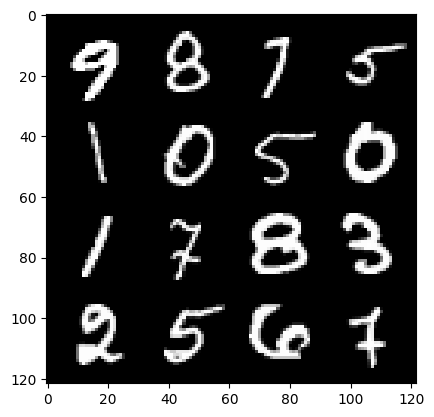

38: step 24900 / Gen loss: 5.233965026537577 / disc_loss: 0.04940531515826777


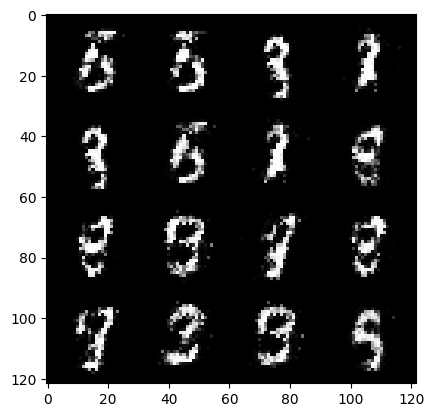

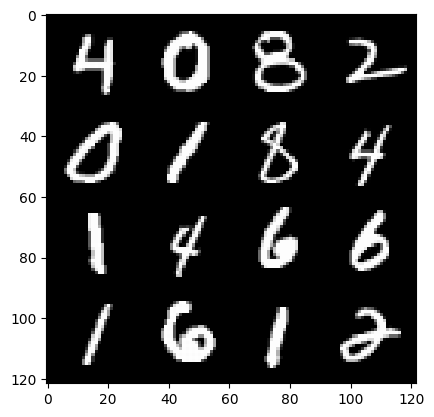

38: step 25200 / Gen loss: 5.108113436698908 / disc_loss: 0.04122062885512909


  0%|          | 0/469 [00:00<?, ?it/s]

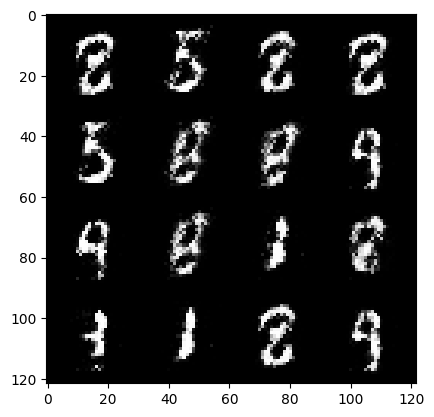

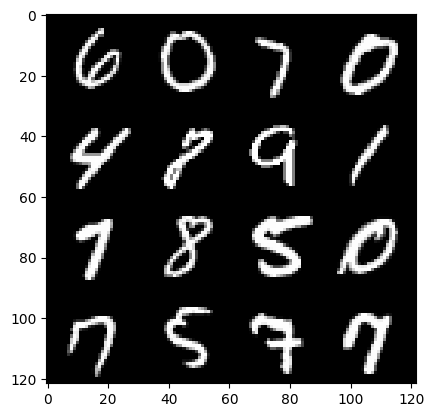

39: step 25500 / Gen loss: 5.306714042027794 / disc_loss: 0.04887258576850094


  0%|          | 0/469 [00:00<?, ?it/s]

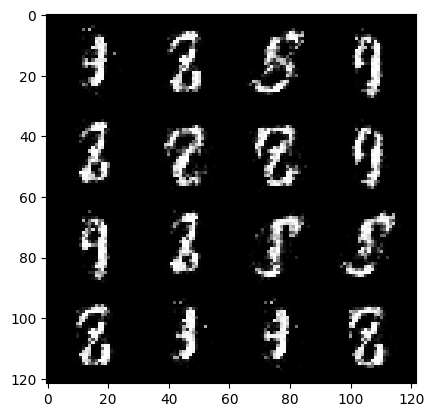

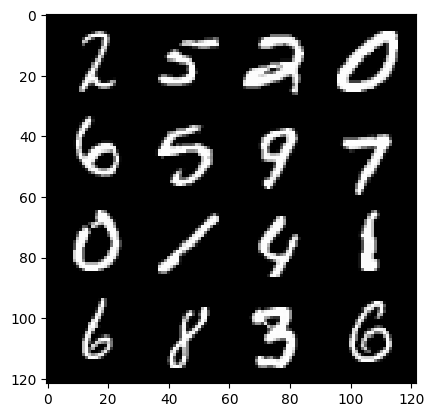

40: step 25800 / Gen loss: 5.092299973169963 / disc_loss: 0.059684658690045314


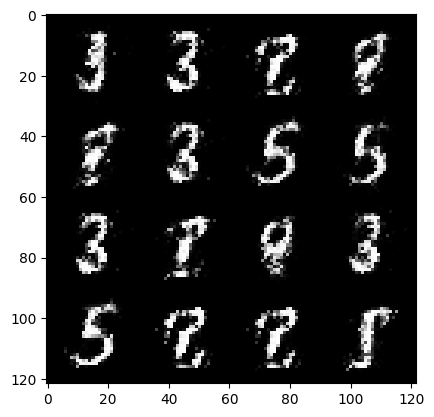

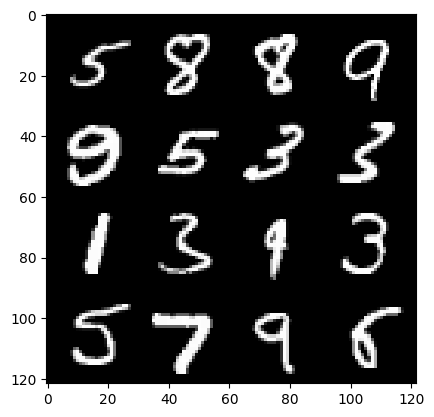

40: step 26100 / Gen loss: 5.2440184974670405 / disc_loss: 0.04230796068906784


  0%|          | 0/469 [00:00<?, ?it/s]

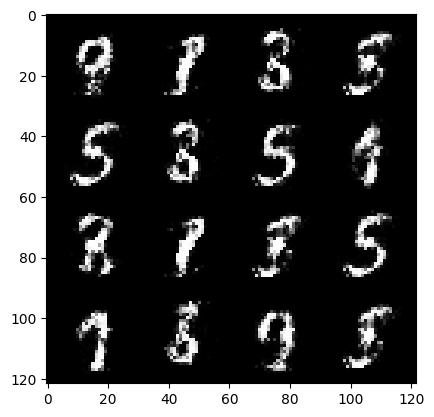

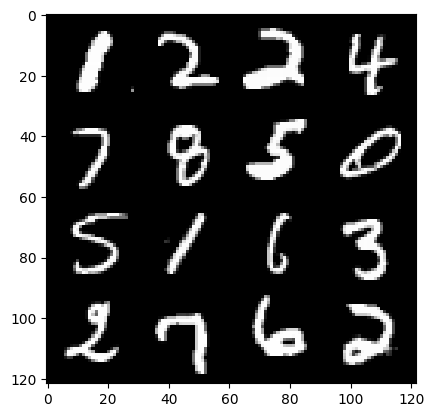

41: step 26400 / Gen loss: 5.386453111966451 / disc_loss: 0.04082581067147354


  0%|          | 0/469 [00:00<?, ?it/s]

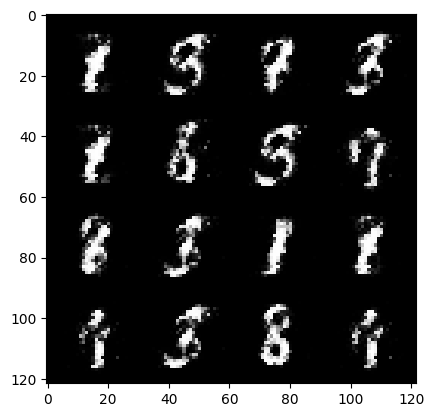

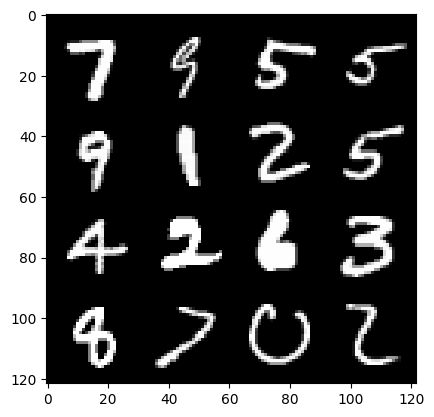

42: step 26700 / Gen loss: 4.918596716721854 / disc_loss: 0.05112557798313594


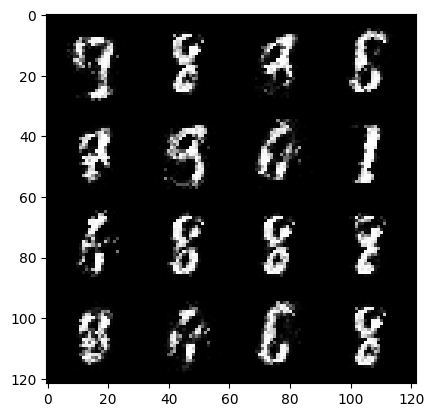

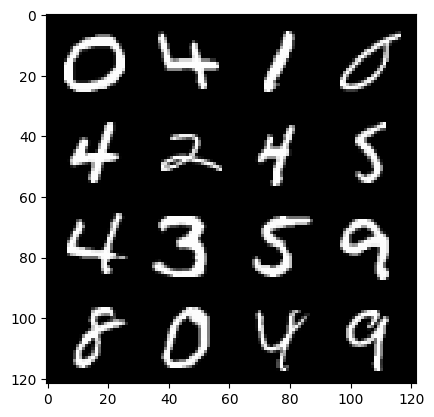

42: step 27000 / Gen loss: 4.984061999320983 / disc_loss: 0.05309041735716167


  0%|          | 0/469 [00:00<?, ?it/s]

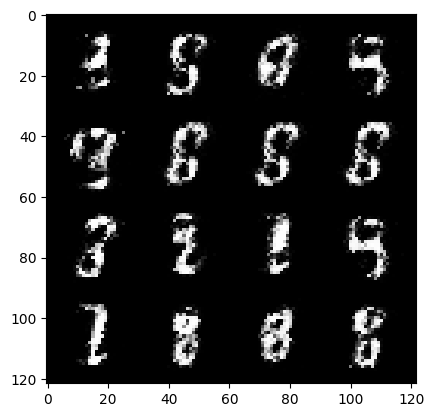

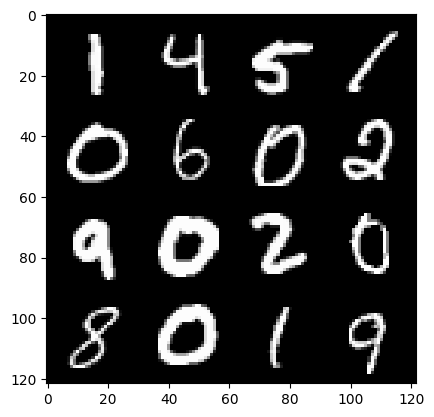

43: step 27300 / Gen loss: 5.311106823285422 / disc_loss: 0.054696324774995454


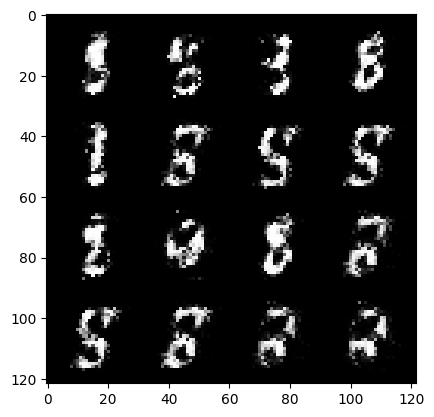

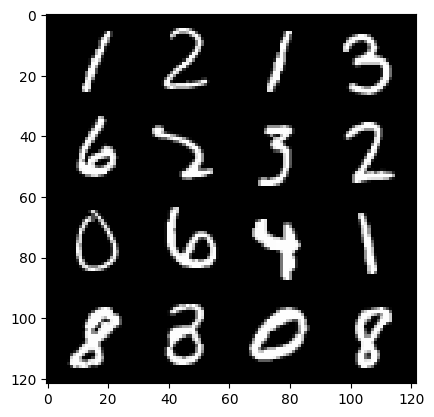

43: step 27600 / Gen loss: 5.09905610322952 / disc_loss: 0.06049642282227678


  0%|          | 0/469 [00:00<?, ?it/s]

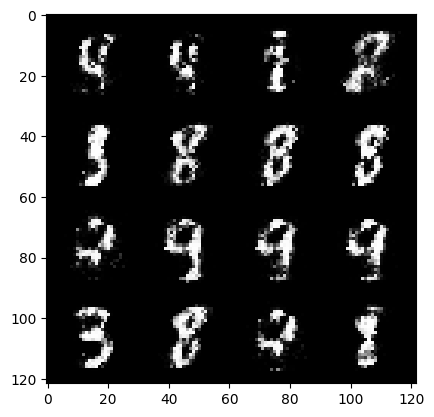

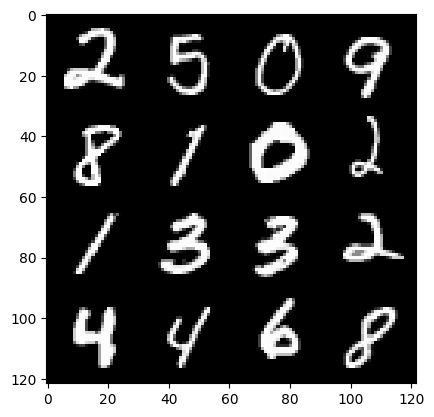

44: step 27900 / Gen loss: 5.427477103869122 / disc_loss: 0.053642443933834605


  0%|          | 0/469 [00:00<?, ?it/s]

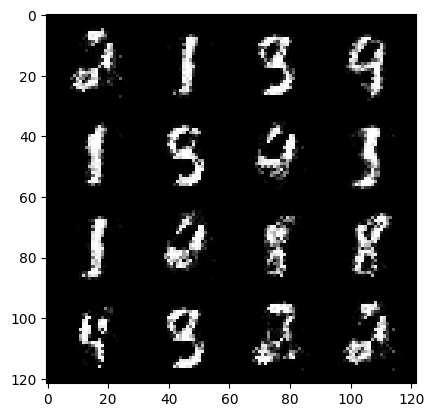

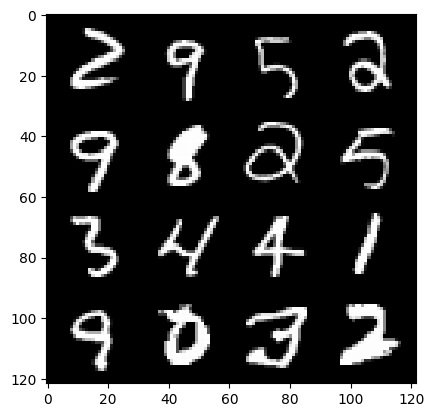

45: step 28200 / Gen loss: 5.043153464794159 / disc_loss: 0.05773396442644304


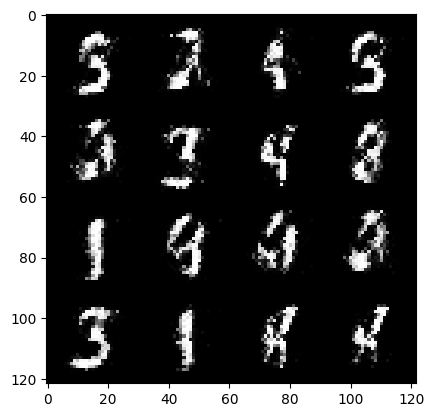

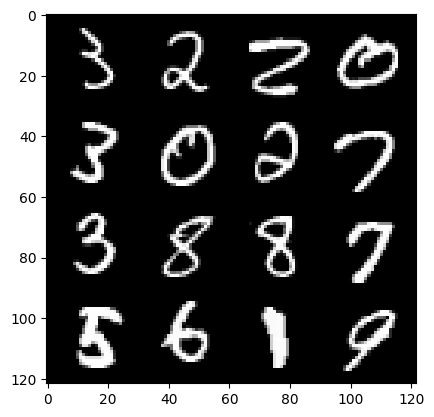

45: step 28500 / Gen loss: 4.820423308213551 / disc_loss: 0.061778279369076115


  0%|          | 0/469 [00:00<?, ?it/s]

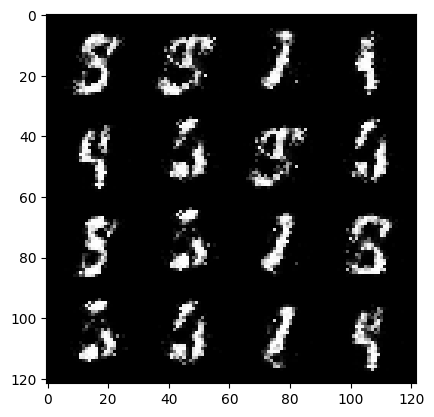

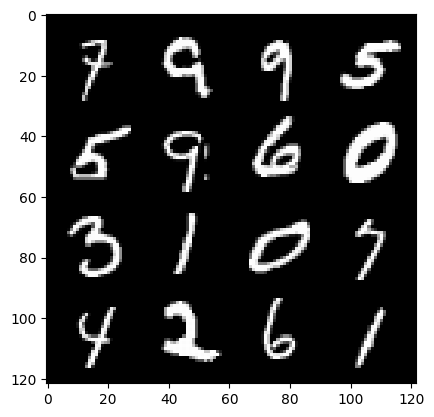

46: step 28800 / Gen loss: 5.155078554948171 / disc_loss: 0.056718417772402364


  0%|          | 0/469 [00:00<?, ?it/s]

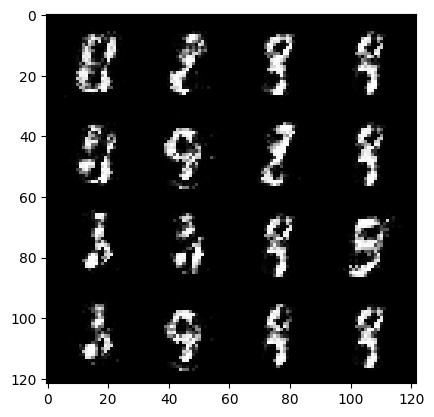

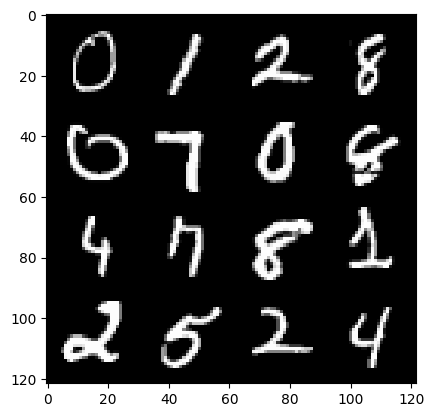

47: step 29100 / Gen loss: 4.830467480818432 / disc_loss: 0.06132076313719156


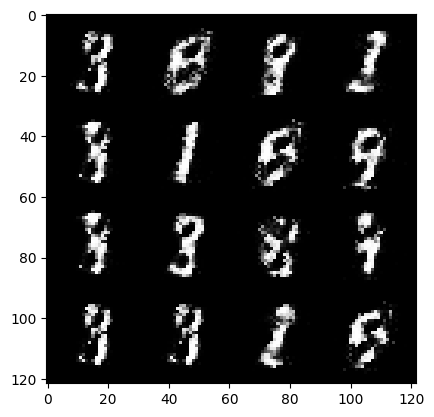

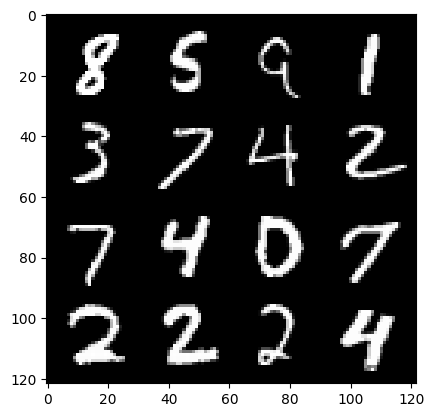

47: step 29400 / Gen loss: 4.576442310810092 / disc_loss: 0.07500336514785891


  0%|          | 0/469 [00:00<?, ?it/s]

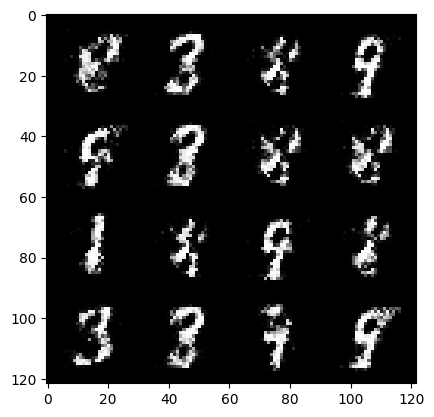

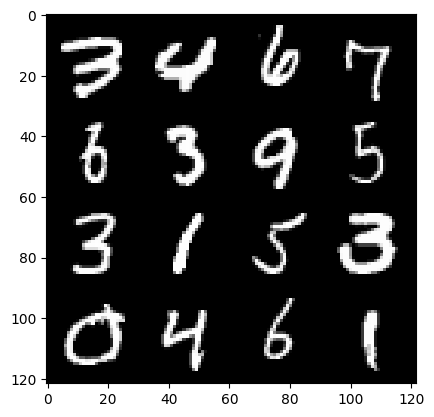

48: step 29700 / Gen loss: 4.5228394635518345 / disc_loss: 0.07064345876996714


  0%|          | 0/469 [00:00<?, ?it/s]

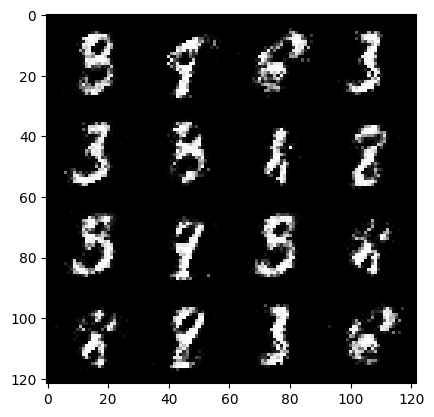

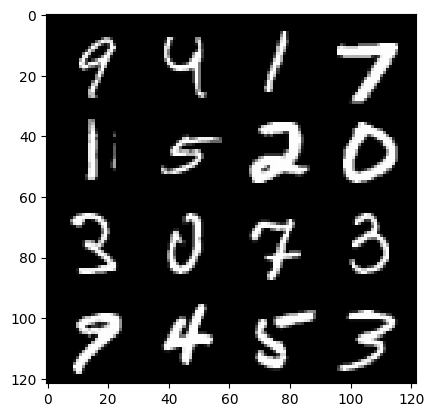

49: step 30000 / Gen loss: 4.618536210060121 / disc_loss: 0.06368049944440524


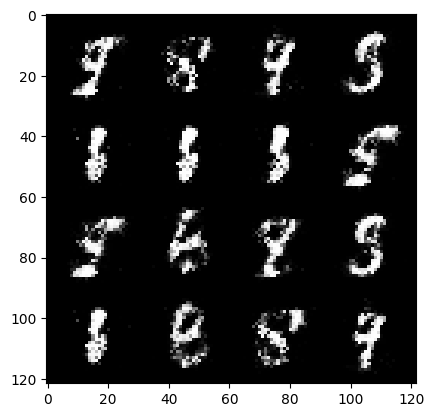

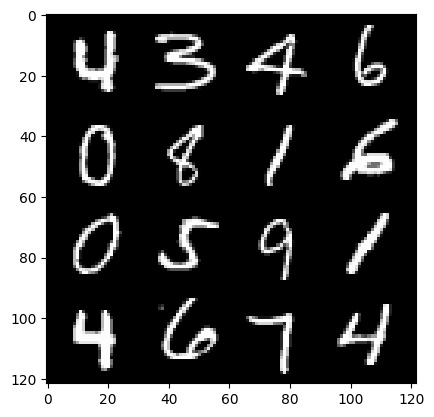

49: step 30300 / Gen loss: 4.773404107888535 / disc_loss: 0.06780522689223287


  0%|          | 0/469 [00:00<?, ?it/s]

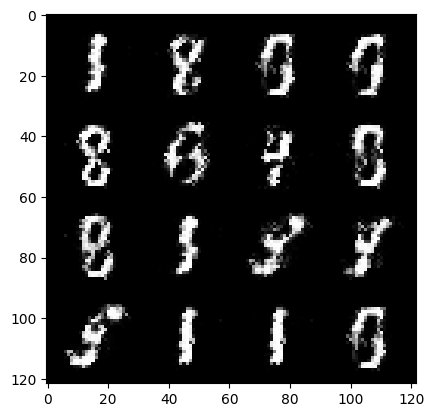

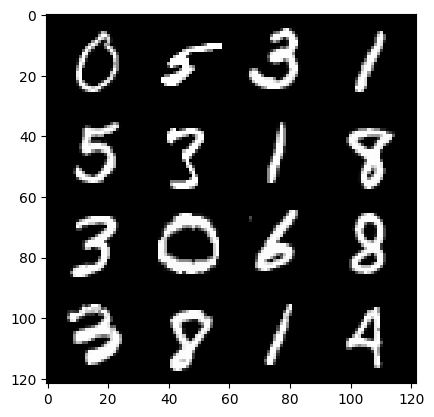

50: step 30600 / Gen loss: 4.546303838094073 / disc_loss: 0.06710125448182228


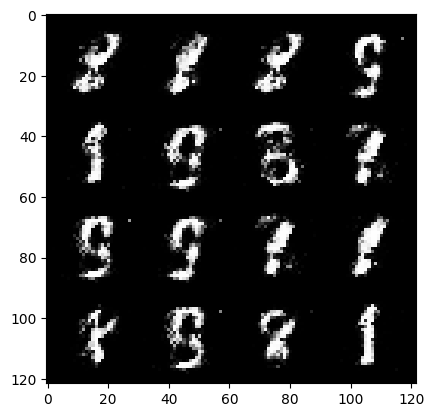

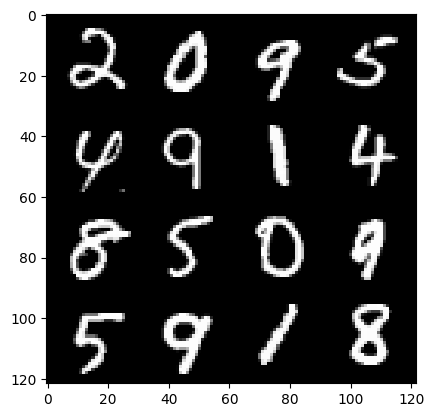

50: step 30900 / Gen loss: 4.663219672044119 / disc_loss: 0.06566251626238227


  0%|          | 0/469 [00:00<?, ?it/s]

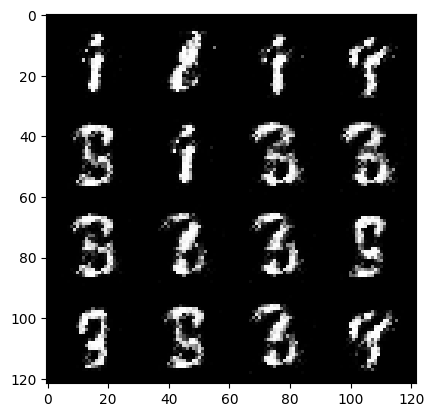

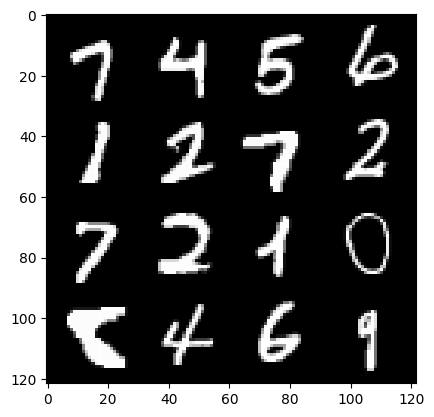

51: step 31200 / Gen loss: 4.6333242774009715 / disc_loss: 0.0689074520083765


  0%|          | 0/469 [00:00<?, ?it/s]

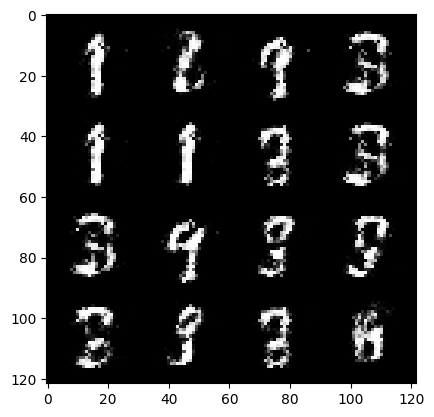

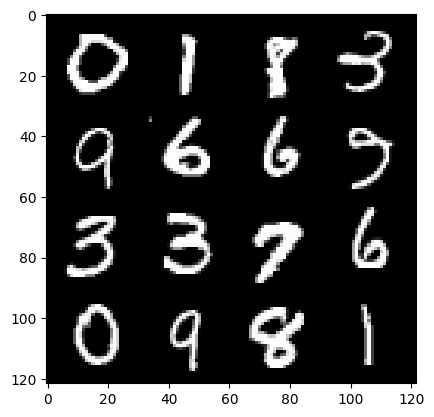

52: step 31500 / Gen loss: 4.643001337051394 / disc_loss: 0.06502009322245914


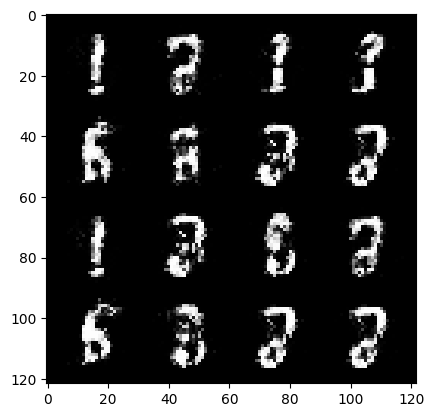

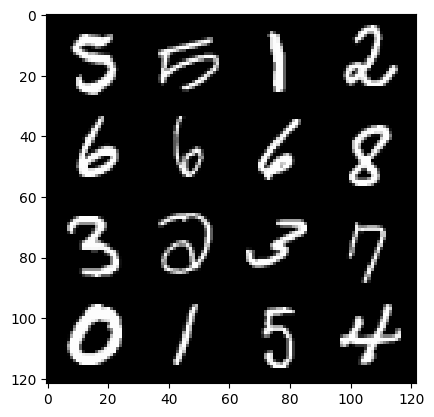

52: step 31800 / Gen loss: 4.738776704470316 / disc_loss: 0.06443473246569435


  0%|          | 0/469 [00:00<?, ?it/s]

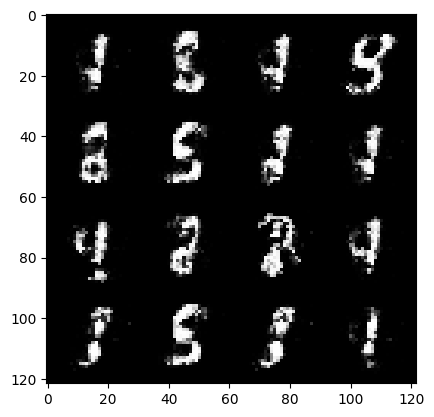

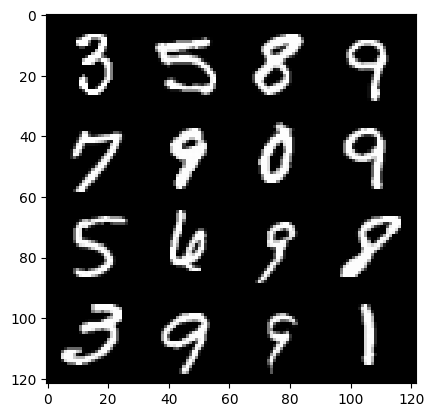

53: step 32100 / Gen loss: 4.752346811294553 / disc_loss: 0.06515518867410719


  0%|          | 0/469 [00:00<?, ?it/s]

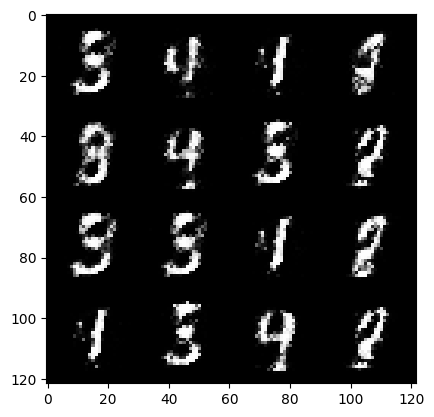

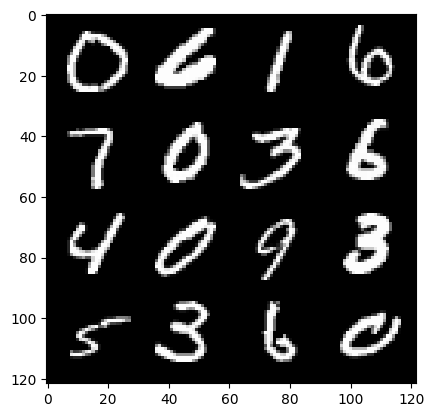

54: step 32400 / Gen loss: 4.521007777055103 / disc_loss: 0.07856162975231813


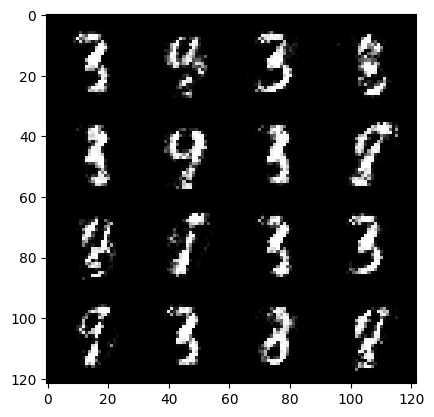

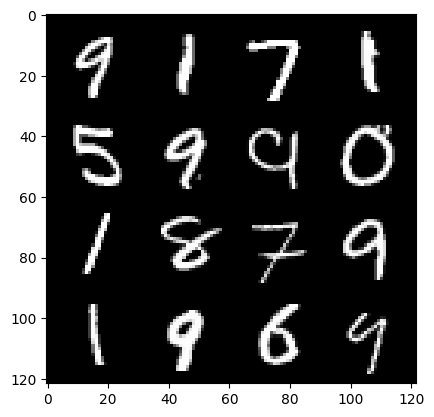

54: step 32700 / Gen loss: 4.378674545288085 / disc_loss: 0.08353152130420008


  0%|          | 0/469 [00:00<?, ?it/s]

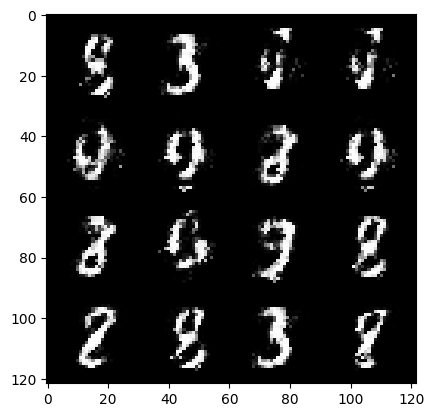

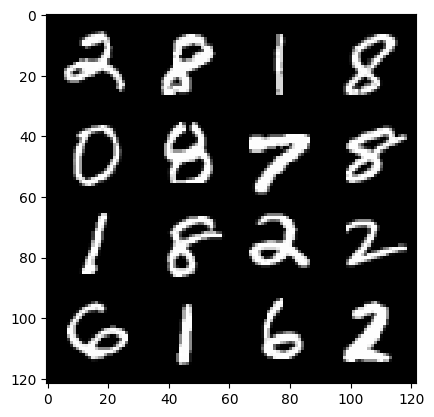

55: step 33000 / Gen loss: 4.43071286201477 / disc_loss: 0.07245025834068658


  0%|          | 0/469 [00:00<?, ?it/s]

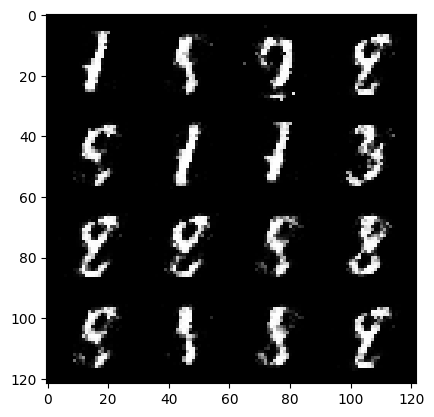

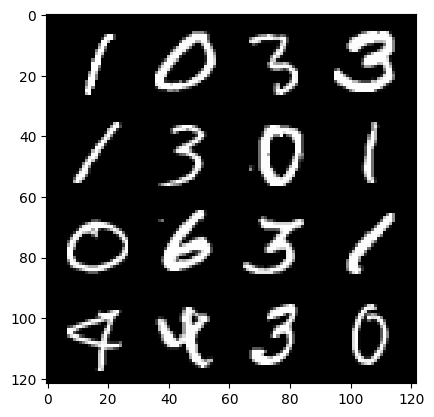

56: step 33300 / Gen loss: 4.576182974974316 / disc_loss: 0.06671075930818916


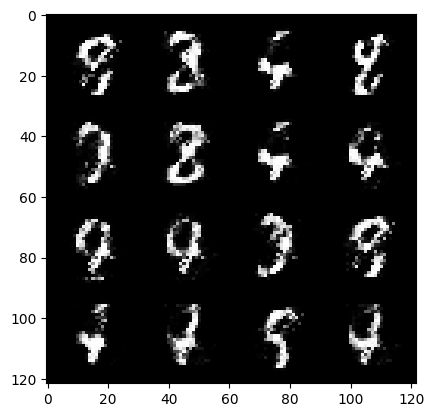

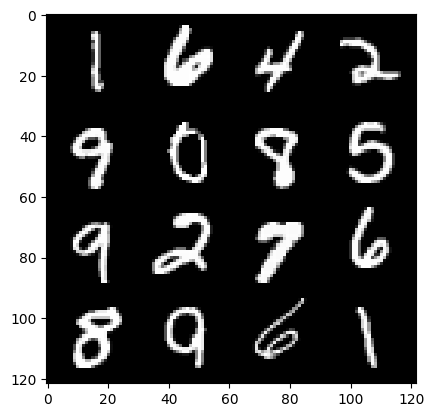

56: step 33600 / Gen loss: 4.492161933581035 / disc_loss: 0.06724639005338152


  0%|          | 0/469 [00:00<?, ?it/s]

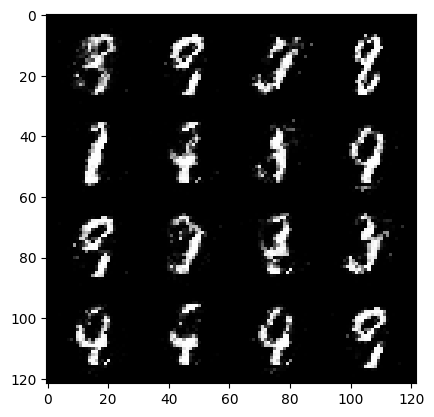

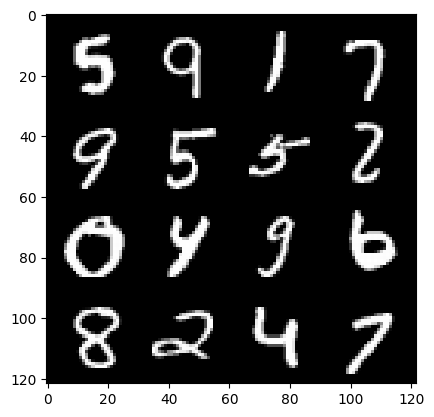

57: step 33900 / Gen loss: 4.802414319515231 / disc_loss: 0.06023028164791562


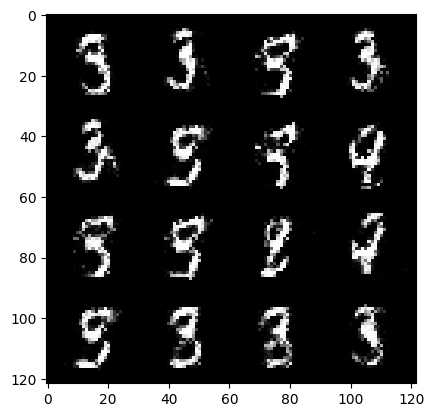

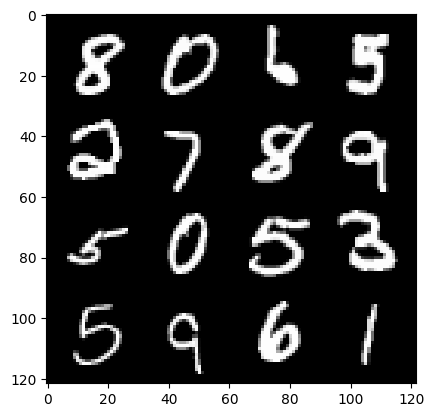

57: step 34200 / Gen loss: 5.023641292254129 / disc_loss: 0.06398168238500754


  0%|          | 0/469 [00:00<?, ?it/s]

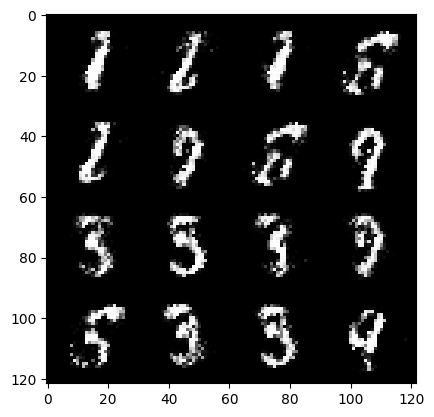

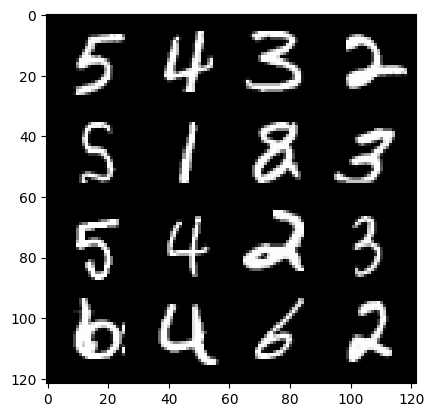

58: step 34500 / Gen loss: 4.851657100518543 / disc_loss: 0.06292744273630282


  0%|          | 0/469 [00:00<?, ?it/s]

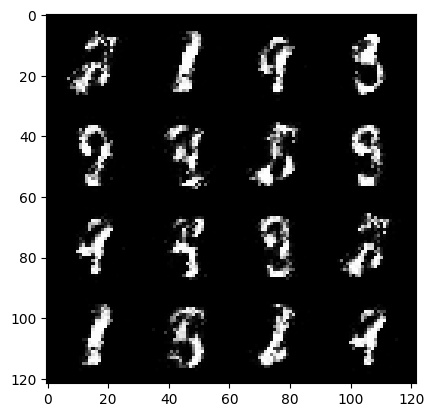

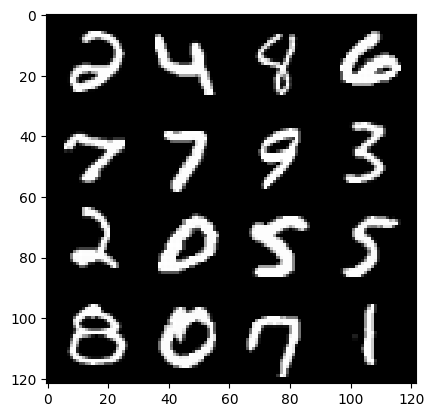

59: step 34800 / Gen loss: 4.928972469170888 / disc_loss: 0.0604605332389474


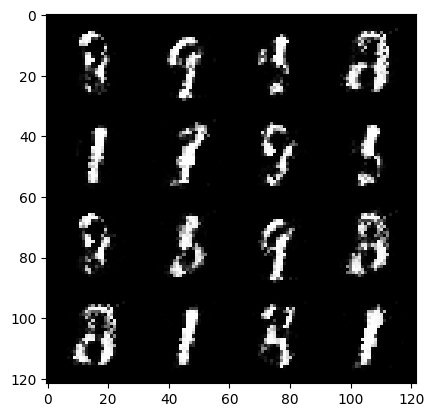

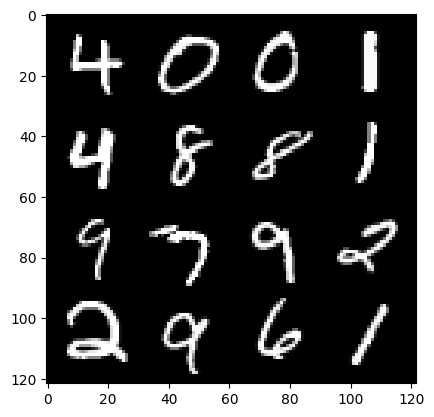

59: step 35100 / Gen loss: 4.615671462217967 / disc_loss: 0.07322531925514343


  0%|          | 0/469 [00:00<?, ?it/s]

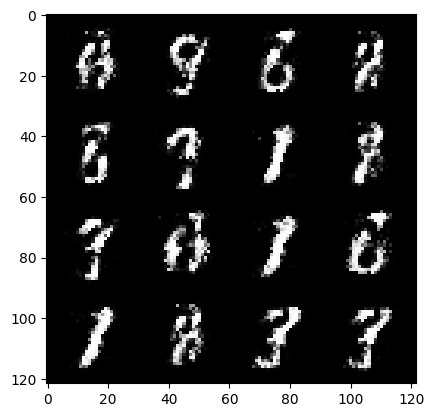

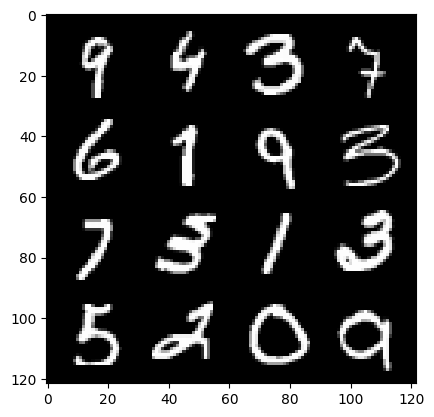

60: step 35400 / Gen loss: 4.6472835413614915 / disc_loss: 0.0771597478849193


  0%|          | 0/469 [00:00<?, ?it/s]

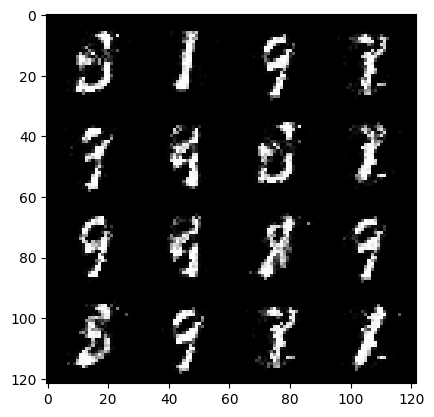

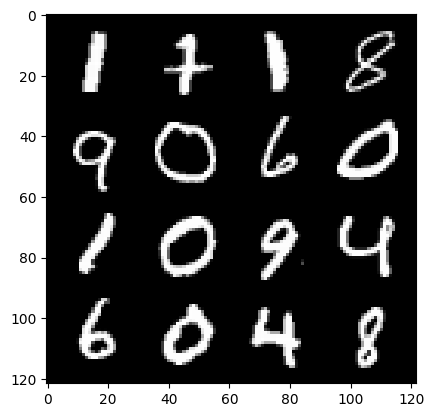

61: step 35700 / Gen loss: 4.569544177850091 / disc_loss: 0.0705455935498079


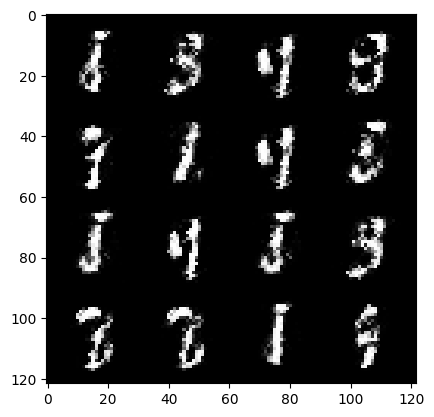

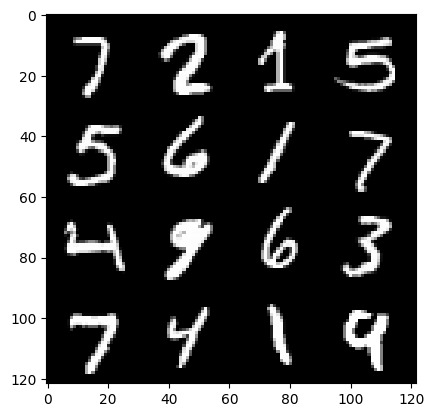

61: step 36000 / Gen loss: 4.450370325247443 / disc_loss: 0.081867628513525


  0%|          | 0/469 [00:00<?, ?it/s]

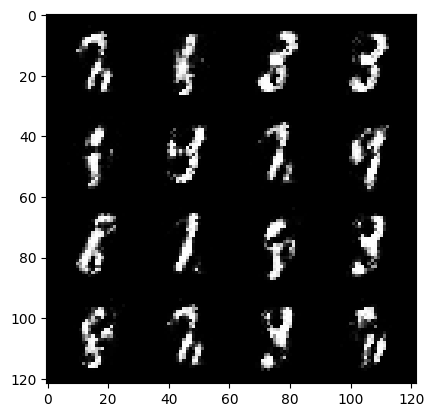

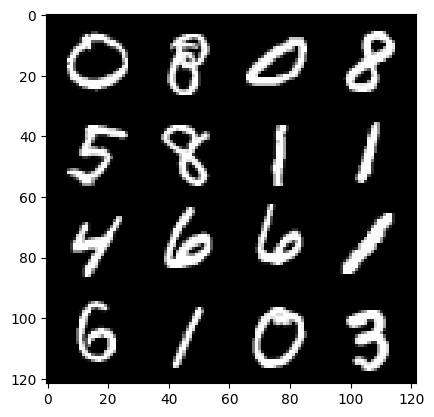

62: step 36300 / Gen loss: 3.9968144599596633 / disc_loss: 0.09513294549038008


  0%|          | 0/469 [00:00<?, ?it/s]

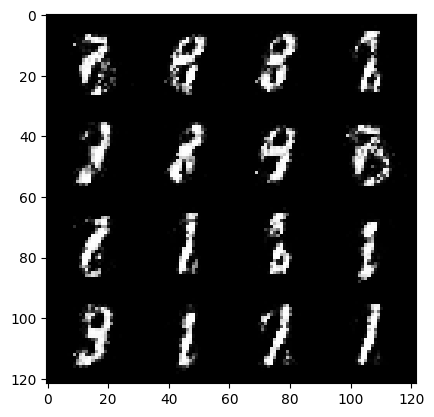

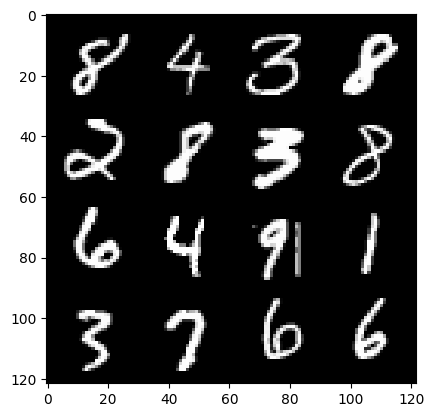

63: step 36600 / Gen loss: 3.9414366443951936 / disc_loss: 0.09857310513034458


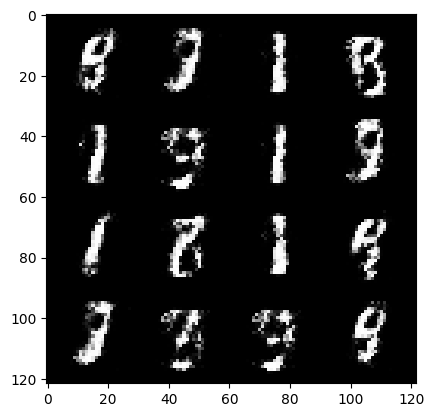

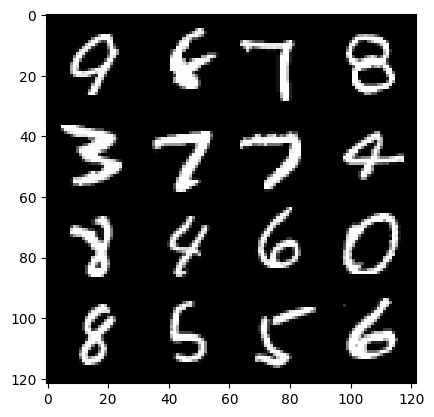

63: step 36900 / Gen loss: 3.9064044650395724 / disc_loss: 0.11271091849853589


  0%|          | 0/469 [00:00<?, ?it/s]

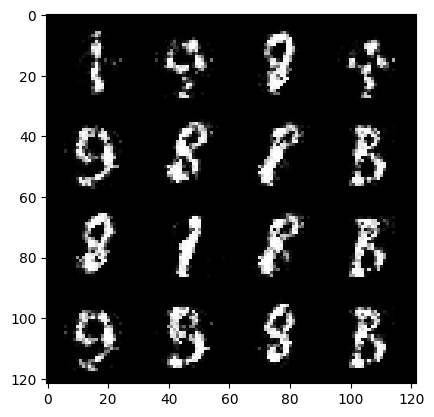

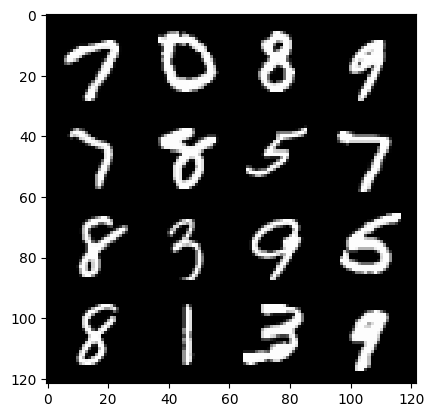

64: step 37200 / Gen loss: 3.9102095691363017 / disc_loss: 0.10364856568475567


  0%|          | 0/469 [00:00<?, ?it/s]

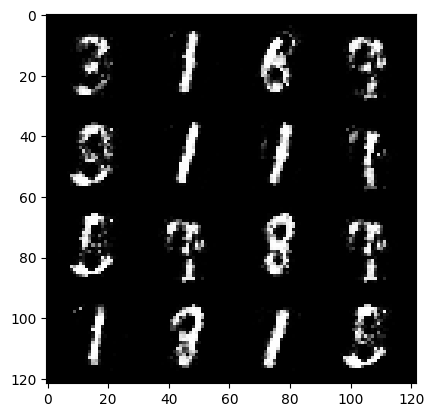

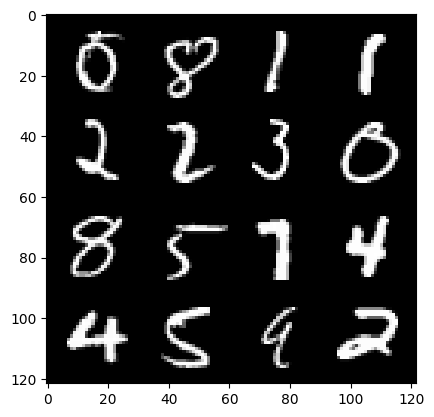

65: step 37500 / Gen loss: 3.9531779011090595 / disc_loss: 0.10905198847254105


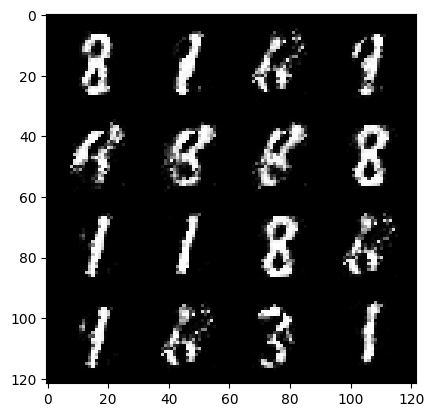

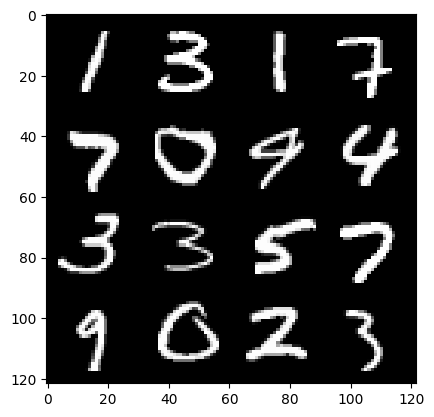

65: step 37800 / Gen loss: 4.036894566218057 / disc_loss: 0.12230734334637722


  0%|          | 0/469 [00:00<?, ?it/s]

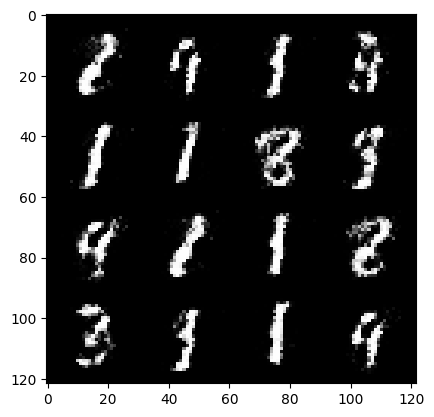

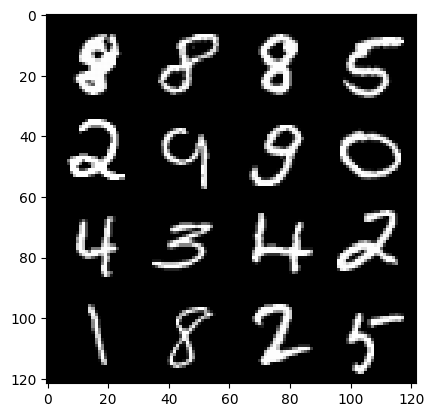

66: step 38100 / Gen loss: 3.934884039560955 / disc_loss: 0.12006431244313719


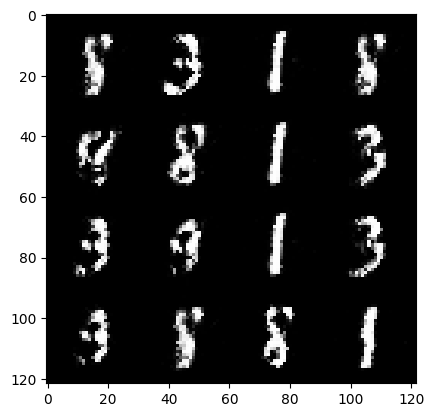

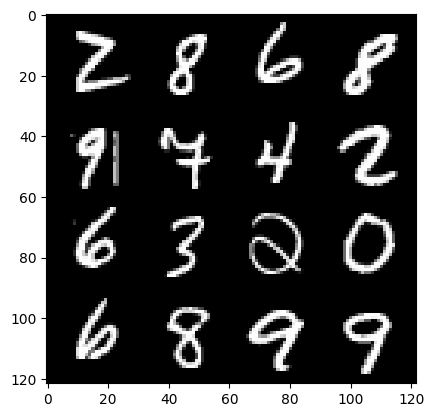

66: step 38400 / Gen loss: 3.556778922875723 / disc_loss: 0.12940881278365848


  0%|          | 0/469 [00:00<?, ?it/s]

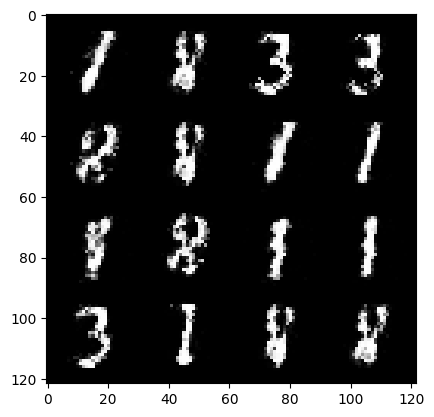

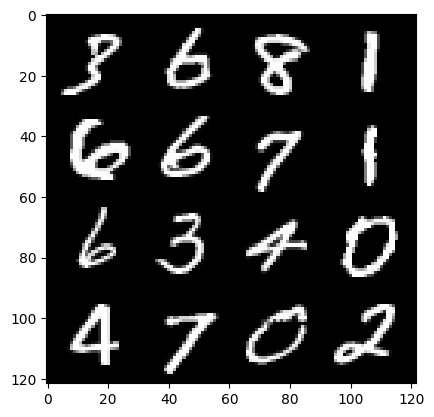

67: step 38700 / Gen loss: 3.6396201189359023 / disc_loss: 0.11857399853567281


  0%|          | 0/469 [00:00<?, ?it/s]

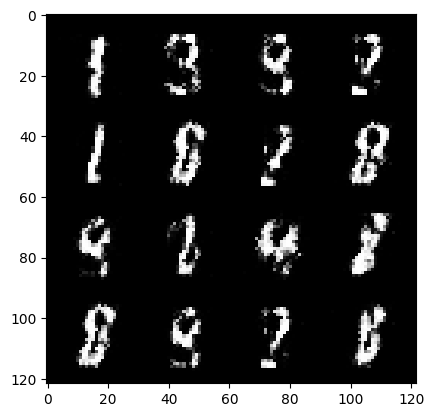

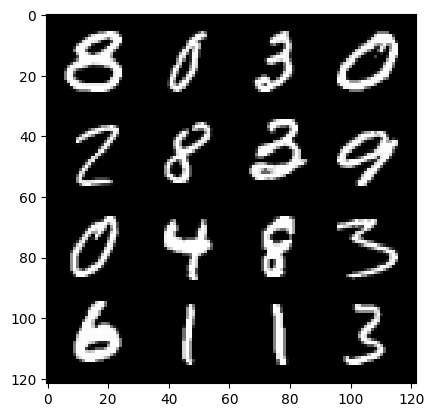

68: step 39000 / Gen loss: 3.5472911612192792 / disc_loss: 0.11719439948598538


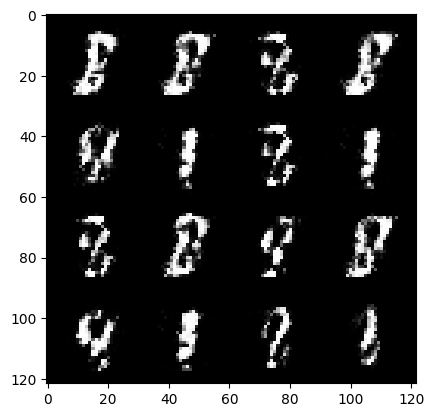

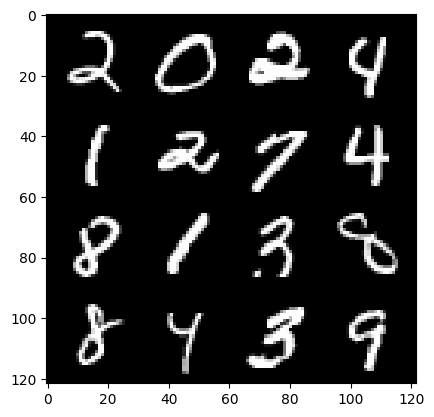

68: step 39300 / Gen loss: 3.683158092498778 / disc_loss: 0.10891466293483969


  0%|          | 0/469 [00:00<?, ?it/s]

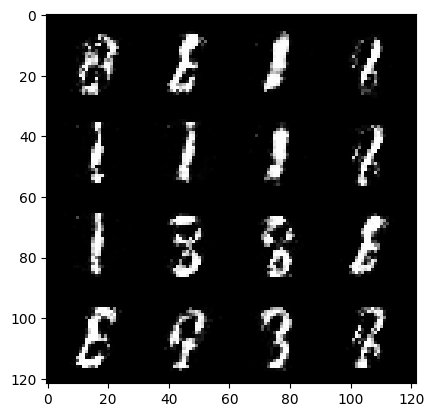

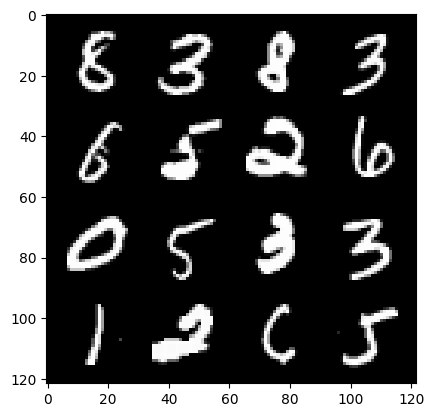

69: step 39600 / Gen loss: 3.739050599733988 / disc_loss: 0.10706263807912669


  0%|          | 0/469 [00:00<?, ?it/s]

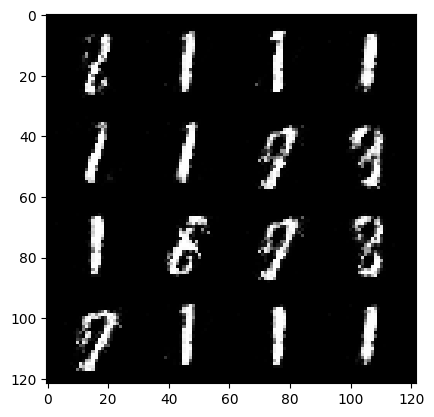

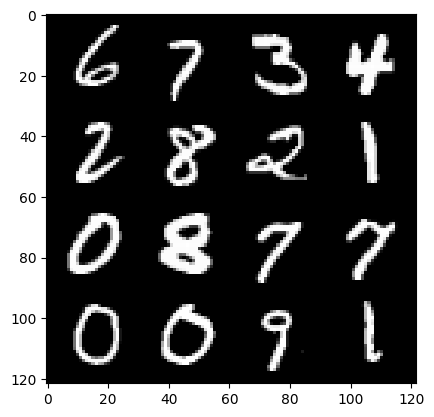

70: step 39900 / Gen loss: 3.690484732786813 / disc_loss: 0.10791750511775418


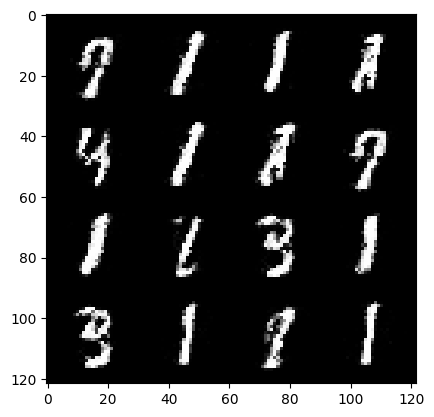

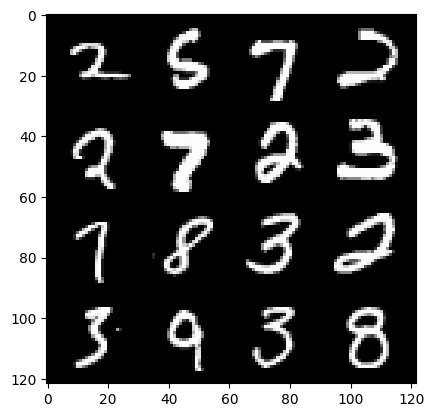

70: step 40200 / Gen loss: 3.715787502129872 / disc_loss: 0.1150620830307403


  0%|          | 0/469 [00:00<?, ?it/s]

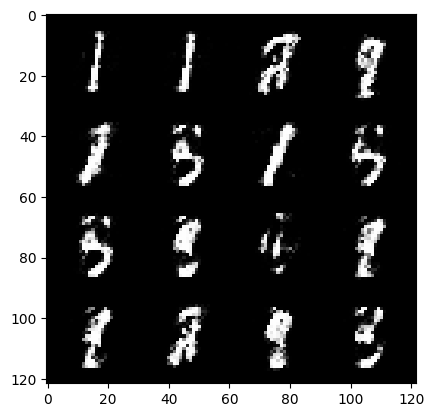

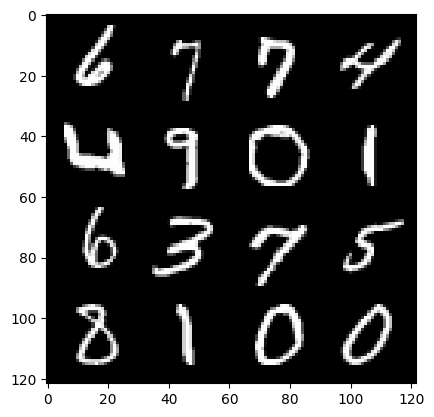

71: step 40500 / Gen loss: 3.382815849781034 / disc_loss: 0.14064238411684837


  0%|          | 0/469 [00:00<?, ?it/s]

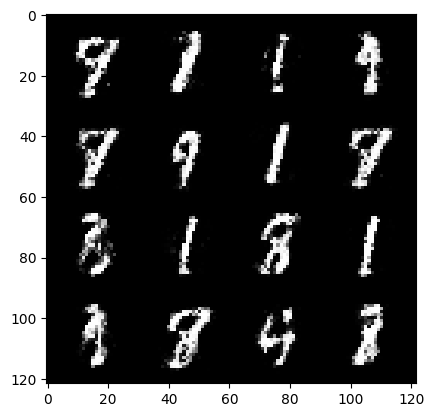

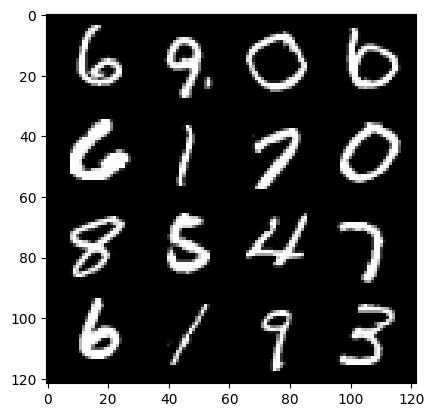

72: step 40800 / Gen loss: 3.4404061237970986 / disc_loss: 0.1401183822502693


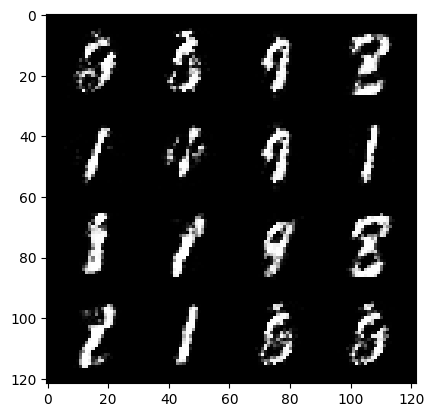

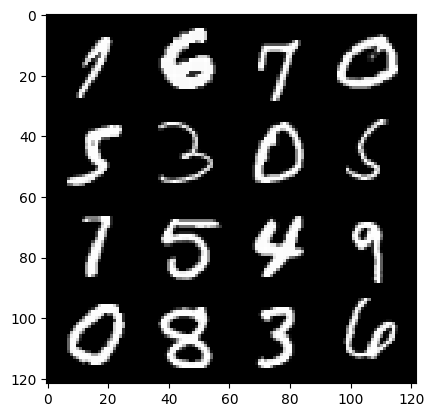

72: step 41100 / Gen loss: 3.3247555009524055 / disc_loss: 0.15039684350291893


  0%|          | 0/469 [00:00<?, ?it/s]

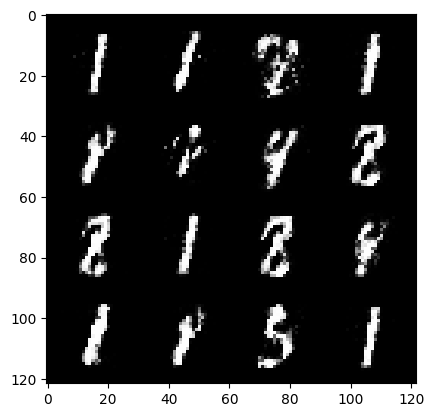

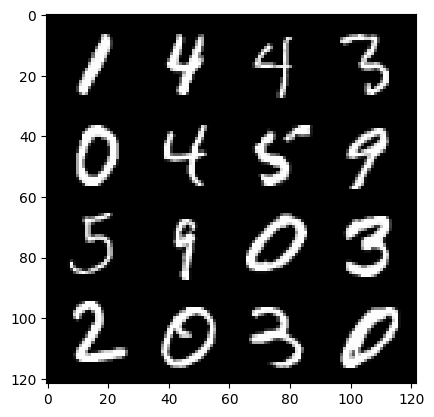

73: step 41400 / Gen loss: 3.0849417622884108 / disc_loss: 0.16234634616722668


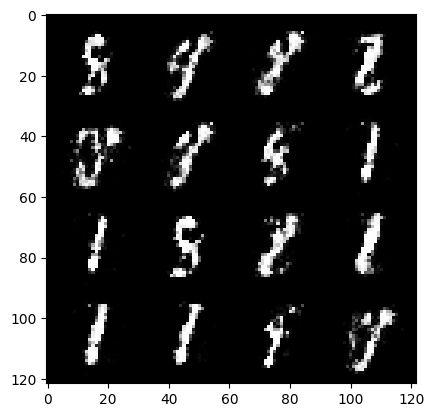

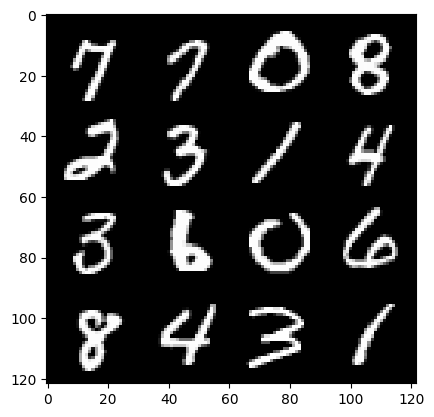

73: step 41700 / Gen loss: 3.385362702210743 / disc_loss: 0.14043822225183247


  0%|          | 0/469 [00:00<?, ?it/s]

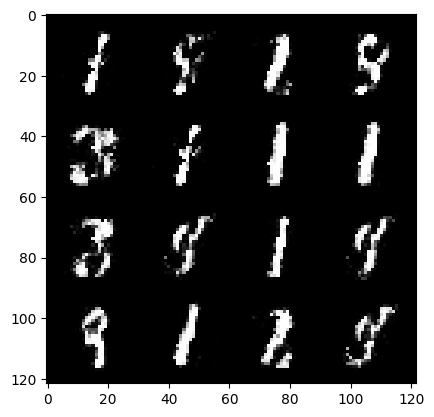

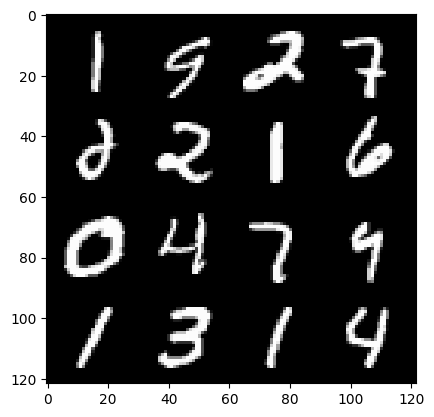

74: step 42000 / Gen loss: 3.504265116850534 / disc_loss: 0.12579848227401577


  0%|          | 0/469 [00:00<?, ?it/s]

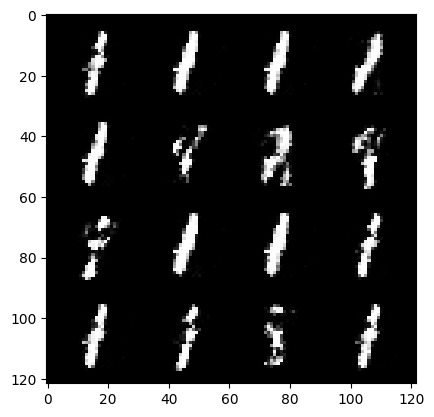

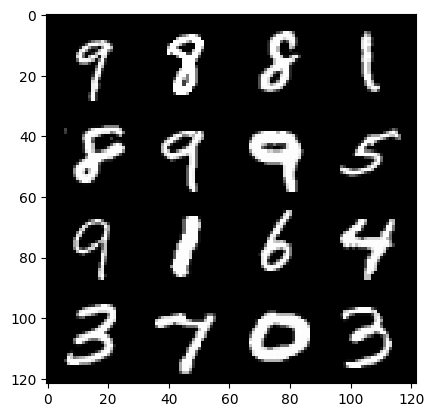

75: step 42300 / Gen loss: 3.517104172706605 / disc_loss: 0.13953461167713002


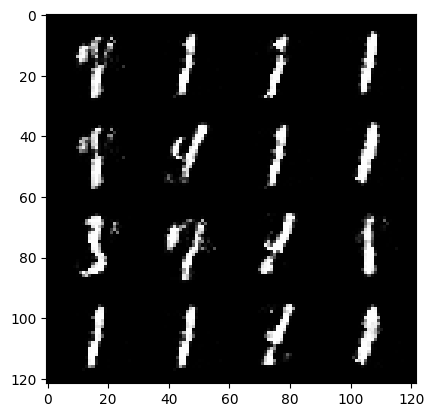

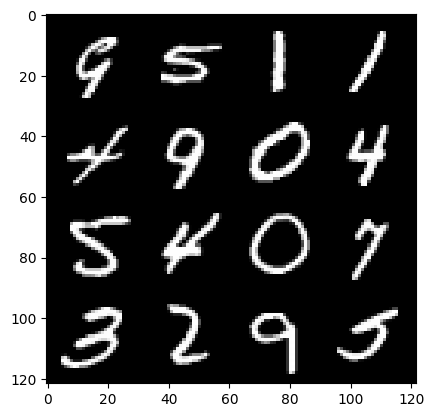

75: step 42600 / Gen loss: 3.2349646139144914 / disc_loss: 0.1548428364594778


  0%|          | 0/469 [00:00<?, ?it/s]

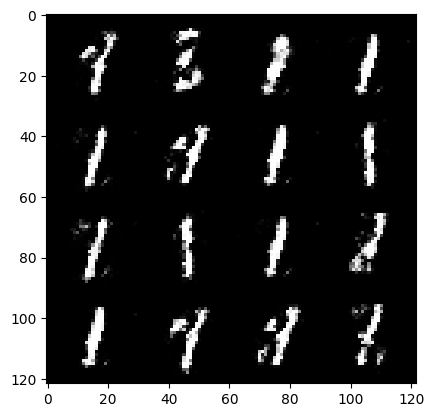

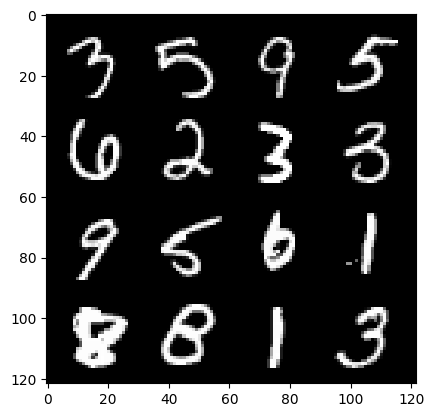

76: step 42900 / Gen loss: 3.491213853359221 / disc_loss: 0.11571717376510306


  0%|          | 0/469 [00:00<?, ?it/s]

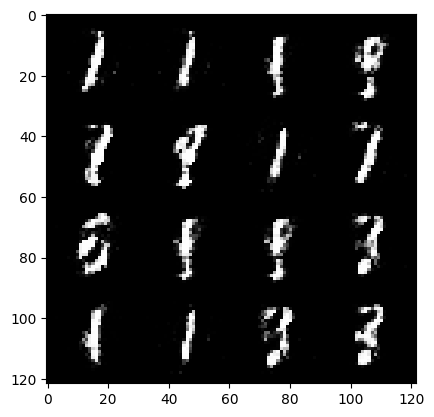

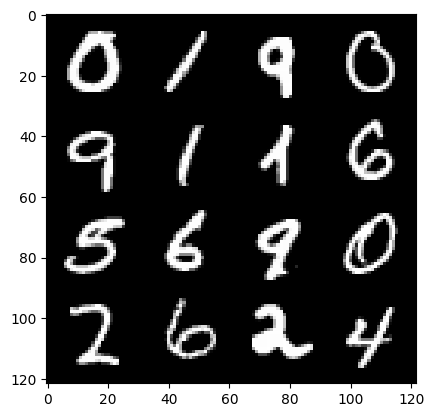

77: step 43200 / Gen loss: 3.7588519469896977 / disc_loss: 0.11967630345374342


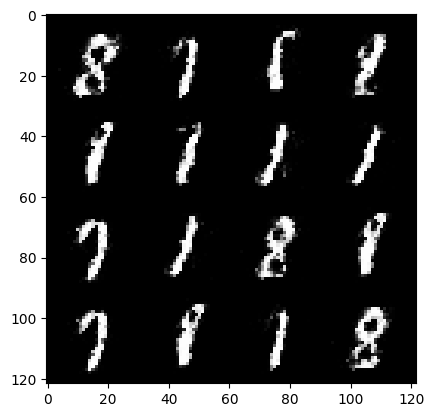

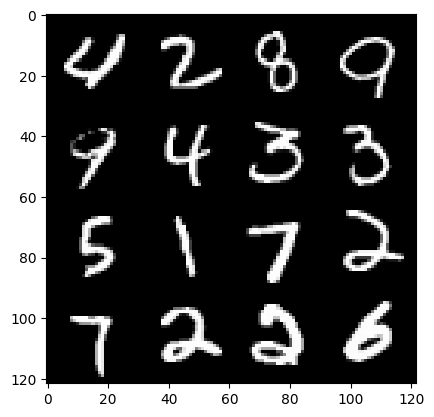

77: step 43500 / Gen loss: 3.28187275568644 / disc_loss: 0.15211019522200028


  0%|          | 0/469 [00:00<?, ?it/s]

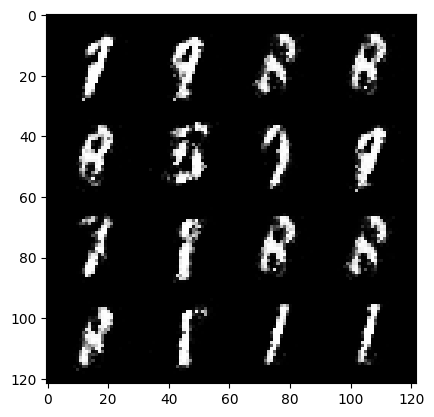

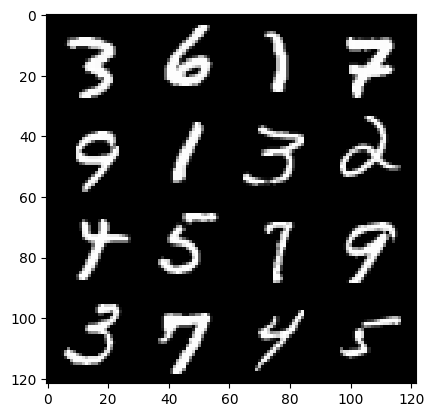

78: step 43800 / Gen loss: 3.15158635934194 / disc_loss: 0.16333239627381171


  0%|          | 0/469 [00:00<?, ?it/s]

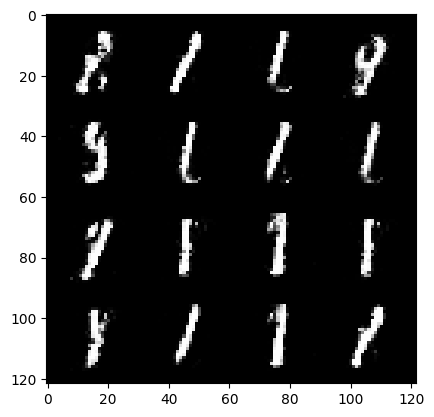

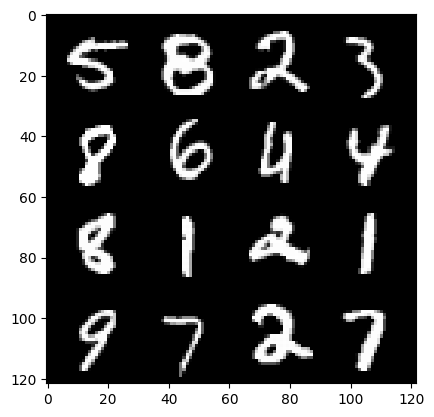

79: step 44100 / Gen loss: 3.1351691102981585 / disc_loss: 0.15452253061036264


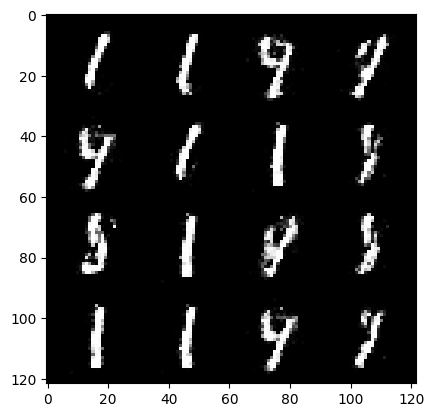

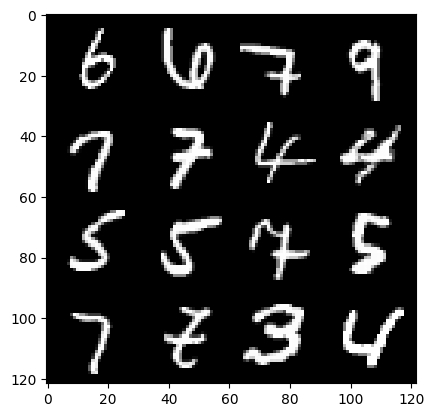

79: step 44400 / Gen loss: 3.1298438000679005 / disc_loss: 0.15998637321094672


  0%|          | 0/469 [00:00<?, ?it/s]

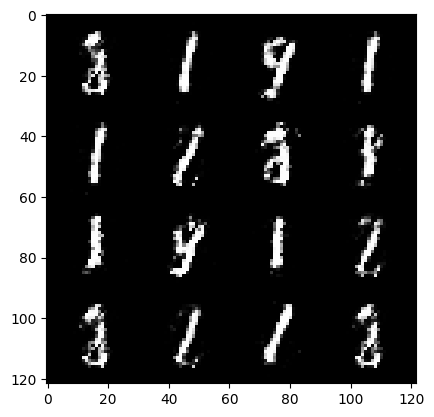

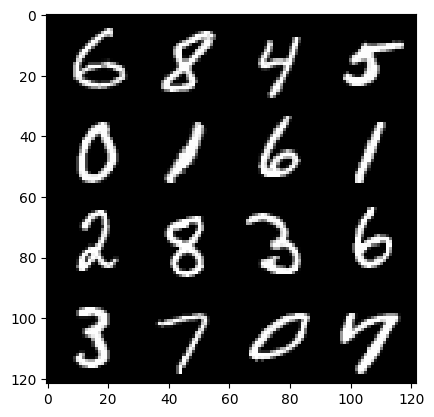

80: step 44700 / Gen loss: 3.181660256385803 / disc_loss: 0.15679615678886571


  0%|          | 0/469 [00:00<?, ?it/s]

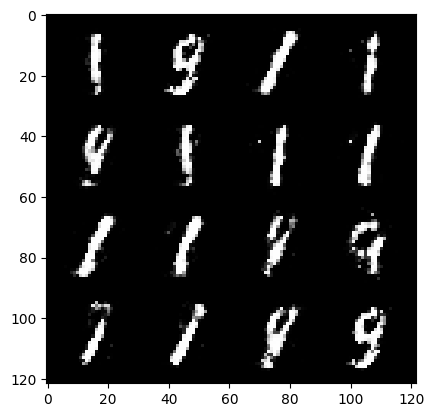

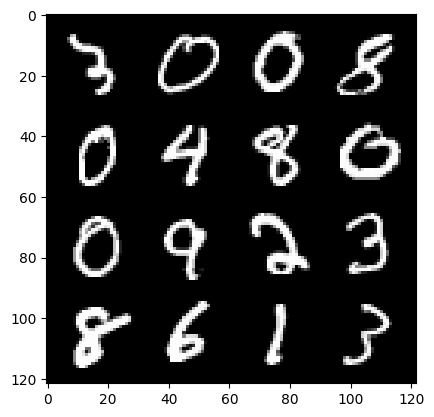

81: step 45000 / Gen loss: 3.1666753164927184 / disc_loss: 0.14663711654643216


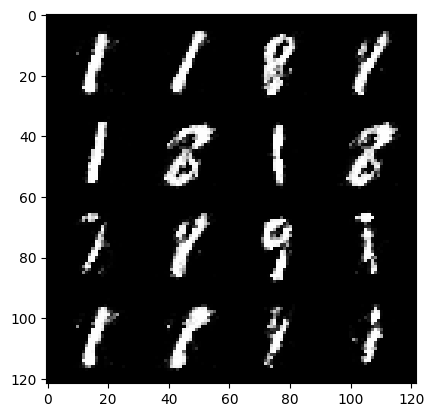

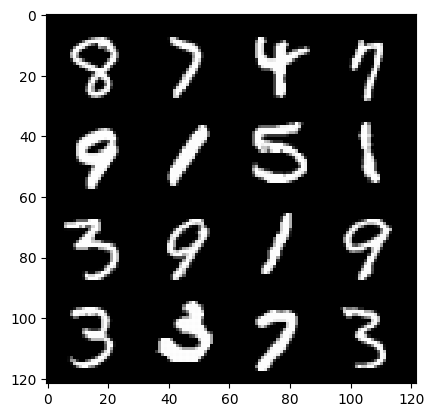

81: step 45300 / Gen loss: 3.0171430969238275 / disc_loss: 0.1608482516308625


  0%|          | 0/469 [00:00<?, ?it/s]

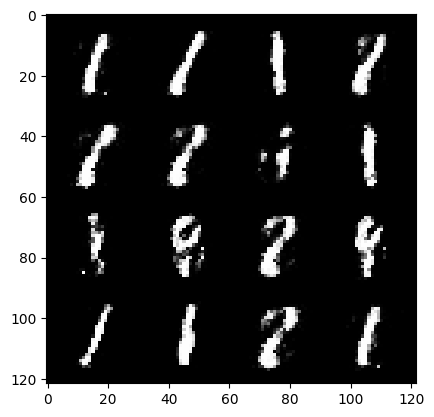

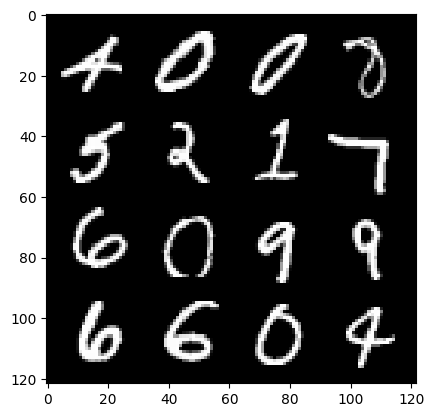

82: step 45600 / Gen loss: 2.9846897212664283 / disc_loss: 0.1602460217227538


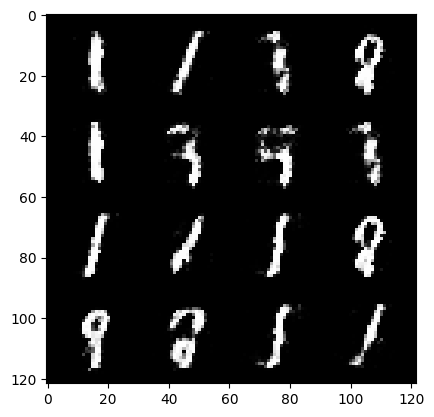

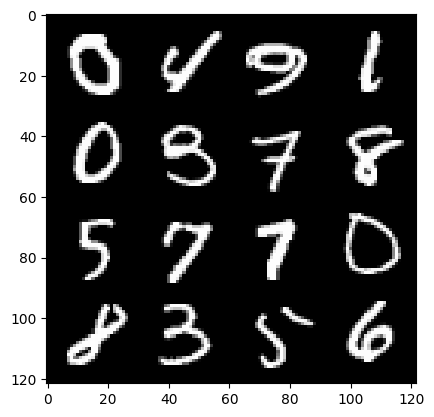

82: step 45900 / Gen loss: 3.0153283802668263 / disc_loss: 0.1525905742496254


  0%|          | 0/469 [00:00<?, ?it/s]

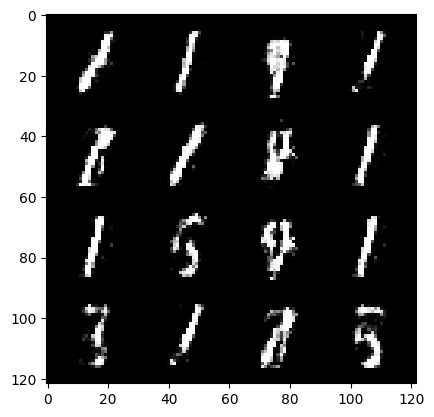

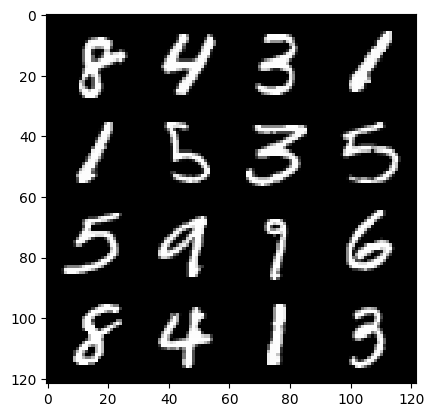

83: step 46200 / Gen loss: 2.919384875297546 / disc_loss: 0.15971599909166503


  0%|          | 0/469 [00:00<?, ?it/s]

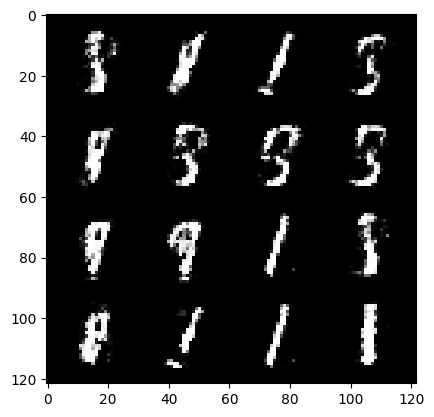

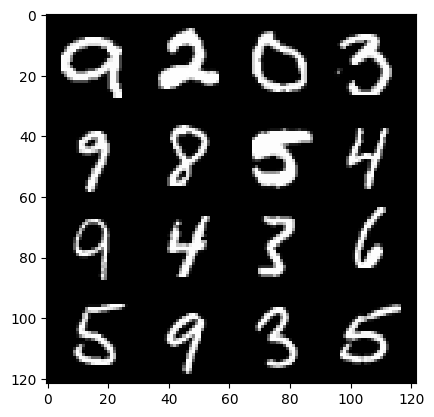

84: step 46500 / Gen loss: 2.956090888182323 / disc_loss: 0.1581705292810995


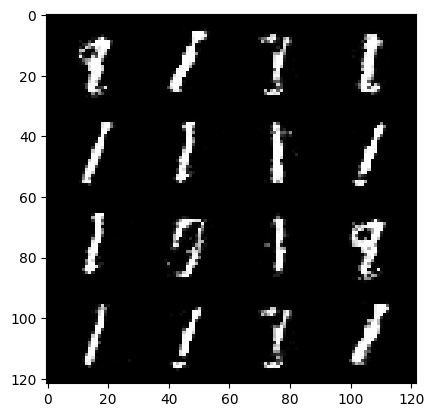

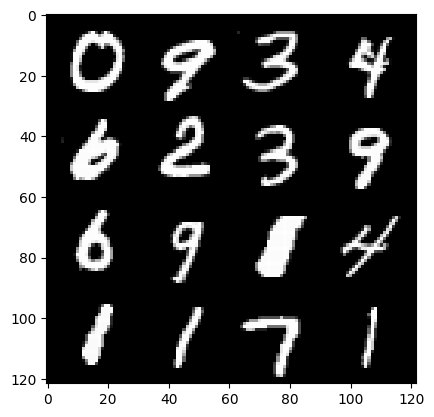

84: step 46800 / Gen loss: 3.0235605645179757 / disc_loss: 0.15695871911942963


  0%|          | 0/469 [00:00<?, ?it/s]

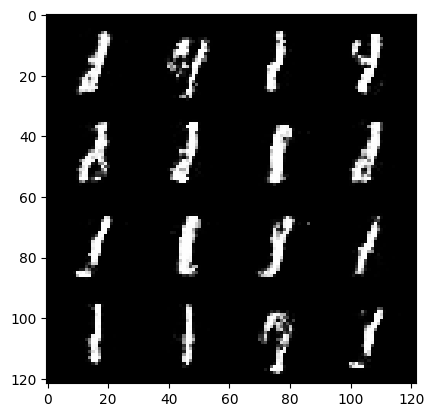

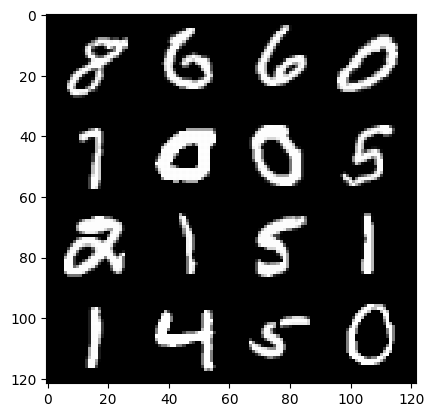

85: step 47100 / Gen loss: 2.853258565266927 / disc_loss: 0.17250033197303608


  0%|          | 0/469 [00:00<?, ?it/s]

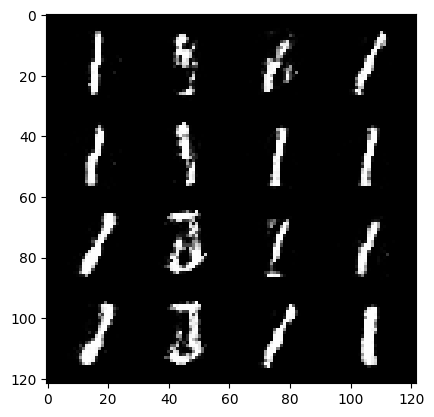

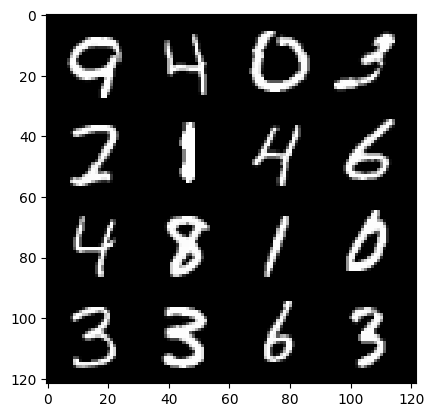

86: step 47400 / Gen loss: 2.917250499725341 / disc_loss: 0.16475520332654306


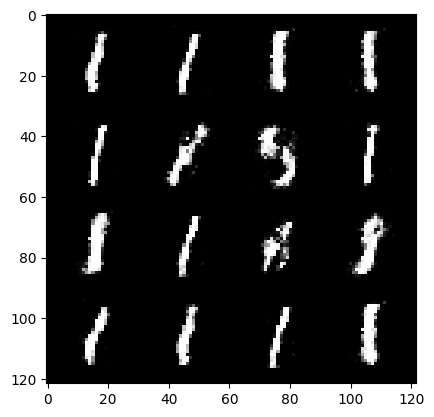

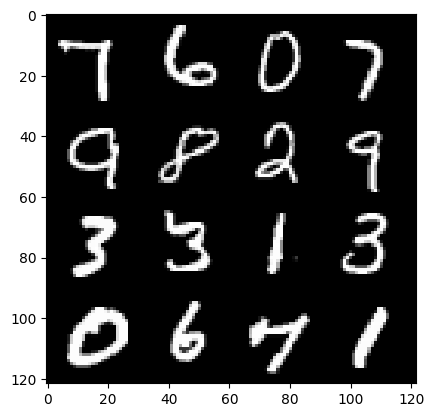

86: step 47700 / Gen loss: 2.771847587426502 / disc_loss: 0.1904541036238275


  0%|          | 0/469 [00:00<?, ?it/s]

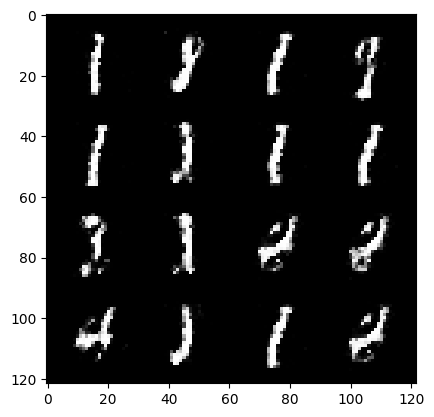

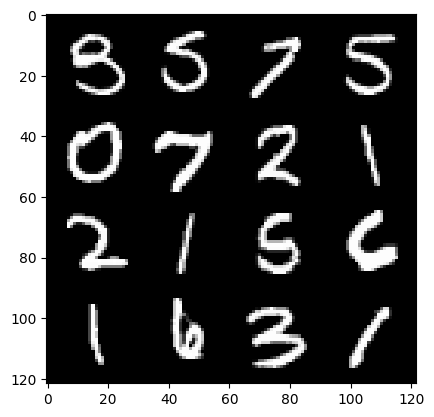

87: step 48000 / Gen loss: 2.8575433762868228 / disc_loss: 0.16863623517254986


  0%|          | 0/469 [00:00<?, ?it/s]

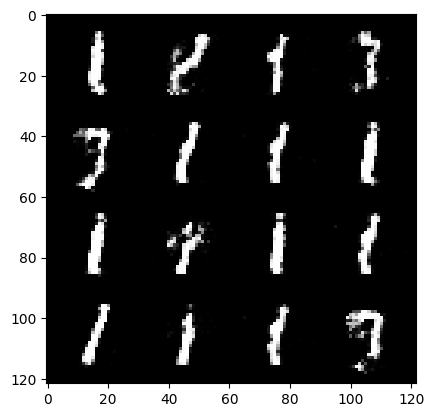

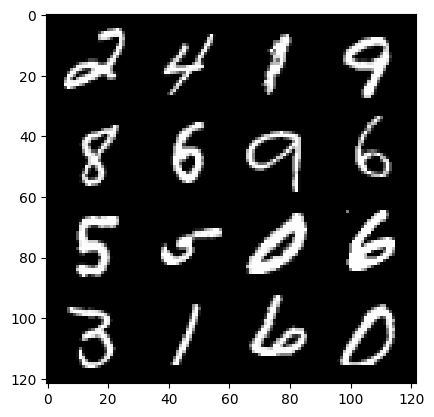

88: step 48300 / Gen loss: 2.751436776320138 / disc_loss: 0.18097196271022148


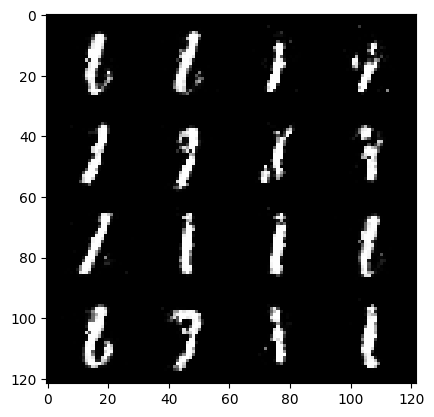

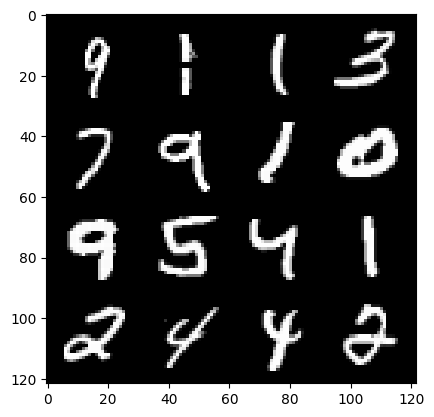

88: step 48600 / Gen loss: 2.8273353513081845 / disc_loss: 0.17622101051112016


  0%|          | 0/469 [00:00<?, ?it/s]

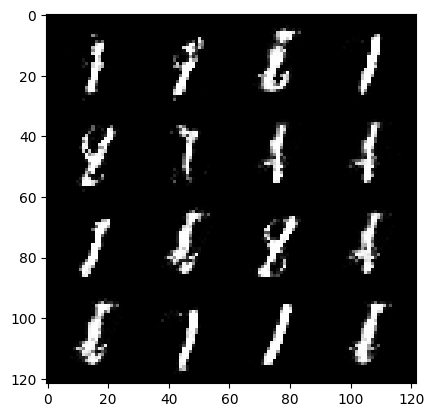

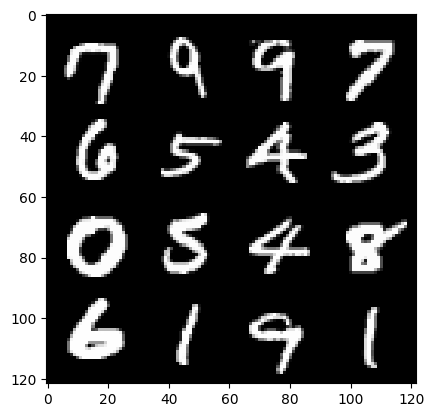

89: step 48900 / Gen loss: 2.8220205998420735 / disc_loss: 0.16506640990575164


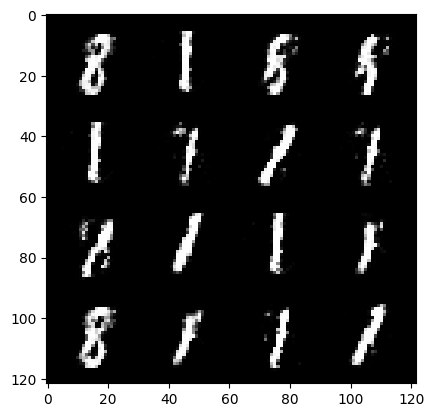

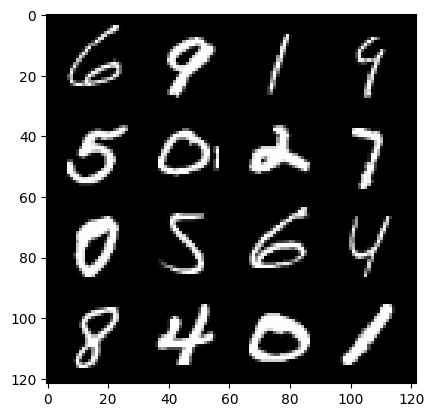

89: step 49200 / Gen loss: 2.7477115845680253 / disc_loss: 0.18519905731081965


  0%|          | 0/469 [00:00<?, ?it/s]

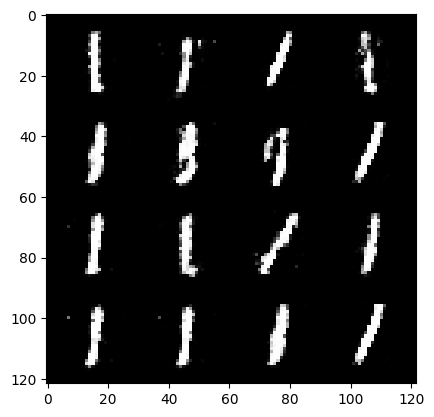

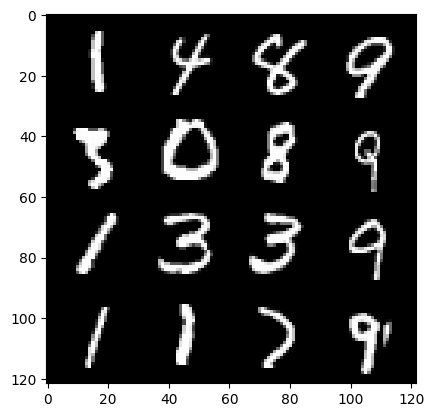

90: step 49500 / Gen loss: 2.7629365897178637 / disc_loss: 0.18234604328870777


  0%|          | 0/469 [00:00<?, ?it/s]

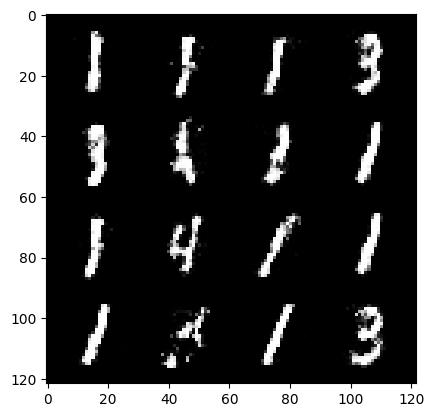

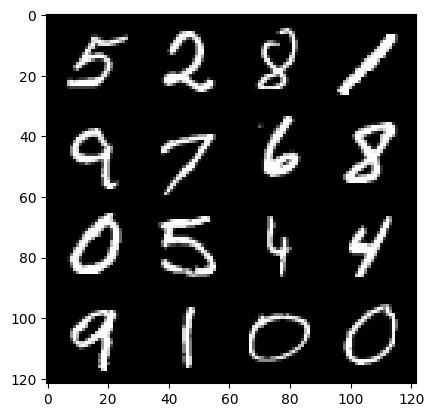

91: step 49800 / Gen loss: 2.859561323324841 / disc_loss: 0.1520929809411367


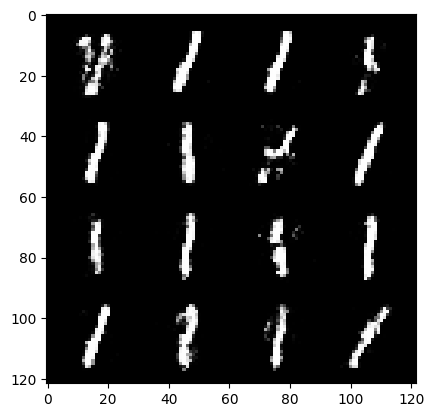

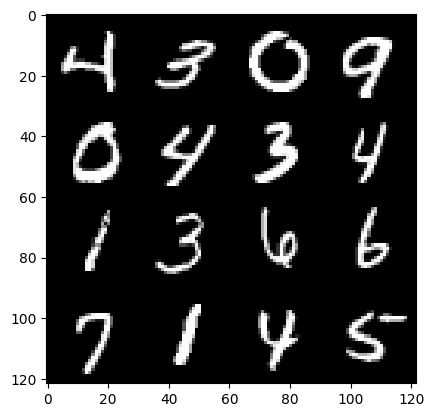

91: step 50100 / Gen loss: 2.8575945965449017 / disc_loss: 0.16901319339871407


  0%|          | 0/469 [00:00<?, ?it/s]

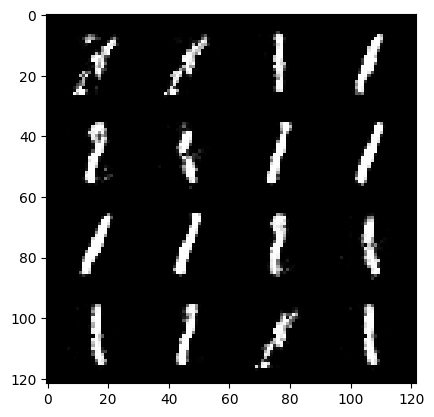

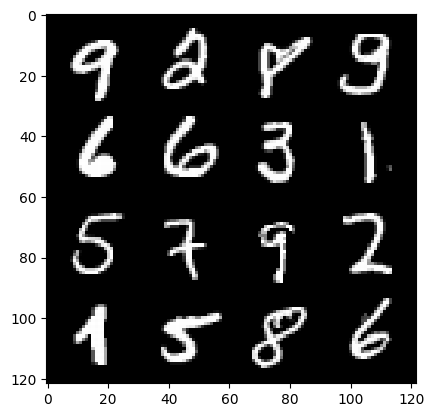

92: step 50400 / Gen loss: 2.6439138754208886 / disc_loss: 0.1827231870343287


  0%|          | 0/469 [00:00<?, ?it/s]

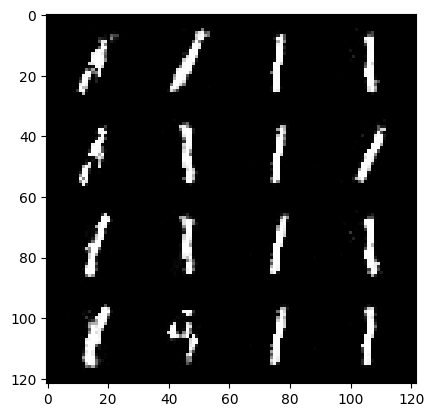

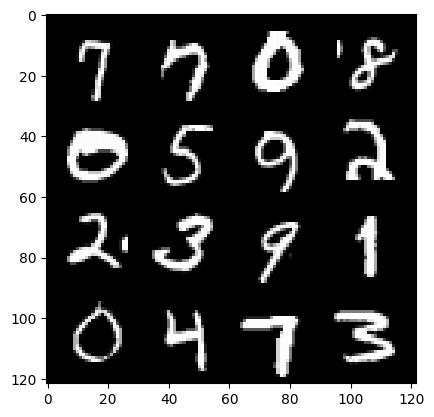

93: step 50700 / Gen loss: 2.5848672413825997 / disc_loss: 0.20208712473511695


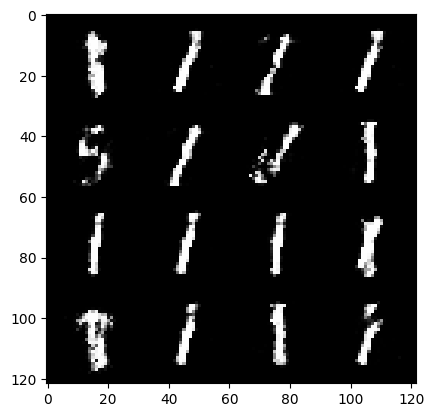

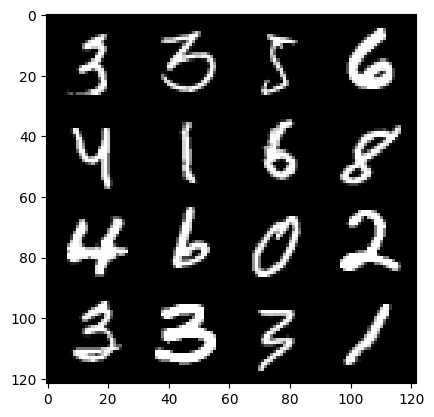

93: step 51000 / Gen loss: 2.7492697111765523 / disc_loss: 0.17721812022229042


  0%|          | 0/469 [00:00<?, ?it/s]

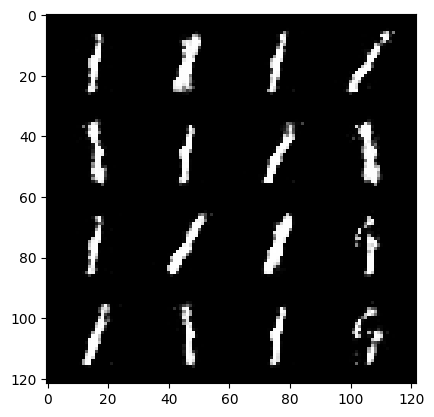

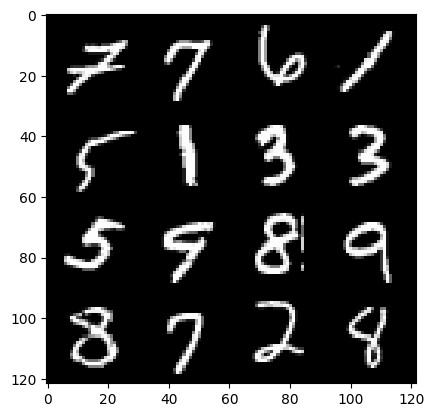

94: step 51300 / Gen loss: 2.6939096077283224 / disc_loss: 0.18044393882155413


  0%|          | 0/469 [00:00<?, ?it/s]

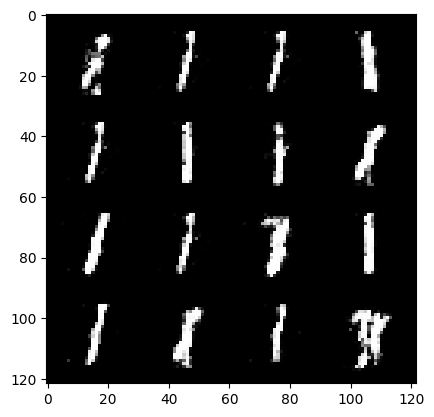

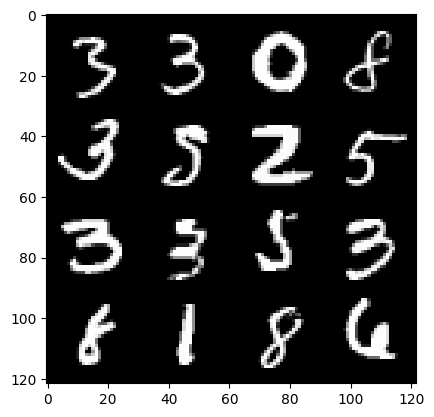

95: step 51600 / Gen loss: 2.6862423904736845 / disc_loss: 0.17248012299338972


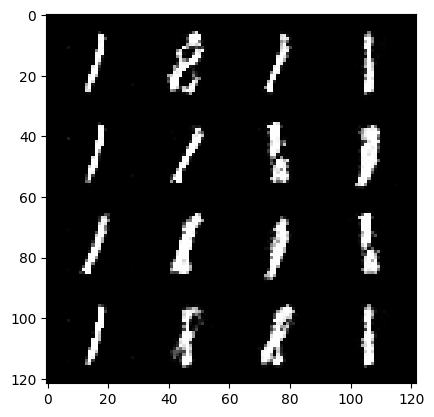

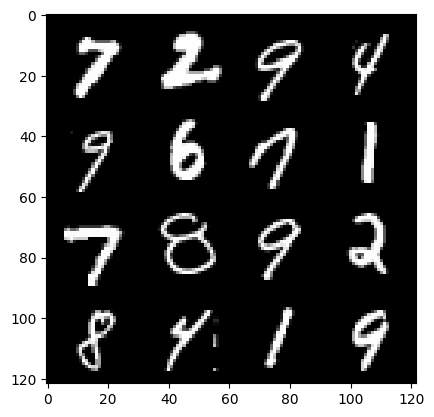

95: step 51900 / Gen loss: 2.6161068360010784 / disc_loss: 0.1866445914655923


  0%|          | 0/469 [00:00<?, ?it/s]

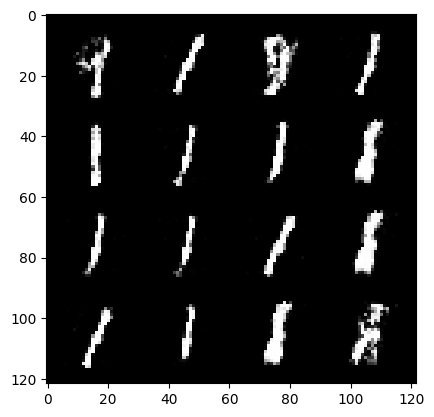

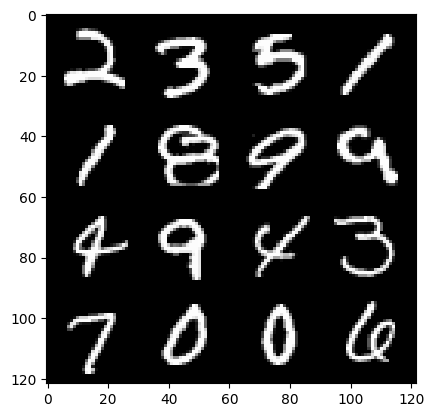

96: step 52200 / Gen loss: 2.644501987298328 / disc_loss: 0.17628097983698032


  0%|          | 0/469 [00:00<?, ?it/s]

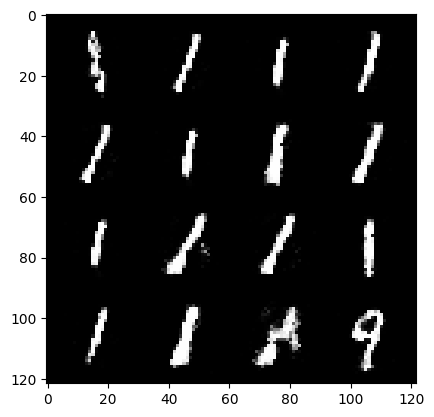

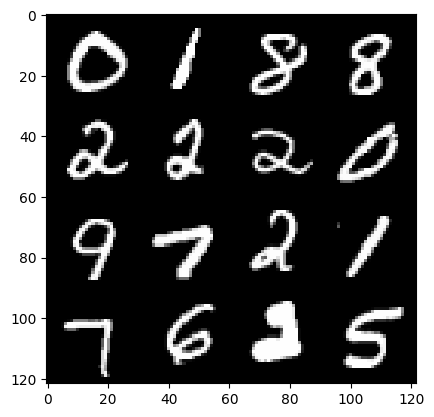

97: step 52500 / Gen loss: 2.745410980383553 / disc_loss: 0.17790668807923787


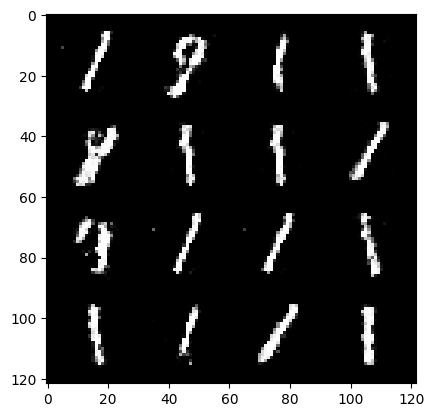

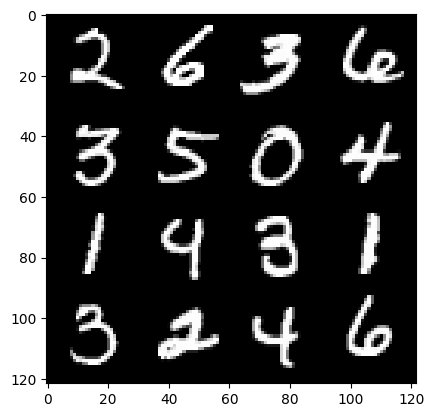

97: step 52800 / Gen loss: 2.608420962095262 / disc_loss: 0.18685029126703737


  0%|          | 0/469 [00:00<?, ?it/s]

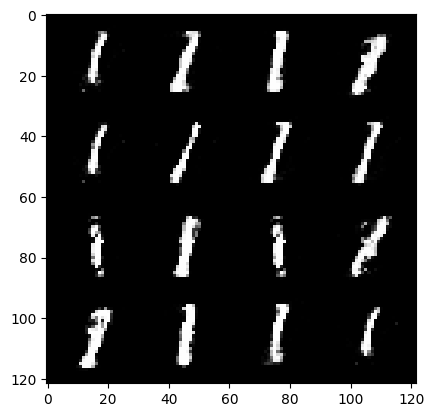

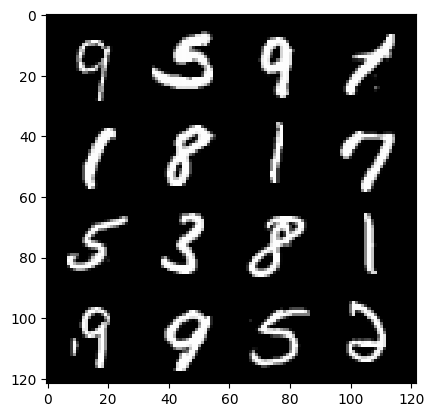

98: step 53100 / Gen loss: 2.5412577533721934 / disc_loss: 0.19464544100066034


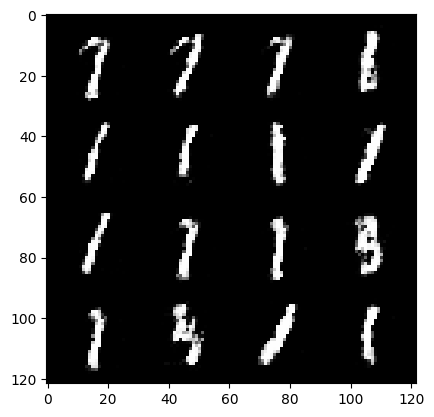

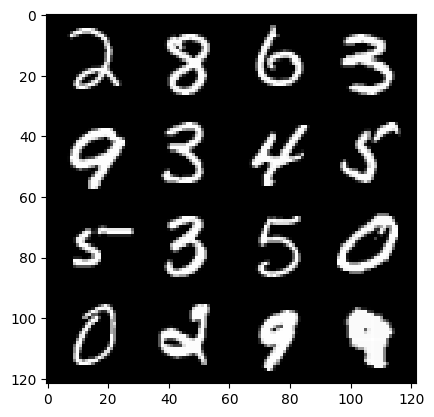

98: step 53400 / Gen loss: 2.5757237903277073 / disc_loss: 0.1810161134600638


  0%|          | 0/469 [00:00<?, ?it/s]

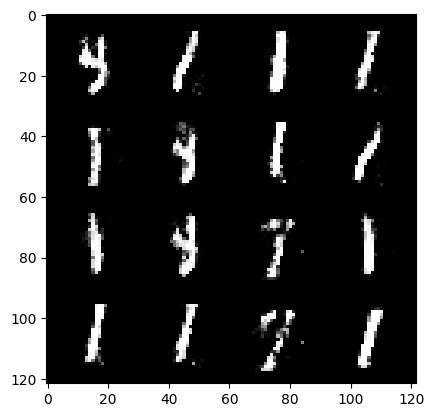

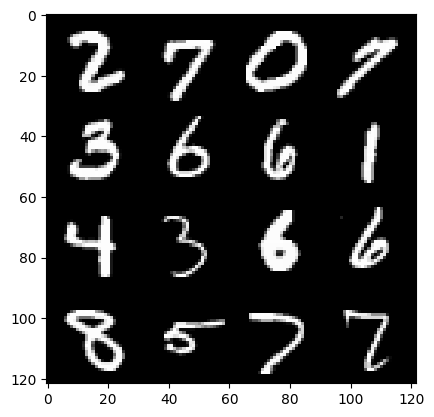

99: step 53700 / Gen loss: 2.52528849919637 / disc_loss: 0.18383474898835023


  0%|          | 0/469 [00:00<?, ?it/s]

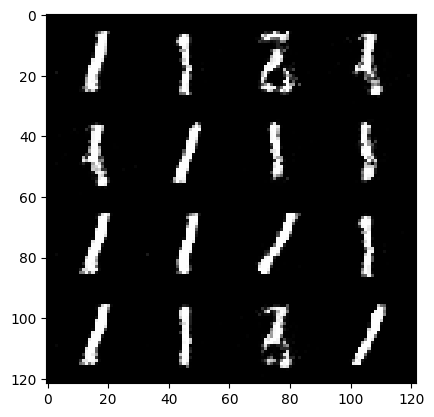

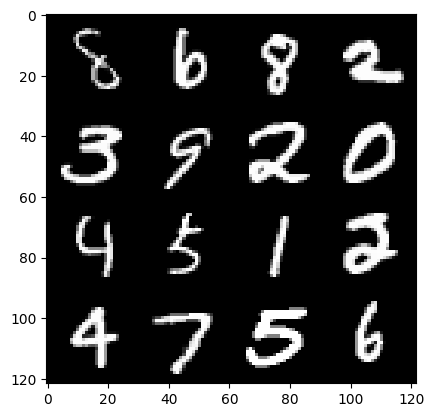

100: step 54000 / Gen loss: 2.609240777492522 / disc_loss: 0.19199885899821892


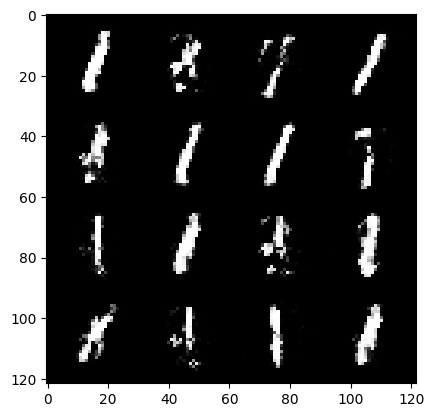

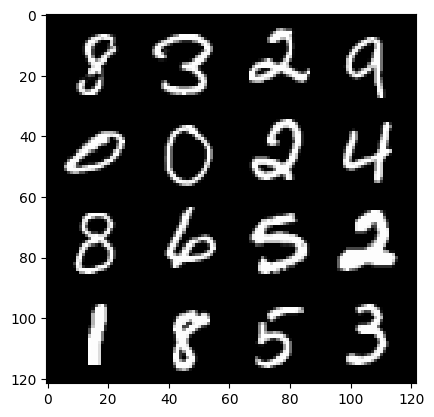

100: step 54300 / Gen loss: 2.6421117989222216 / disc_loss: 0.18373375803232184


  0%|          | 0/469 [00:00<?, ?it/s]

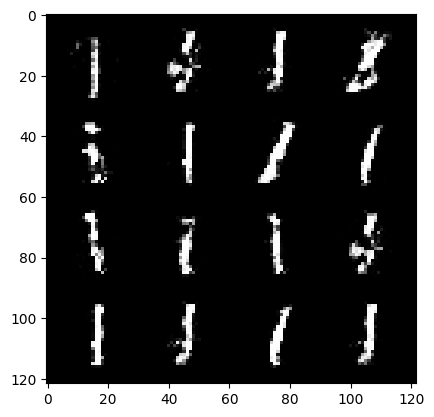

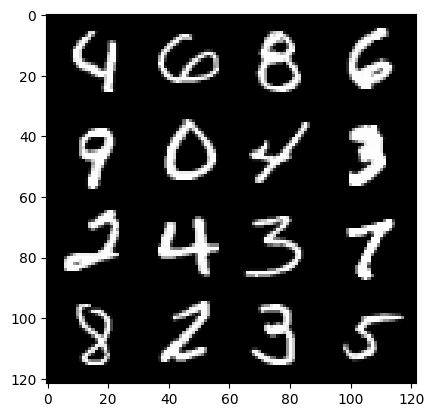

101: step 54600 / Gen loss: 2.546587560971578 / disc_loss: 0.18597420021891606


  0%|          | 0/469 [00:00<?, ?it/s]

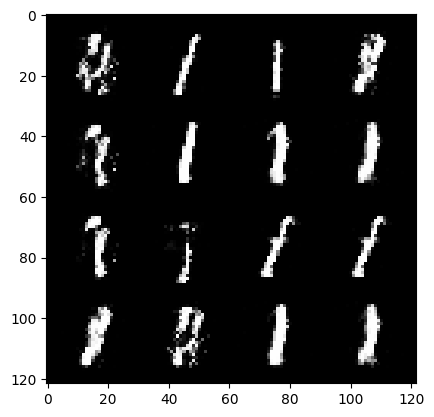

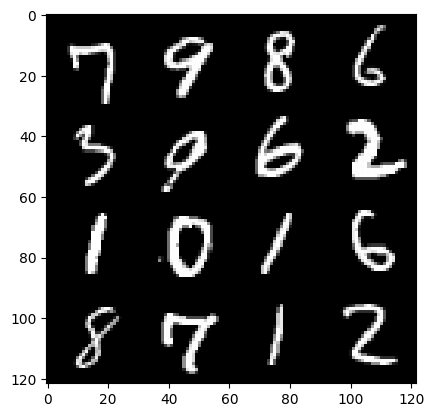

102: step 54900 / Gen loss: 2.615530968507131 / disc_loss: 0.17568298449118935


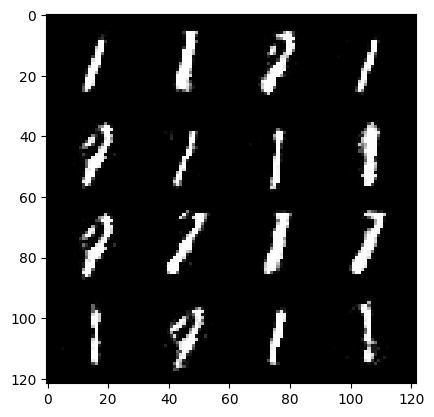

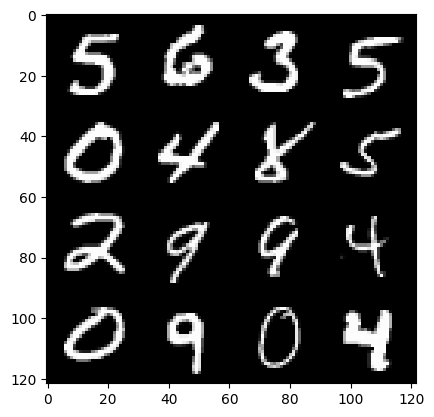

102: step 55200 / Gen loss: 2.831722687880198 / disc_loss: 0.16646627535422645


  0%|          | 0/469 [00:00<?, ?it/s]

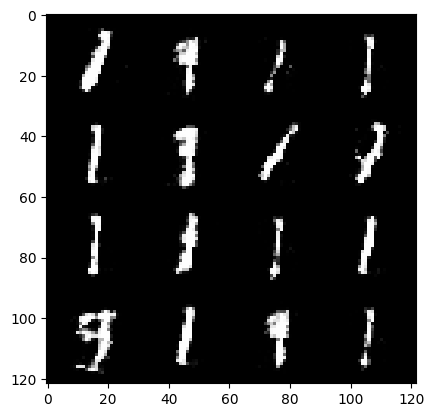

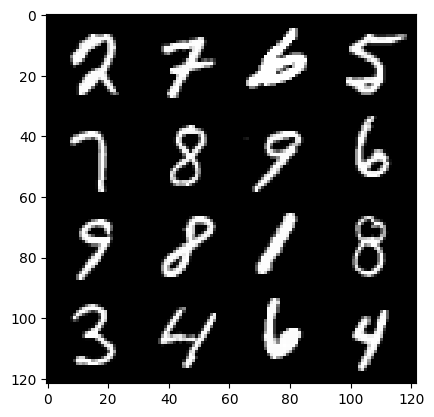

103: step 55500 / Gen loss: 2.518045719464621 / disc_loss: 0.19092720078925302


  0%|          | 0/469 [00:00<?, ?it/s]

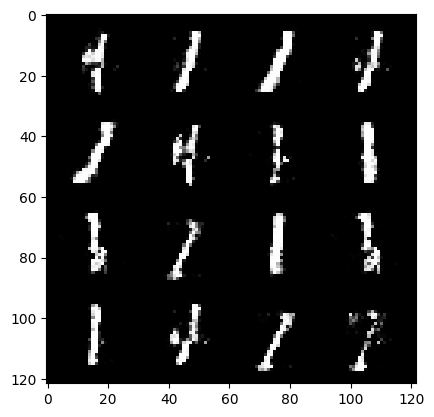

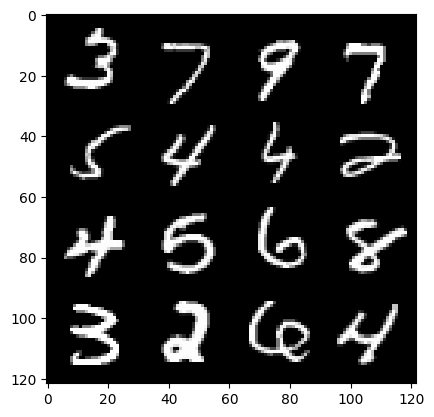

104: step 55800 / Gen loss: 2.6918426354726166 / disc_loss: 0.16343763552606103


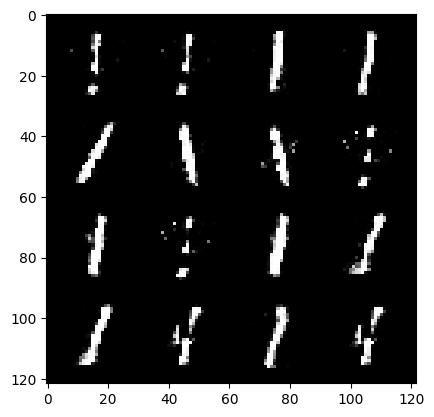

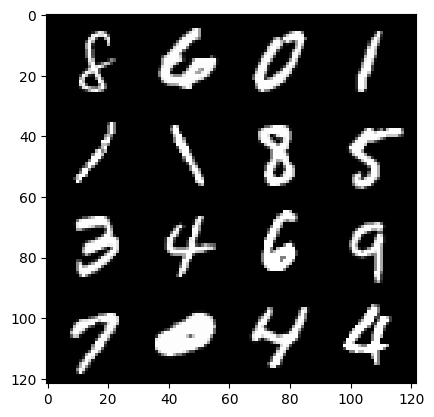

104: step 56100 / Gen loss: 2.713105754852293 / disc_loss: 0.15255352005362524


  0%|          | 0/469 [00:00<?, ?it/s]

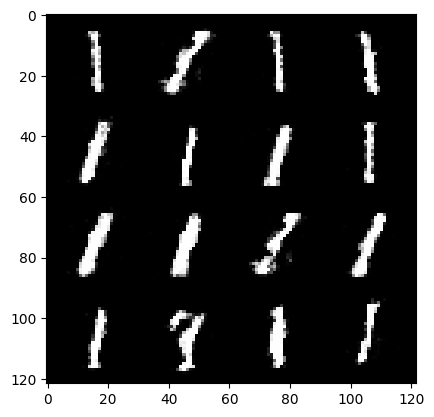

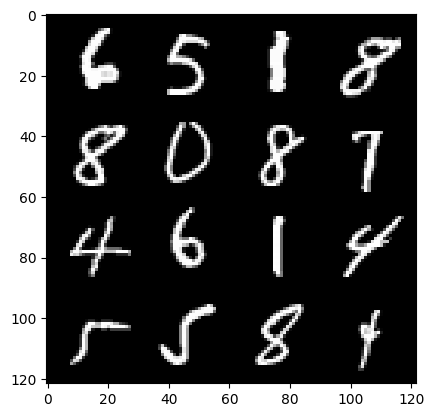

105: step 56400 / Gen loss: 2.6173522750536606 / disc_loss: 0.1810940069456896


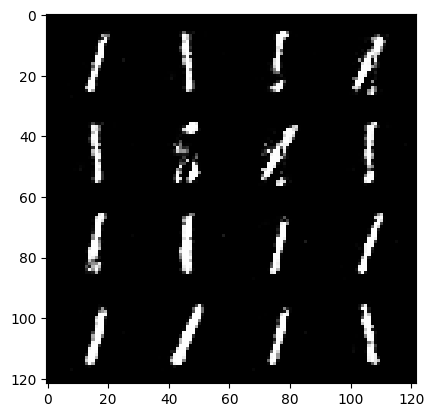

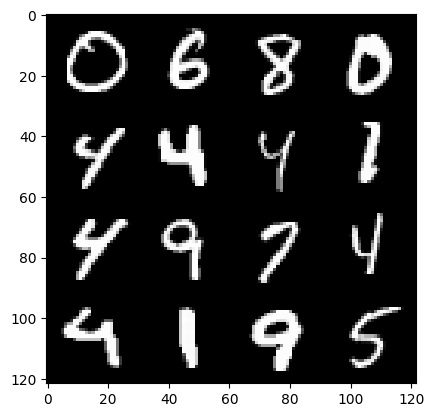

105: step 56700 / Gen loss: 2.5357060678799943 / disc_loss: 0.1726349147657554


  0%|          | 0/469 [00:00<?, ?it/s]

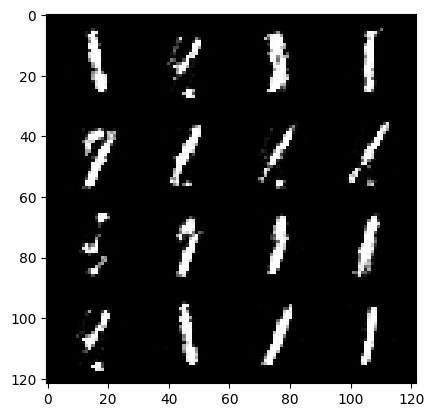

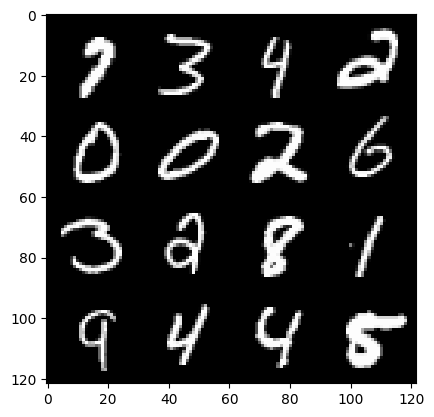

106: step 57000 / Gen loss: 2.5549271289507534 / disc_loss: 0.18403029749790825


  0%|          | 0/469 [00:00<?, ?it/s]

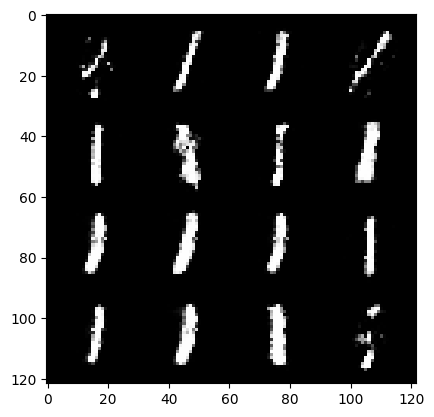

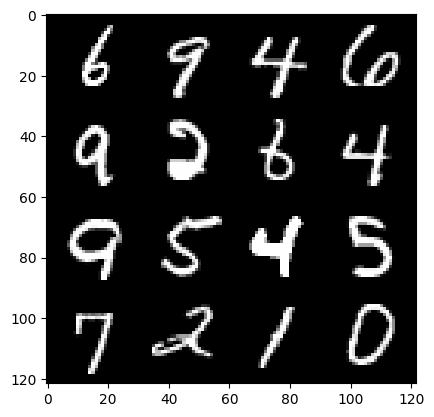

107: step 57300 / Gen loss: 2.5935362990697213 / disc_loss: 0.17153163631757096


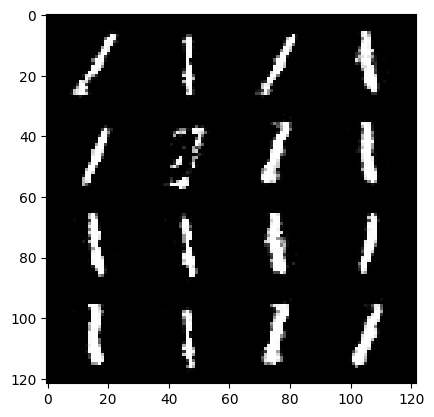

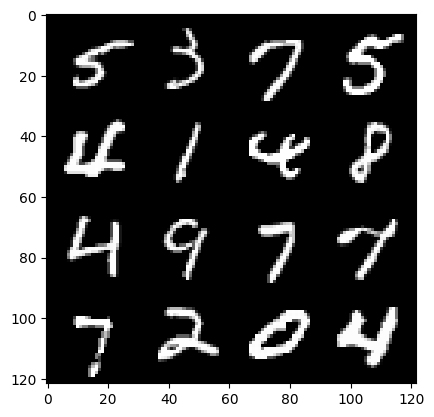

107: step 57600 / Gen loss: 2.514674328168235 / disc_loss: 0.18121921385327977


  0%|          | 0/469 [00:00<?, ?it/s]

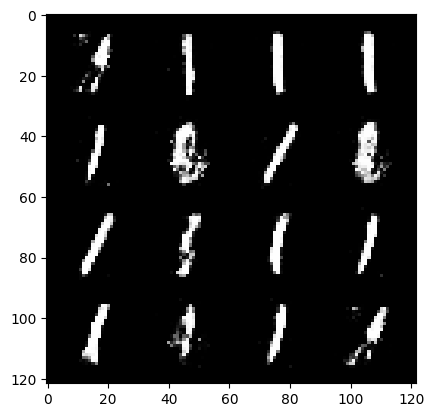

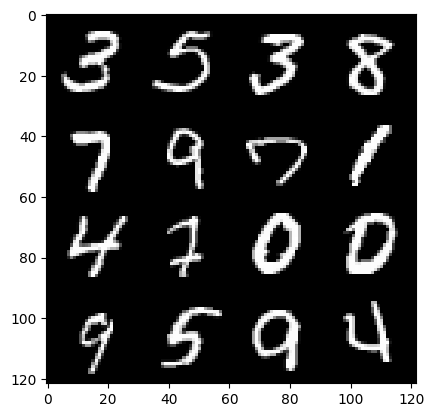

108: step 57900 / Gen loss: 2.514484886328381 / disc_loss: 0.1877304214984178


  0%|          | 0/469 [00:00<?, ?it/s]

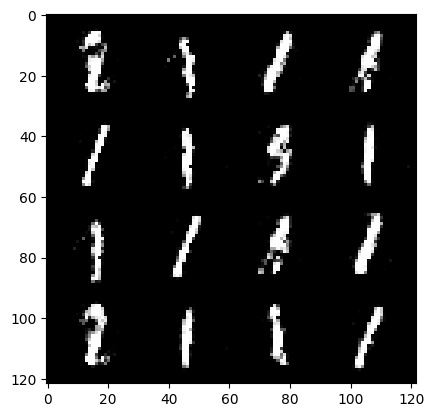

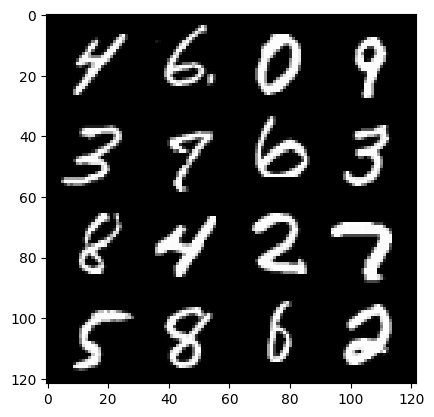

109: step 58200 / Gen loss: 2.540177536805471 / disc_loss: 0.1877333461493253


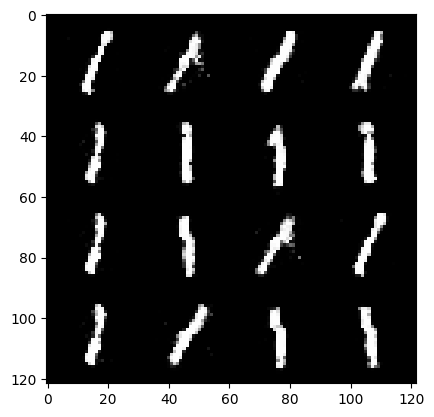

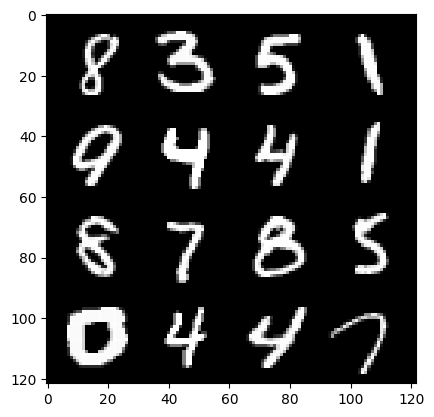

109: step 58500 / Gen loss: 2.552938006718954 / disc_loss: 0.18146488125125562


  0%|          | 0/469 [00:00<?, ?it/s]

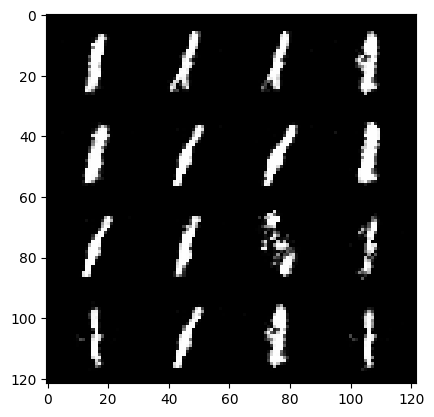

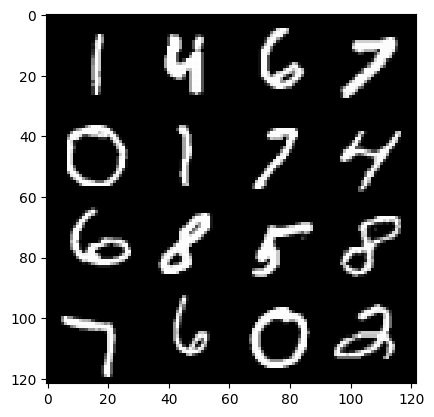

110: step 58800 / Gen loss: 2.5880067626635217 / disc_loss: 0.17589250137408566


  0%|          | 0/469 [00:00<?, ?it/s]

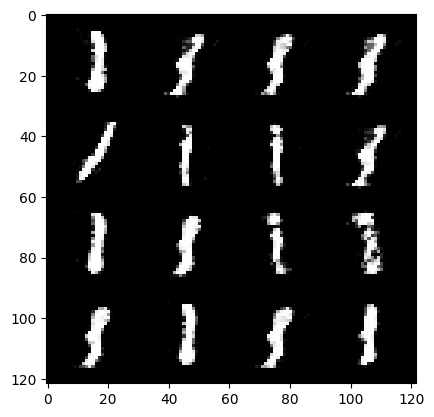

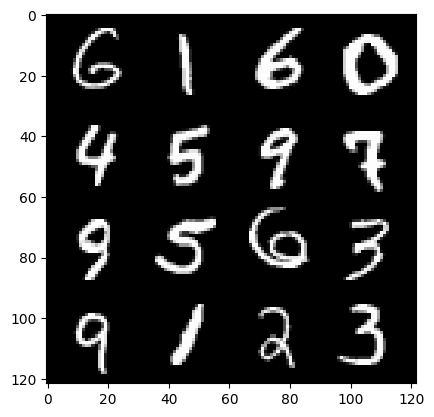

111: step 59100 / Gen loss: 2.5284292642275474 / disc_loss: 0.18183677372833082


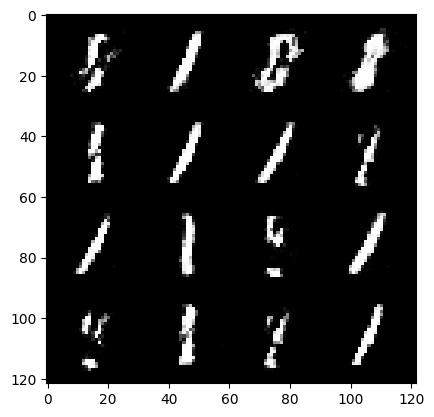

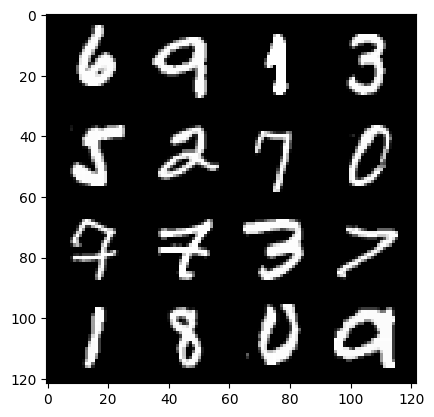

111: step 59400 / Gen loss: 2.5587062565485645 / disc_loss: 0.1832895910491546


  0%|          | 0/469 [00:00<?, ?it/s]

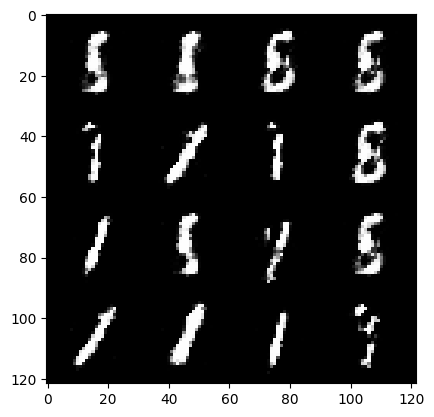

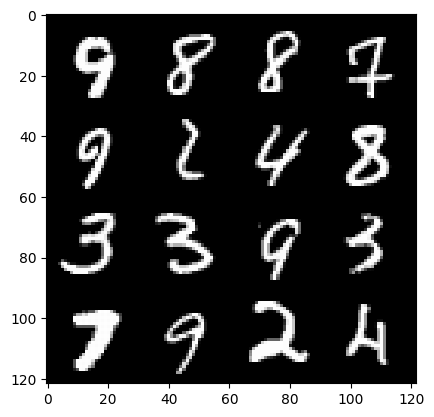

112: step 59700 / Gen loss: 2.6007359004020696 / disc_loss: 0.1878108510871728


  0%|          | 0/469 [00:00<?, ?it/s]

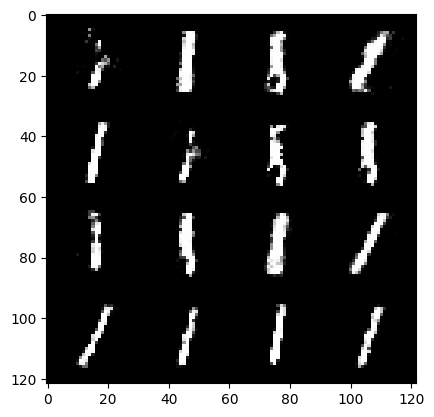

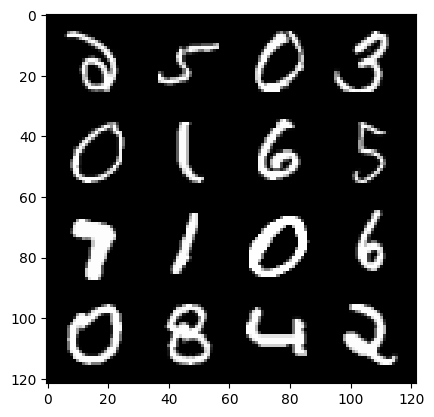

113: step 60000 / Gen loss: 2.527530852953592 / disc_loss: 0.1791125114262104


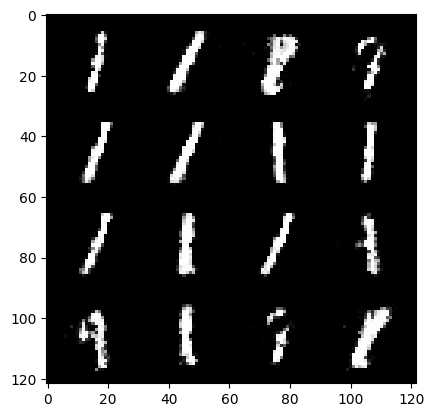

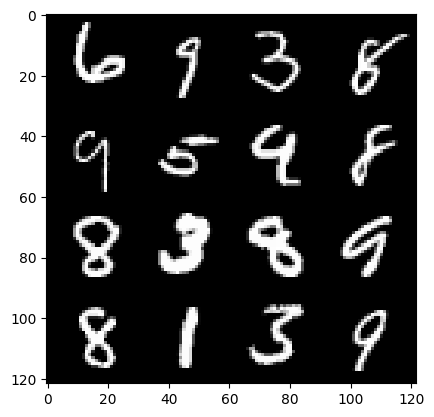

113: step 60300 / Gen loss: 2.469502151012419 / disc_loss: 0.1856659171481928


  0%|          | 0/469 [00:00<?, ?it/s]

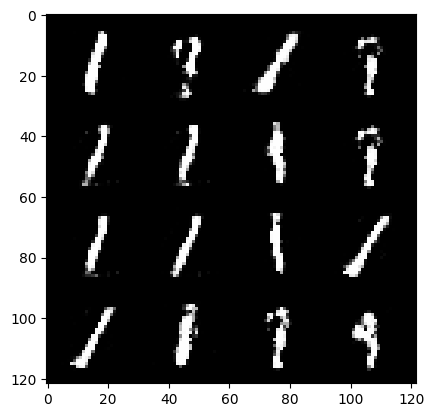

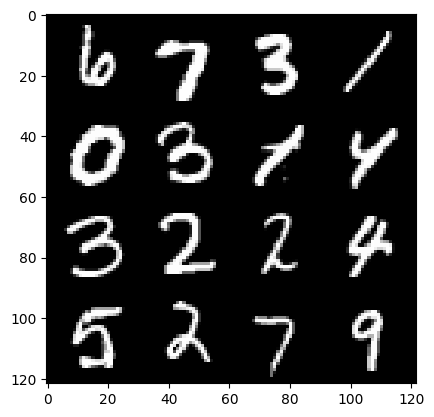

114: step 60600 / Gen loss: 2.5751224962870274 / disc_loss: 0.17266824459036206


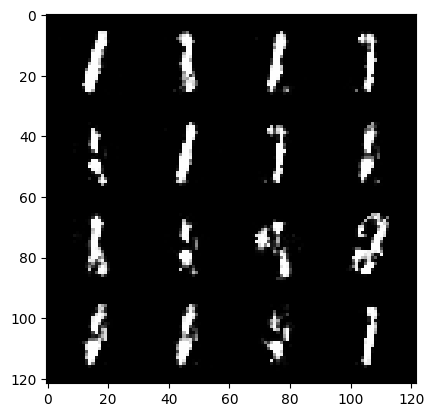

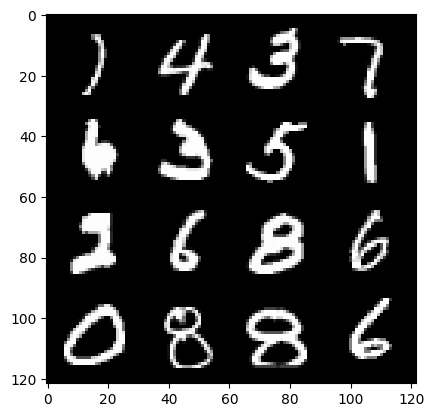

114: step 60900 / Gen loss: 2.520215171178184 / disc_loss: 0.18350006180504957


  0%|          | 0/469 [00:00<?, ?it/s]

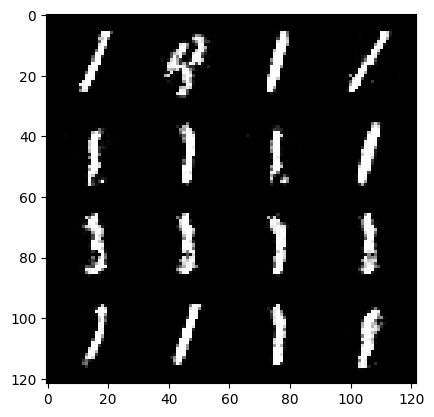

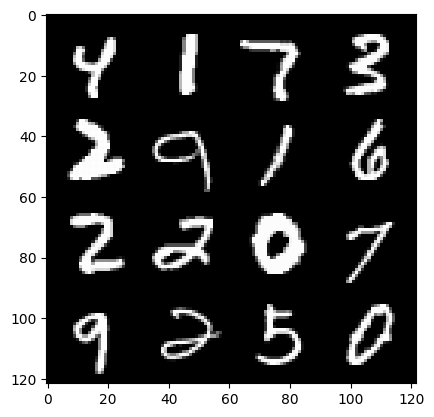

115: step 61200 / Gen loss: 2.523654755751292 / disc_loss: 0.18797647866110012


  0%|          | 0/469 [00:00<?, ?it/s]

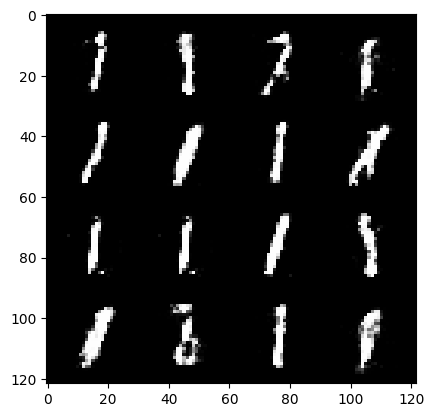

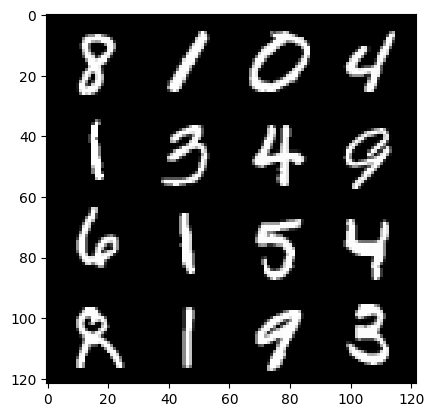

116: step 61500 / Gen loss: 2.4188452347119647 / disc_loss: 0.19996714584529404


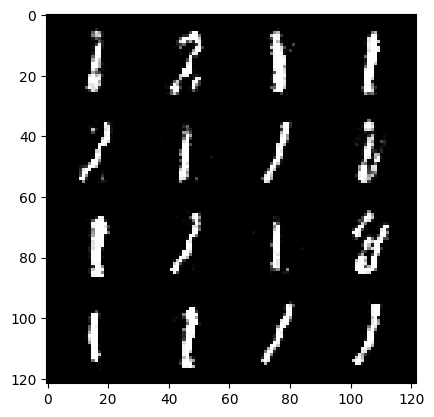

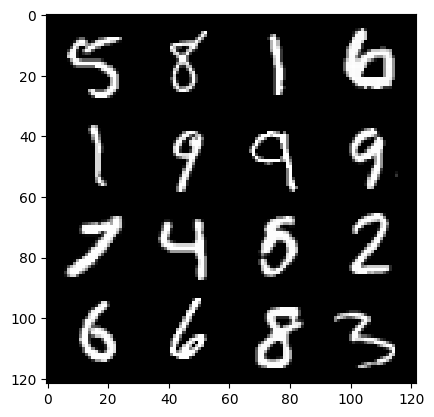

116: step 61800 / Gen loss: 2.481486276785532 / disc_loss: 0.186397615224123


  0%|          | 0/469 [00:00<?, ?it/s]

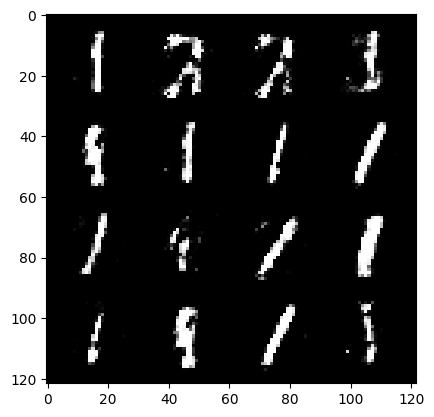

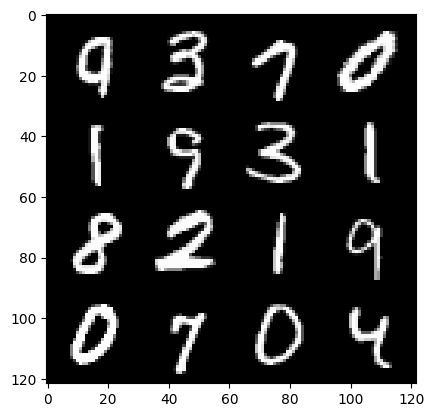

117: step 62100 / Gen loss: 2.459459687074025 / disc_loss: 0.18667658892770622


  0%|          | 0/469 [00:00<?, ?it/s]

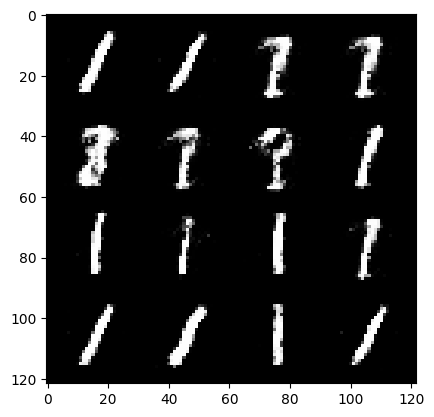

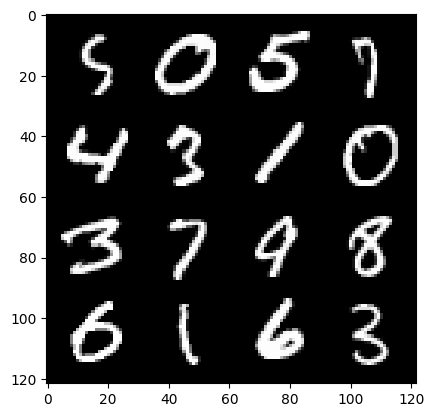

118: step 62400 / Gen loss: 2.400611823399861 / disc_loss: 0.2022021550933519


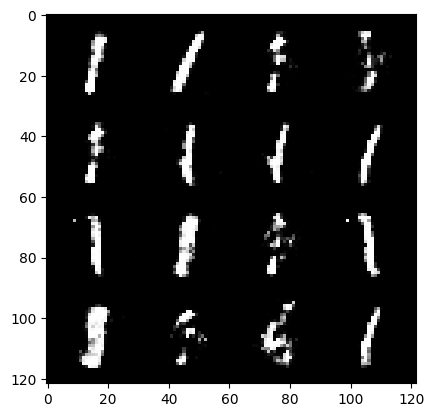

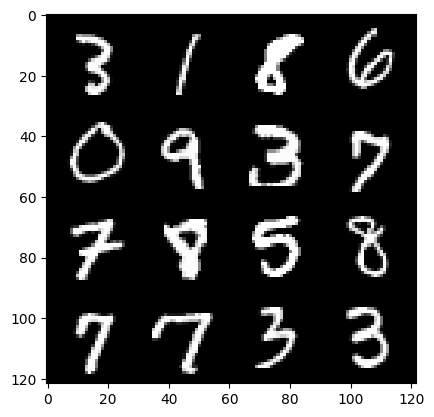

118: step 62700 / Gen loss: 2.3944367925326038 / disc_loss: 0.19446237313250705


  0%|          | 0/469 [00:00<?, ?it/s]

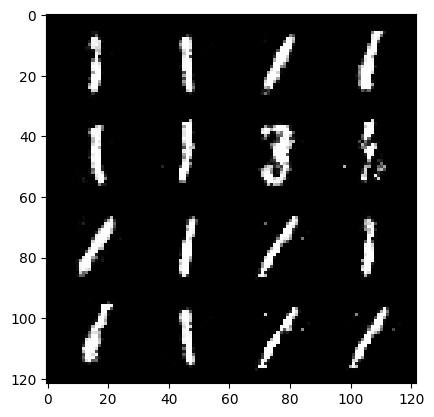

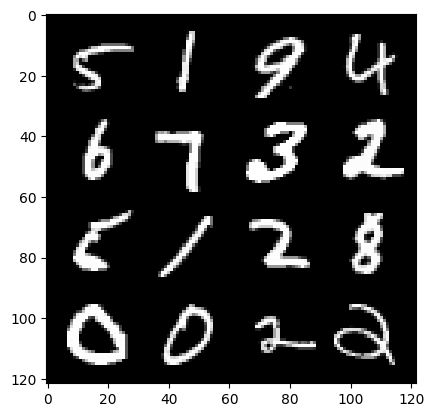

119: step 63000 / Gen loss: 2.4424881553649898 / disc_loss: 0.18956580989062785


  0%|          | 0/469 [00:00<?, ?it/s]

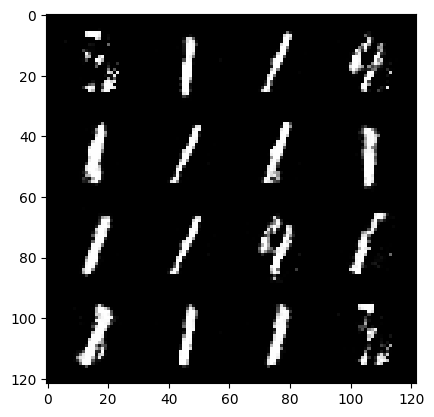

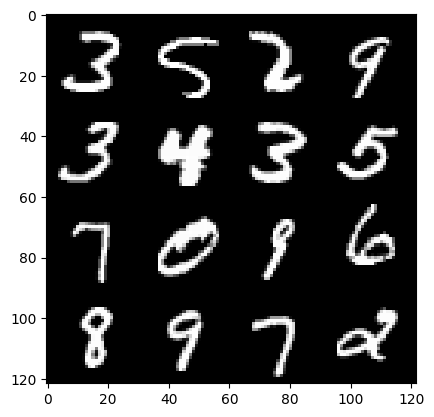

120: step 63300 / Gen loss: 2.523997688293459 / disc_loss: 0.19392767667770394


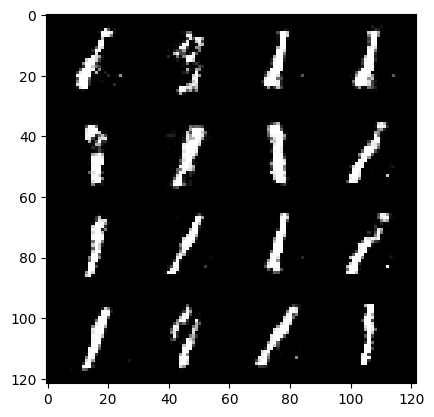

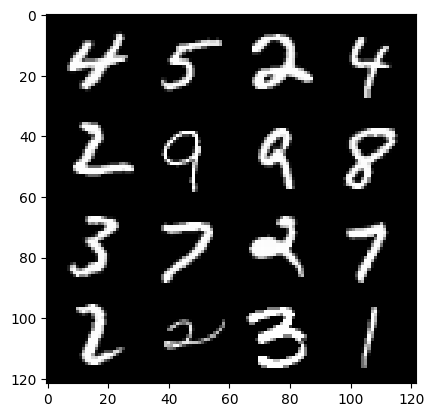

120: step 63600 / Gen loss: 2.4606038784980777 / disc_loss: 0.18498683355748646


  0%|          | 0/469 [00:00<?, ?it/s]

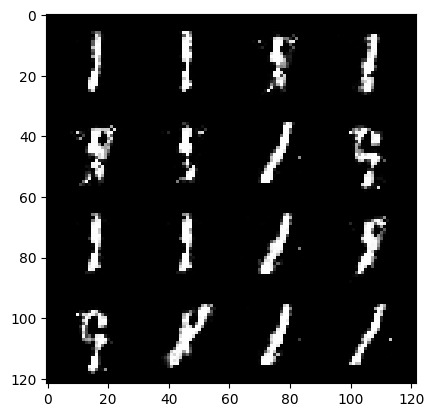

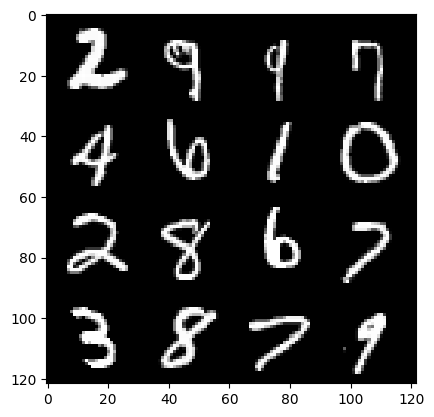

121: step 63900 / Gen loss: 2.3982972073555 / disc_loss: 0.19965309053659436


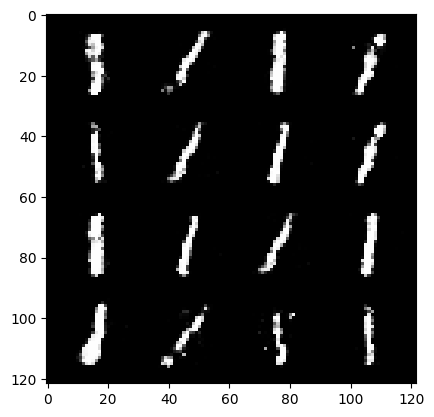

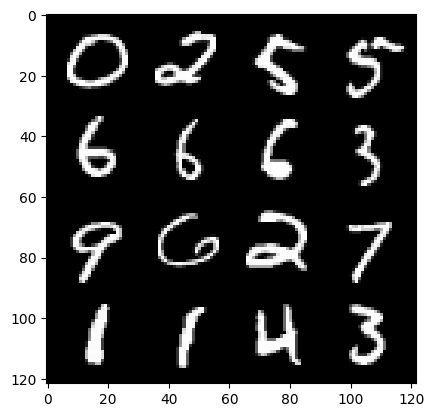

121: step 64200 / Gen loss: 2.383017857869466 / disc_loss: 0.19117762863636037


  0%|          | 0/469 [00:00<?, ?it/s]

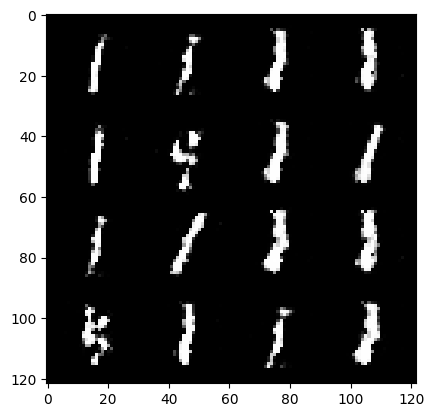

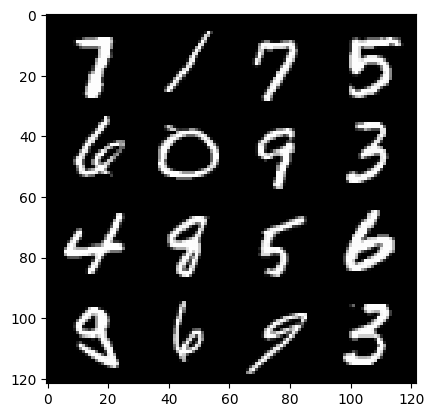

122: step 64500 / Gen loss: 2.4112232422828677 / disc_loss: 0.1810756659507751


  0%|          | 0/469 [00:00<?, ?it/s]

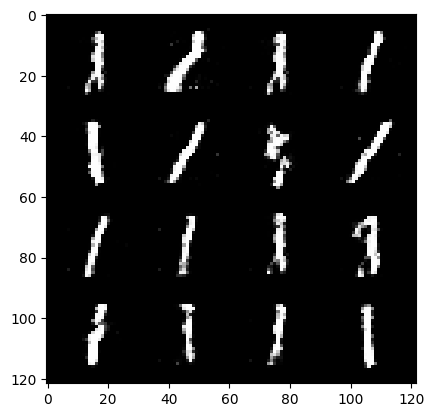

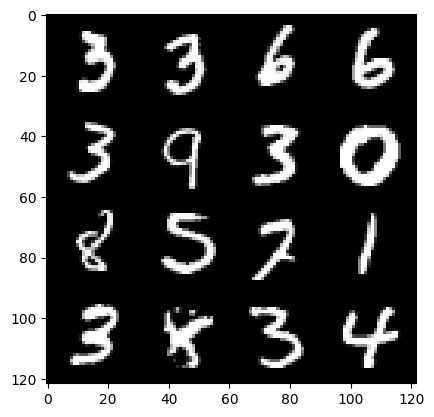

123: step 64800 / Gen loss: 2.4735870345433546 / disc_loss: 0.18655559460322046


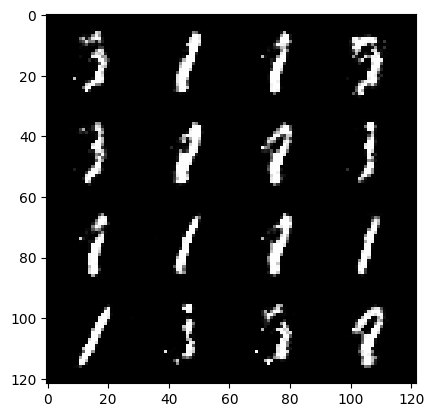

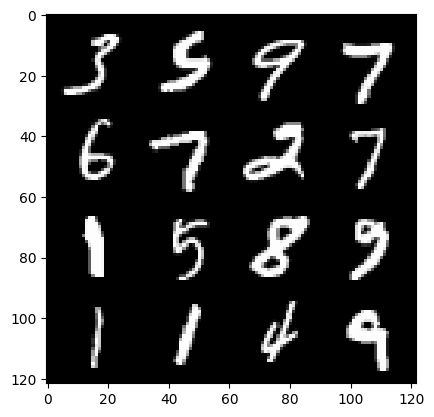

123: step 65100 / Gen loss: 2.434470811684925 / disc_loss: 0.1950818559775751


  0%|          | 0/469 [00:00<?, ?it/s]

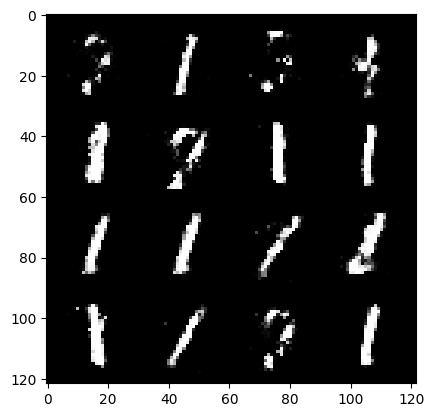

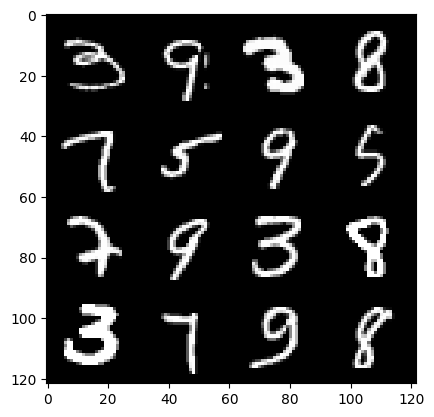

124: step 65400 / Gen loss: 2.4078641049067193 / disc_loss: 0.19589343138039123


  0%|          | 0/469 [00:00<?, ?it/s]

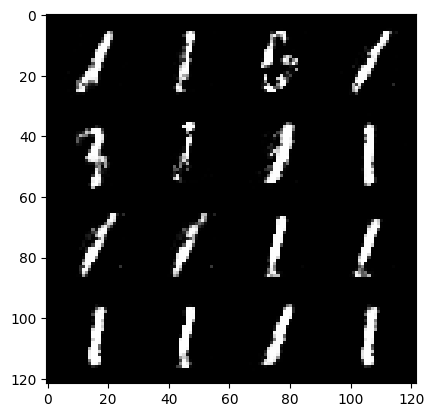

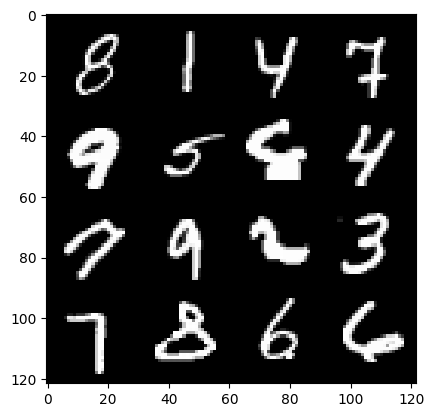

125: step 65700 / Gen loss: 2.328241761525473 / disc_loss: 0.21022060031692186


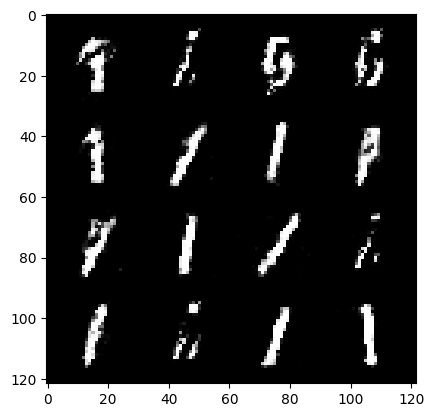

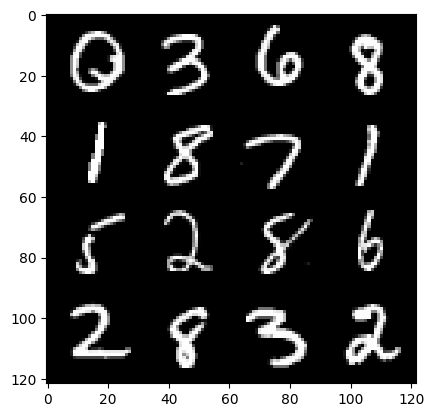

125: step 66000 / Gen loss: 2.2631888095537827 / disc_loss: 0.21016658462584026


  0%|          | 0/469 [00:00<?, ?it/s]

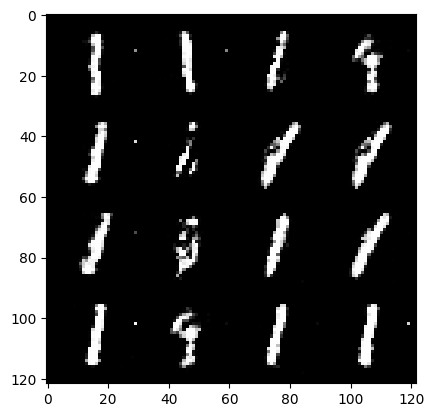

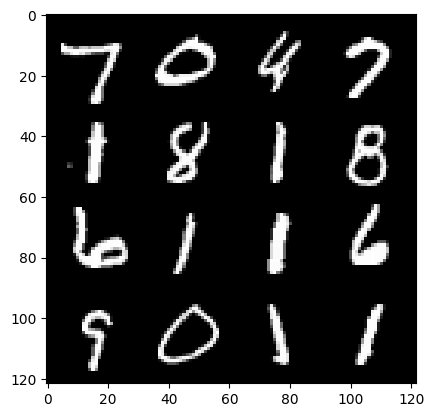

126: step 66300 / Gen loss: 2.3526015051205964 / disc_loss: 0.19878132527073225


  0%|          | 0/469 [00:00<?, ?it/s]

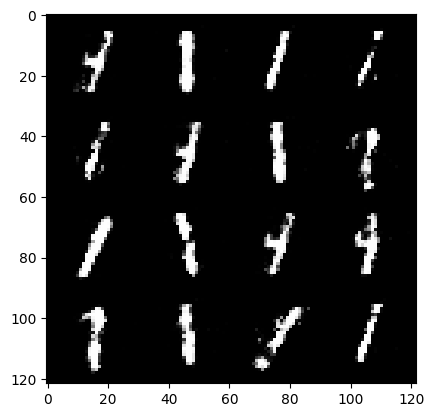

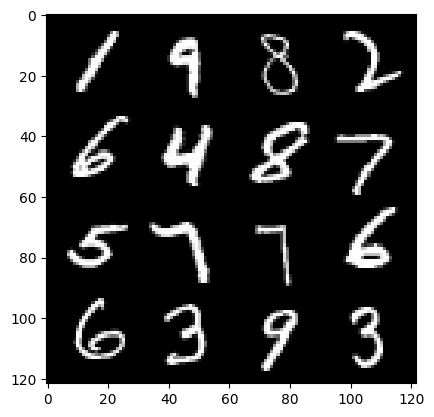

127: step 66600 / Gen loss: 2.4339352218310055 / disc_loss: 0.18633913449943074


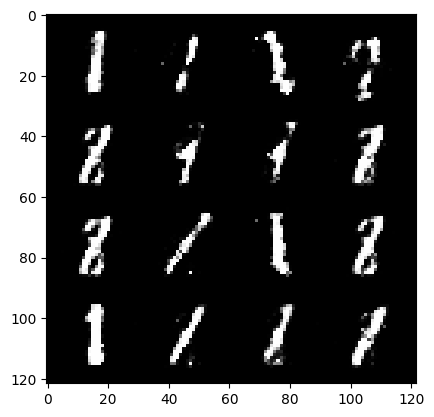

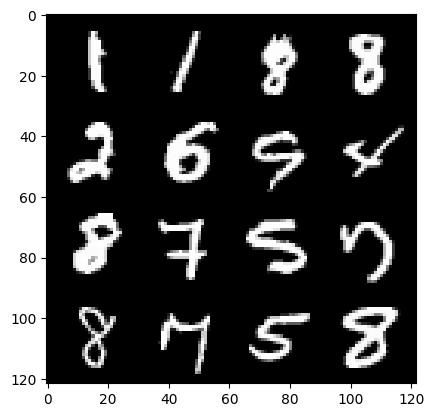

127: step 66900 / Gen loss: 2.38728878736496 / disc_loss: 0.20021774371465054


  0%|          | 0/469 [00:00<?, ?it/s]

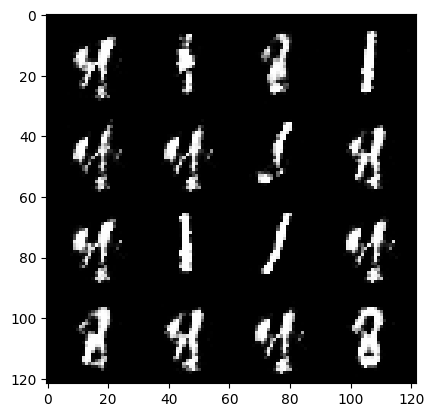

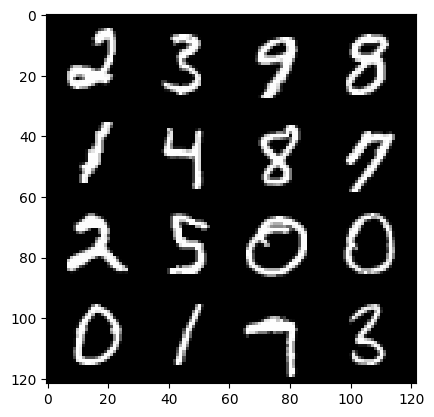

128: step 67200 / Gen loss: 2.3511211736996973 / disc_loss: 0.20122156731784344


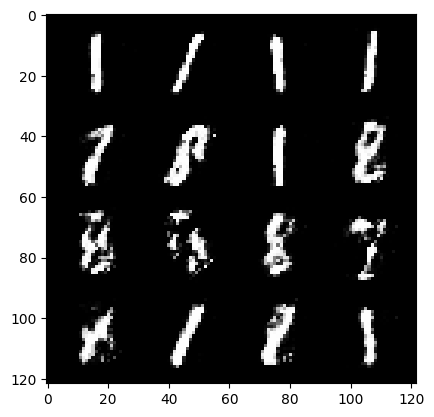

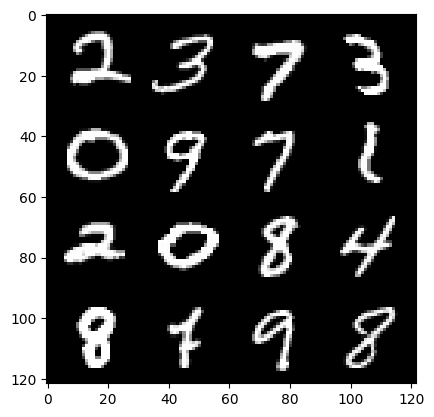

128: step 67500 / Gen loss: 2.339576758543648 / disc_loss: 0.2210555126269659


  0%|          | 0/469 [00:00<?, ?it/s]

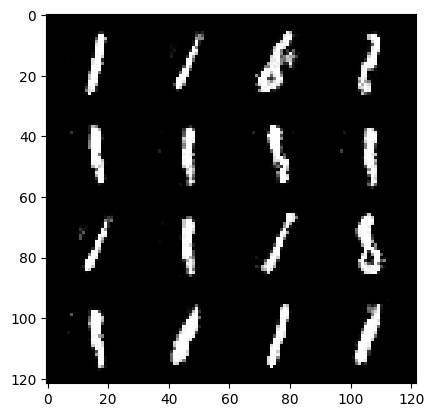

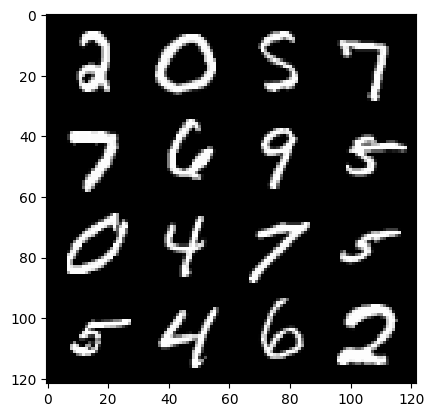

129: step 67800 / Gen loss: 2.4592766030629463 / disc_loss: 0.18124469488859168


  0%|          | 0/469 [00:00<?, ?it/s]

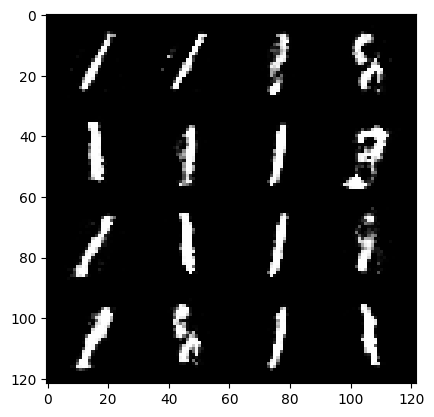

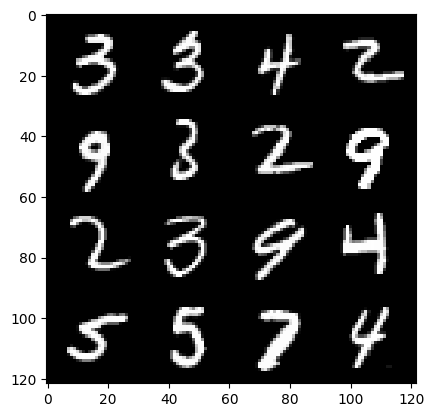

130: step 68100 / Gen loss: 2.4594270571072903 / disc_loss: 0.19177884504199014


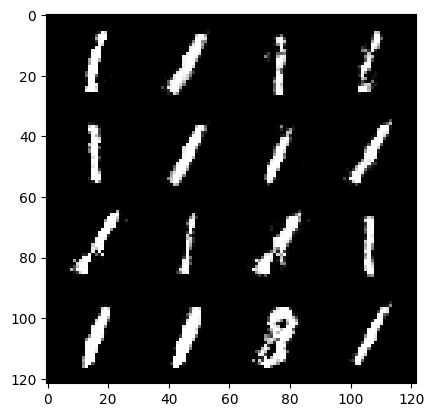

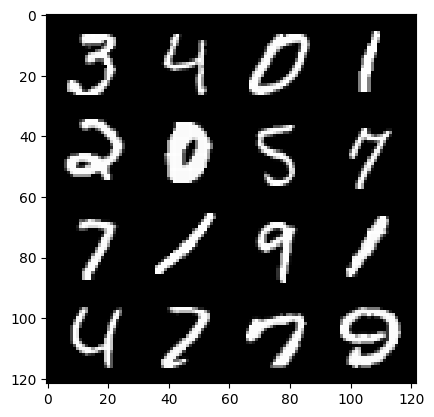

130: step 68400 / Gen loss: 2.4094358746210727 / disc_loss: 0.20134065782030422


  0%|          | 0/469 [00:00<?, ?it/s]

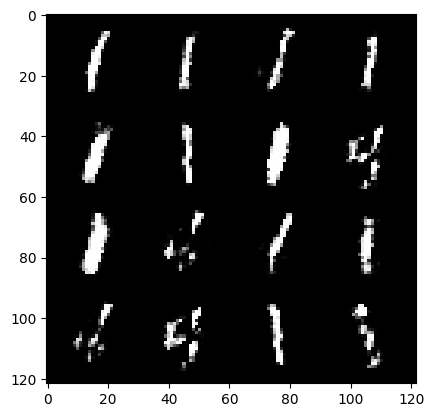

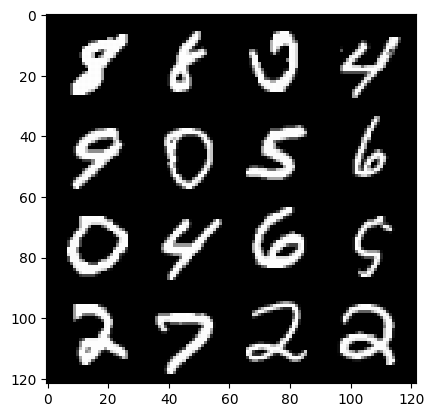

131: step 68700 / Gen loss: 2.355978981653849 / disc_loss: 0.19749845395485557


  0%|          | 0/469 [00:00<?, ?it/s]

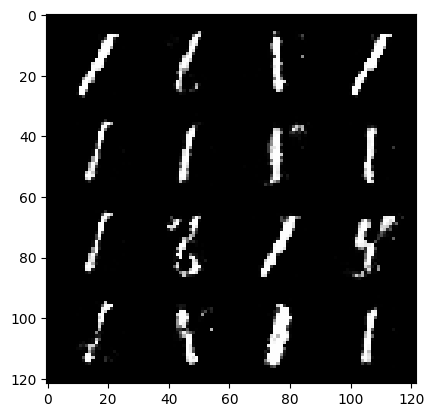

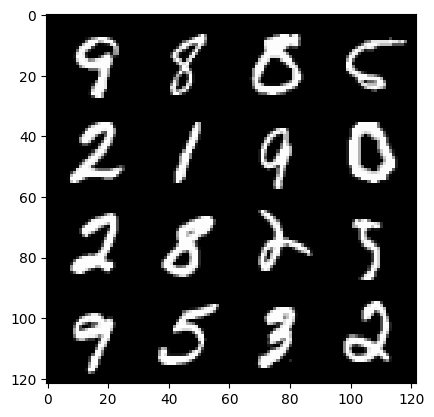

132: step 69000 / Gen loss: 2.3124877019723256 / disc_loss: 0.20511786592503398


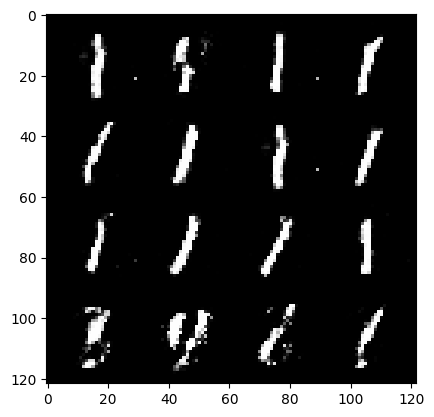

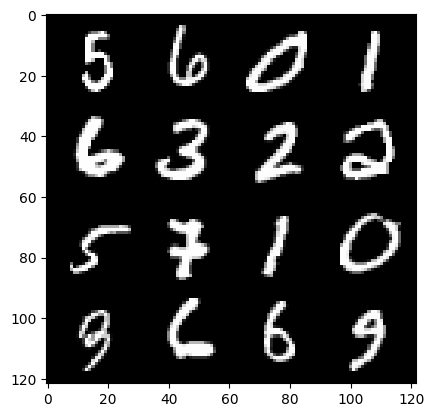

132: step 69300 / Gen loss: 2.5776951130231227 / disc_loss: 0.18240728425482913


  0%|          | 0/469 [00:00<?, ?it/s]

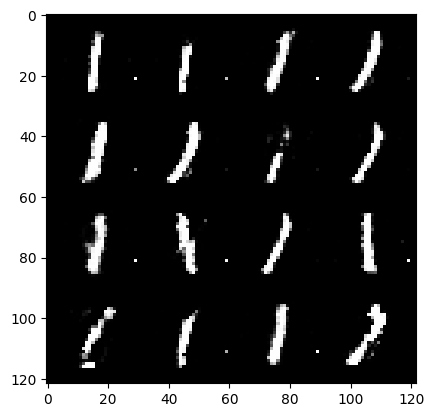

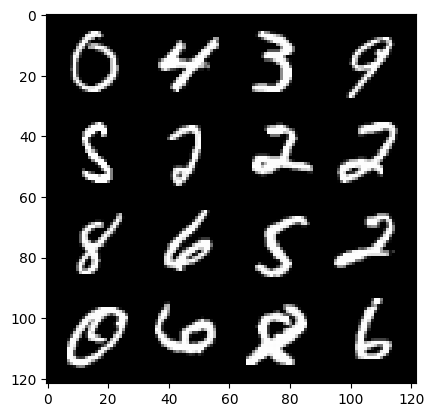

133: step 69600 / Gen loss: 2.382291425863901 / disc_loss: 0.22515400181214024


  0%|          | 0/469 [00:00<?, ?it/s]

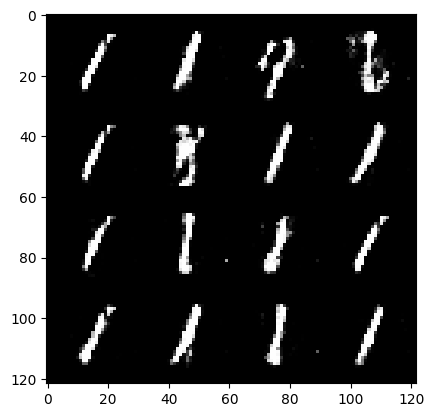

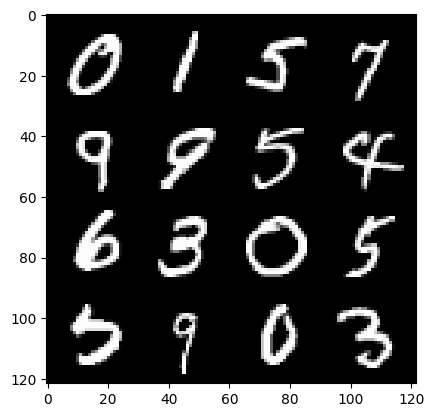

134: step 69900 / Gen loss: 2.4906734498341883 / disc_loss: 0.18899743214249604


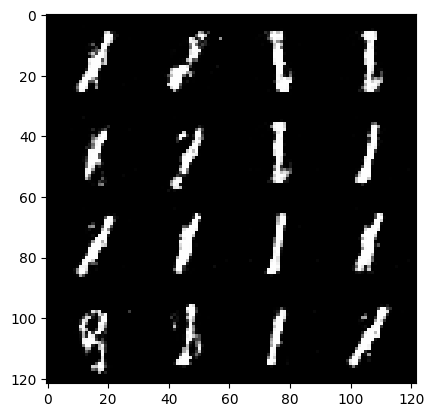

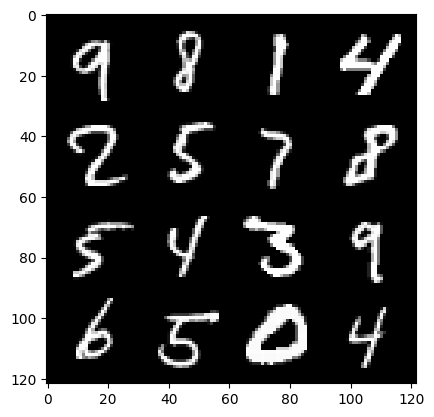

134: step 70200 / Gen loss: 2.374406838417053 / disc_loss: 0.19507277299960443


  0%|          | 0/469 [00:00<?, ?it/s]

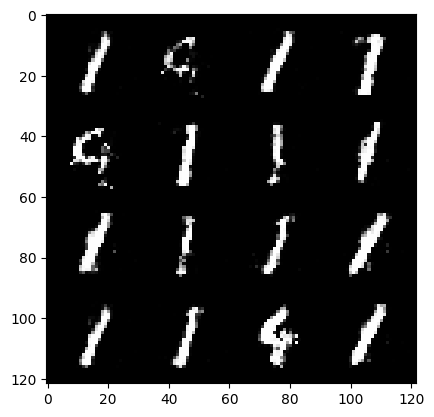

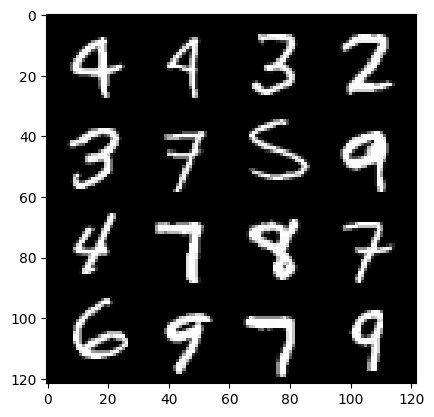

135: step 70500 / Gen loss: 2.4290645925203953 / disc_loss: 0.19845309908191358


  0%|          | 0/469 [00:00<?, ?it/s]

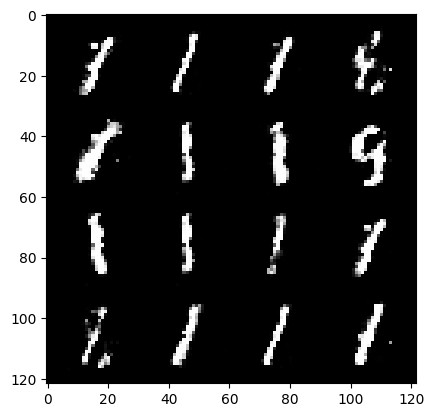

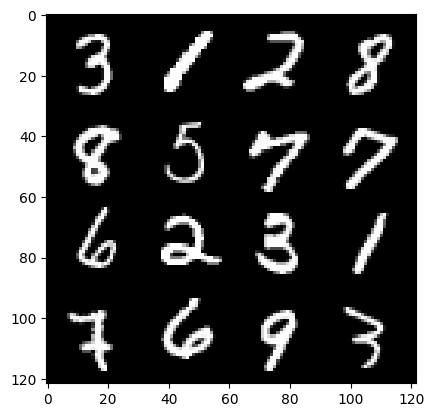

136: step 70800 / Gen loss: 2.3475060137112935 / disc_loss: 0.20188901007175453


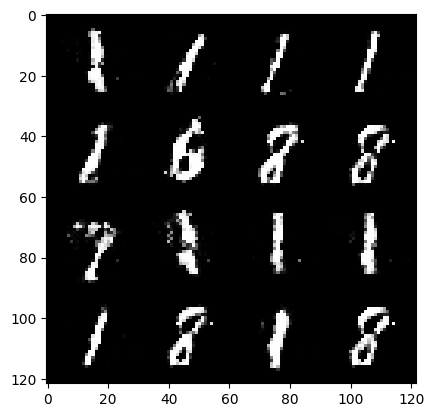

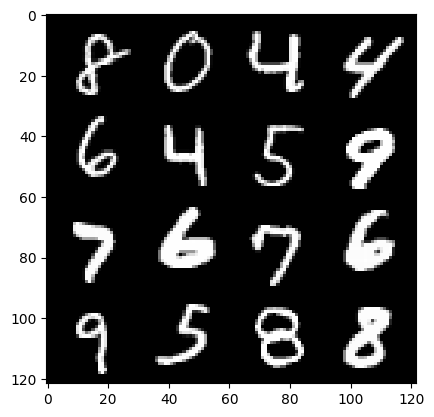

136: step 71100 / Gen loss: 2.300067740281424 / disc_loss: 0.2073047577838103


  0%|          | 0/469 [00:00<?, ?it/s]

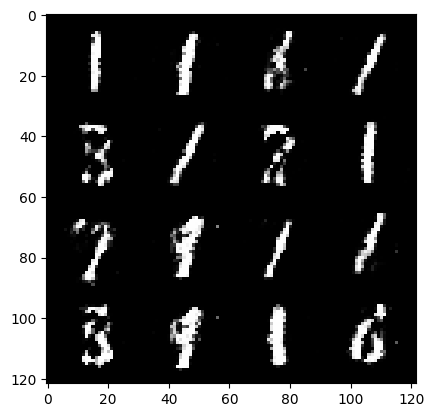

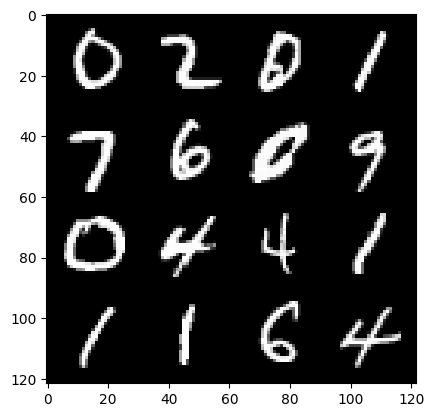

137: step 71400 / Gen loss: 2.2805588392416634 / disc_loss: 0.20509561841686577


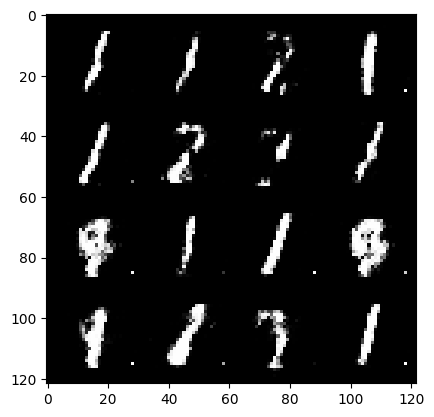

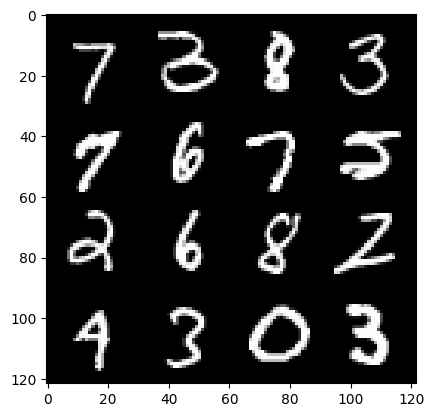

137: step 71700 / Gen loss: 2.294681804180145 / disc_loss: 0.23305960898598038


  0%|          | 0/469 [00:00<?, ?it/s]

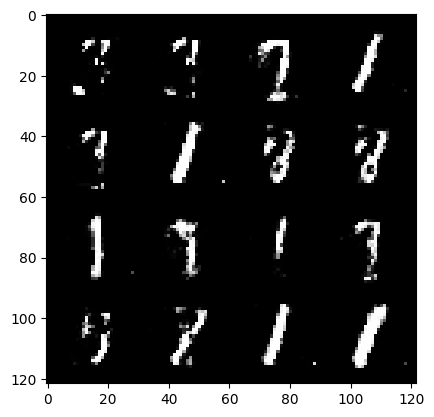

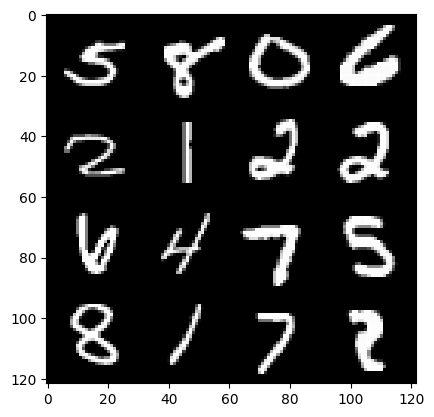

138: step 72000 / Gen loss: 2.194961649576824 / disc_loss: 0.2001160074273747


  0%|          | 0/469 [00:00<?, ?it/s]

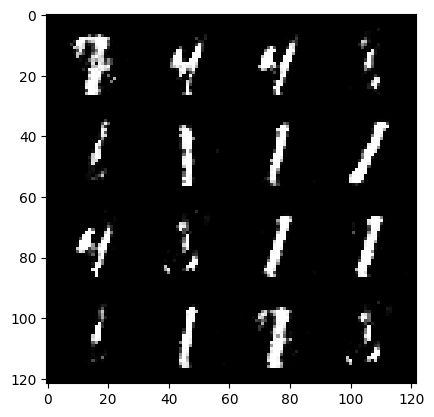

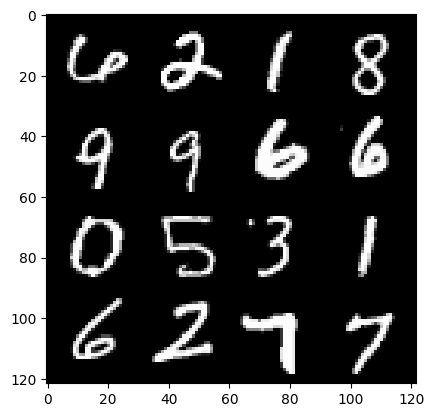

139: step 72300 / Gen loss: 2.4105641468365984 / disc_loss: 0.18983622106413045


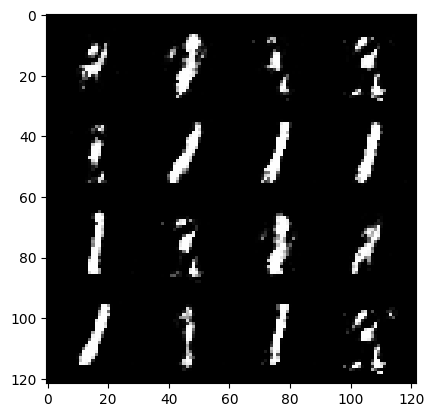

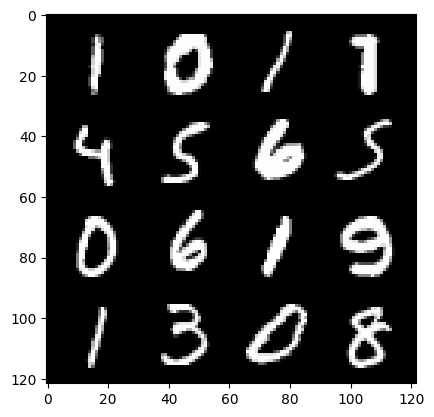

139: step 72600 / Gen loss: 2.3457152009010325 / disc_loss: 0.19575621935228504


  0%|          | 0/469 [00:00<?, ?it/s]

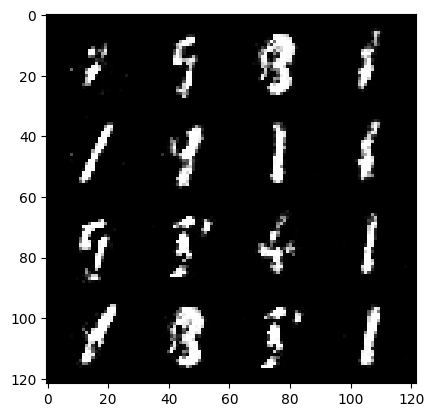

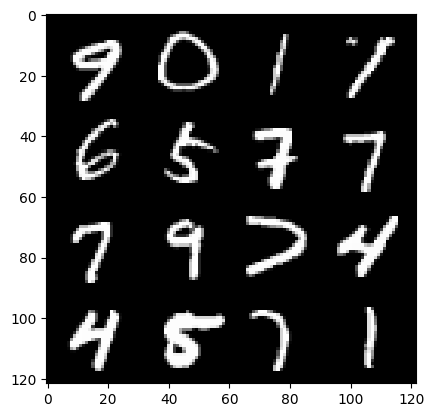

140: step 72900 / Gen loss: 2.485128357410432 / disc_loss: 0.1856151401996613


  0%|          | 0/469 [00:00<?, ?it/s]

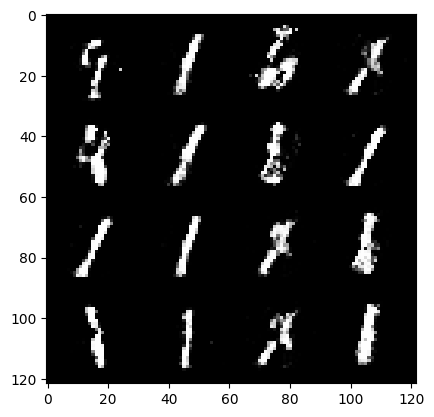

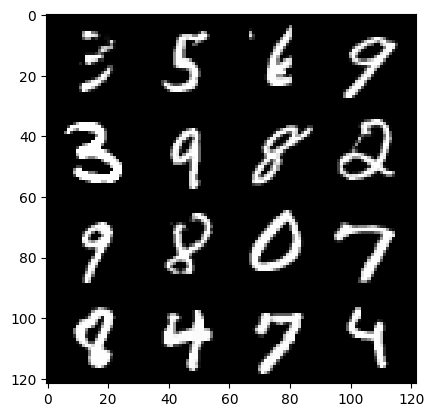

141: step 73200 / Gen loss: 2.263978333473206 / disc_loss: 0.22572092622518541


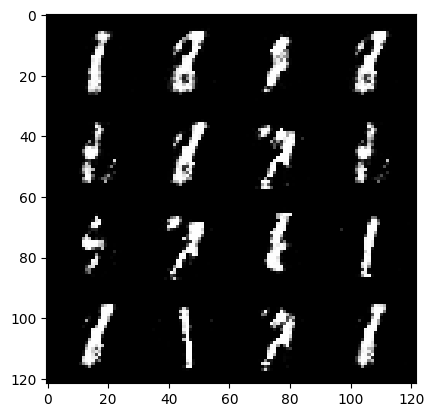

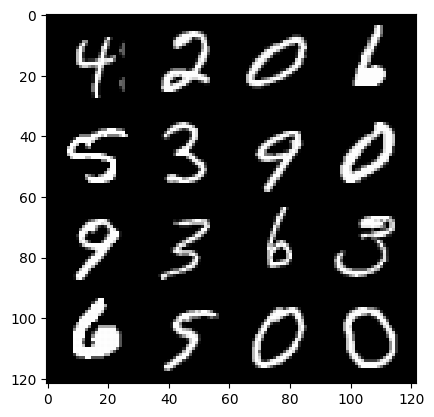

141: step 73500 / Gen loss: 2.3247336832682293 / disc_loss: 0.2014980760216713


  0%|          | 0/469 [00:00<?, ?it/s]

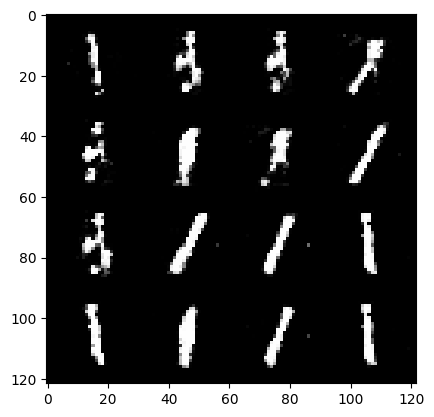

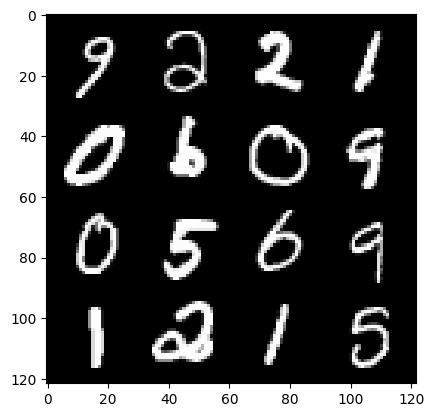

142: step 73800 / Gen loss: 2.3872939173380523 / disc_loss: 0.19960343370834985


  0%|          | 0/469 [00:00<?, ?it/s]

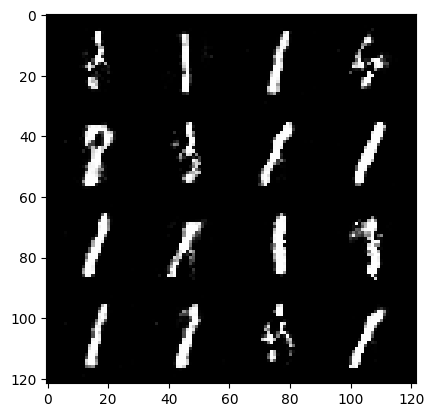

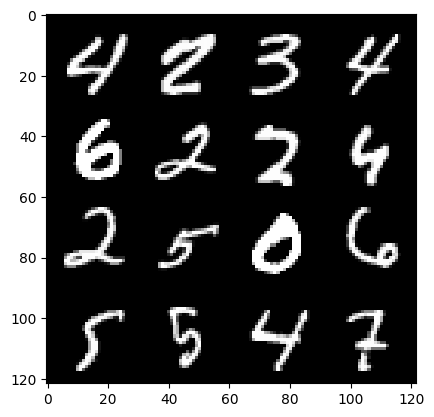

143: step 74100 / Gen loss: 2.3854436413447035 / disc_loss: 0.2042601192742585


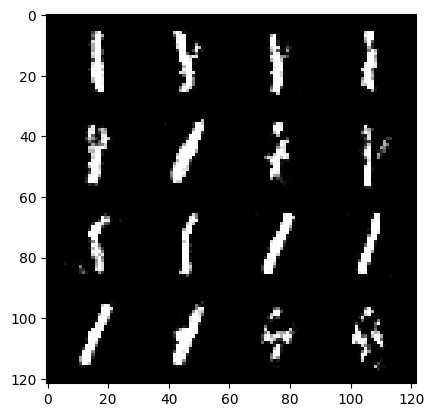

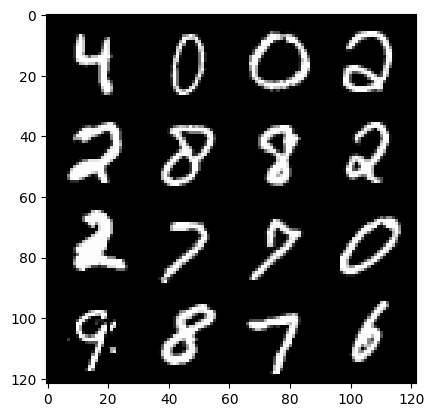

143: step 74400 / Gen loss: 2.3115557114283236 / disc_loss: 0.20553020517031356


  0%|          | 0/469 [00:00<?, ?it/s]

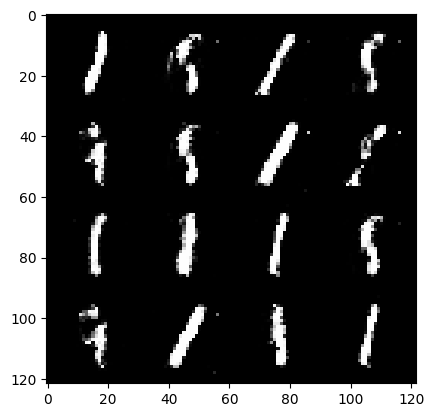

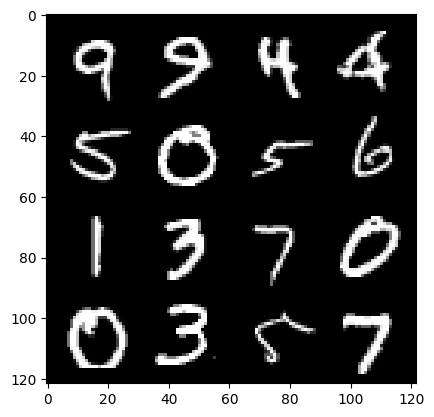

144: step 74700 / Gen loss: 2.350589394569396 / disc_loss: 0.20286385893821715


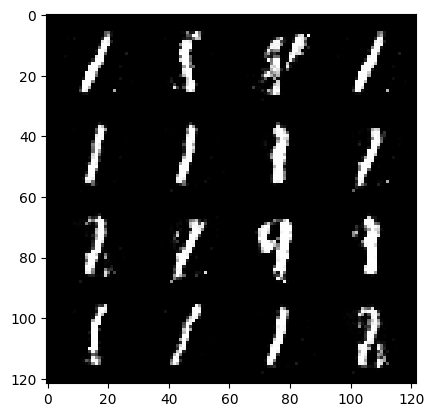

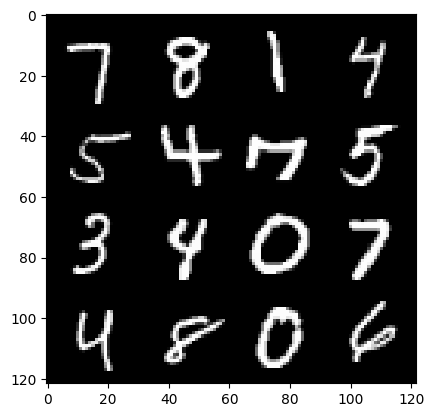

144: step 75000 / Gen loss: 2.3430436762173965 / disc_loss: 0.21073300306995715


  0%|          | 0/469 [00:00<?, ?it/s]

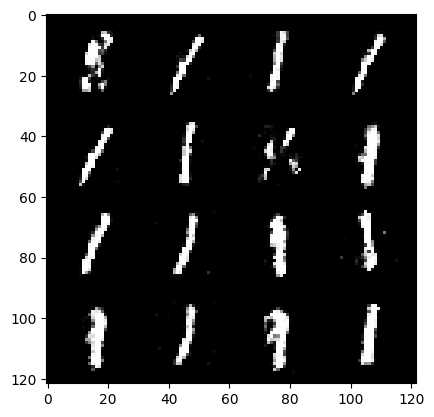

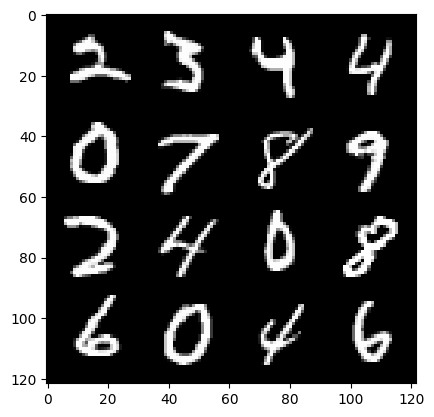

145: step 75300 / Gen loss: 2.366086408297222 / disc_loss: 0.2014135508487622


  0%|          | 0/469 [00:00<?, ?it/s]

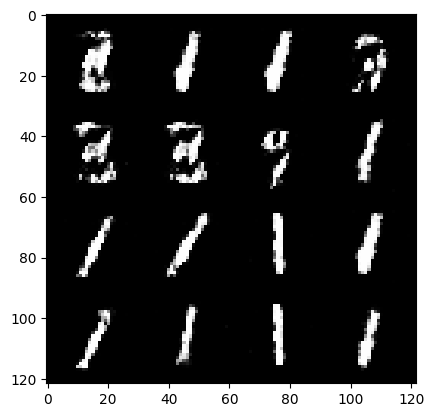

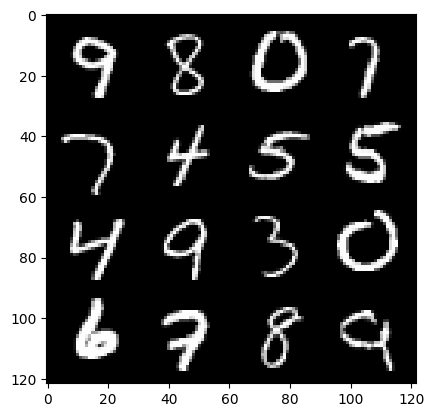

146: step 75600 / Gen loss: 2.412290847301481 / disc_loss: 0.20842188303669285


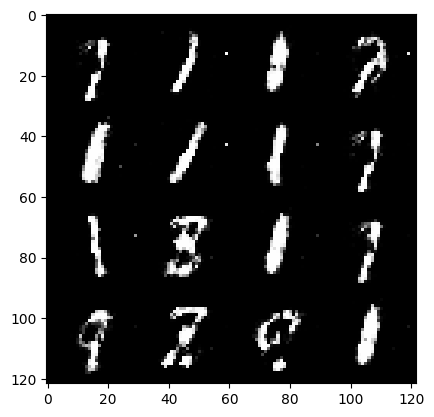

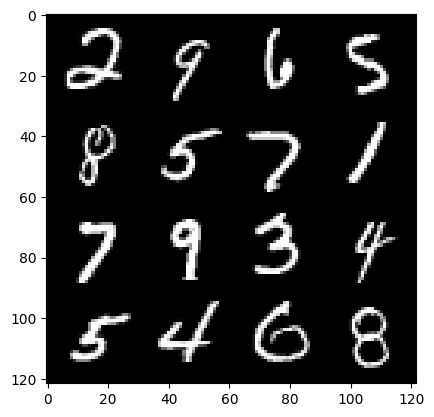

146: step 75900 / Gen loss: 2.2102870742479968 / disc_loss: 0.22694019272923457


  0%|          | 0/469 [00:00<?, ?it/s]

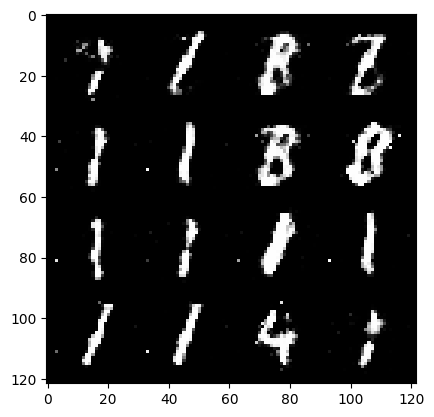

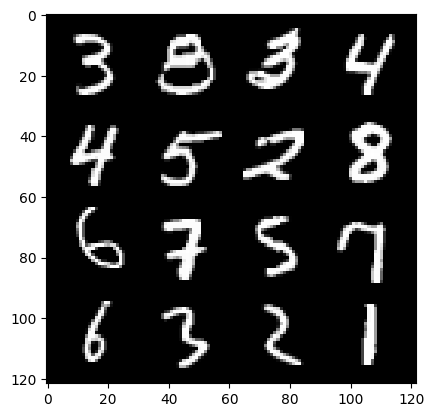

147: step 76200 / Gen loss: 2.263139693737029 / disc_loss: 0.24261446898182243


  0%|          | 0/469 [00:00<?, ?it/s]

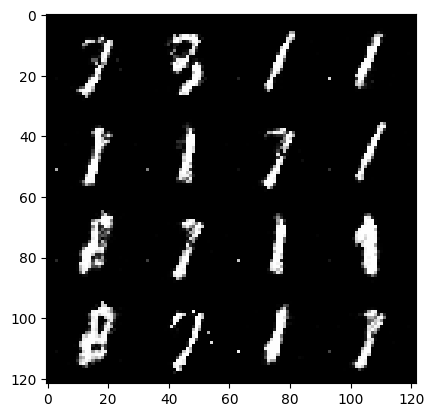

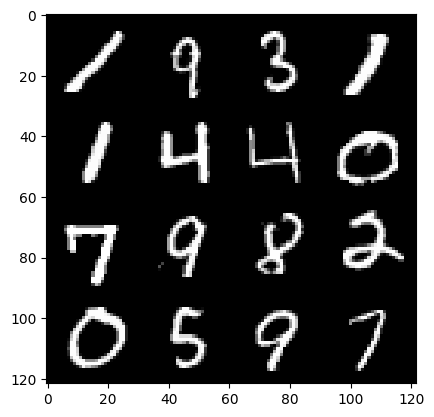

148: step 76500 / Gen loss: 2.1788474007447562 / disc_loss: 0.2183308884004752


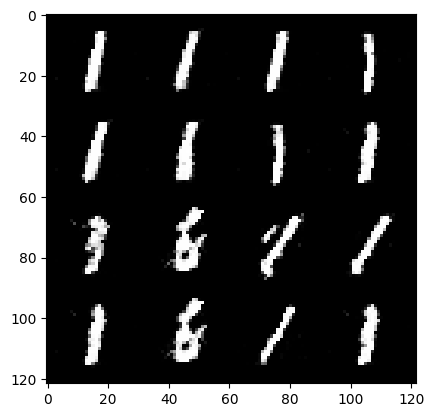

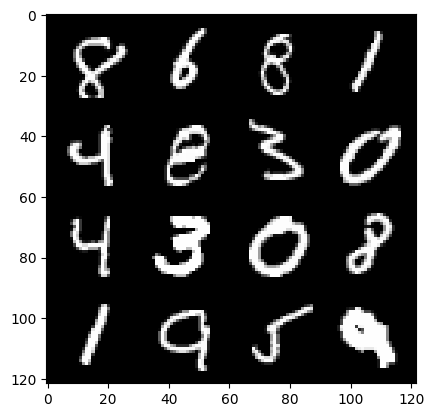

148: step 76800 / Gen loss: 2.4658873430887867 / disc_loss: 0.2004173246026039


  0%|          | 0/469 [00:00<?, ?it/s]

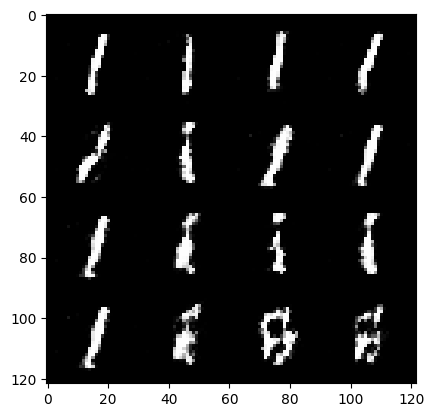

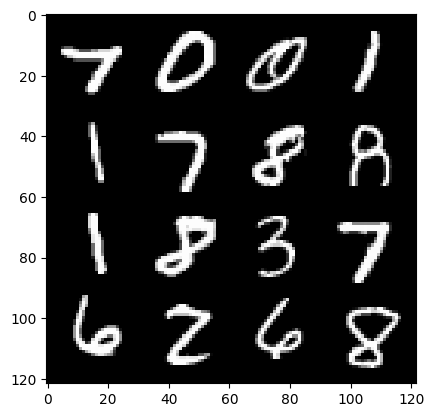

149: step 77100 / Gen loss: 2.3476326338450115 / disc_loss: 0.2092171943684419


  0%|          | 0/469 [00:00<?, ?it/s]

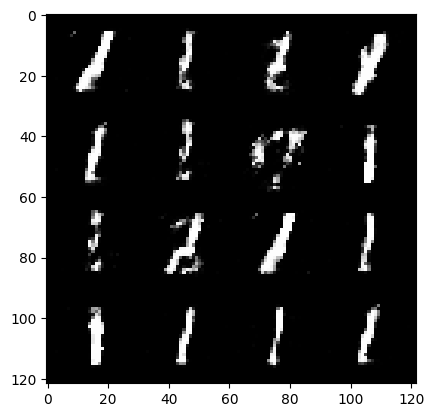

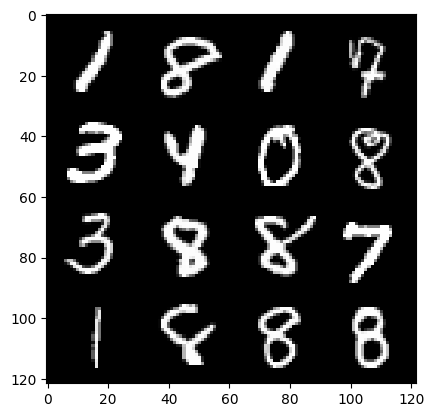

150: step 77400 / Gen loss: 2.2013608384132395 / disc_loss: 0.22926904375354454


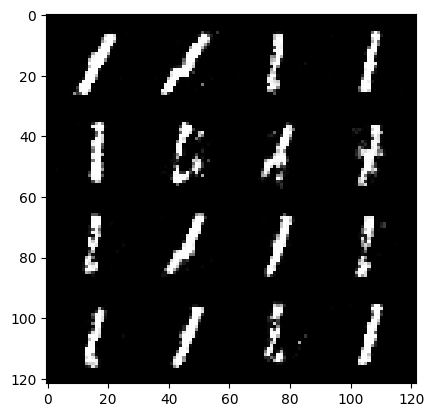

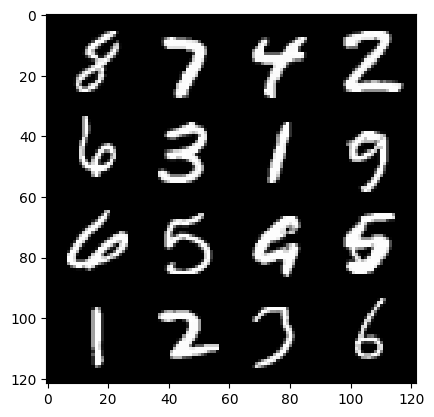

150: step 77700 / Gen loss: 2.1703960212071745 / disc_loss: 0.21639766943951447


  0%|          | 0/469 [00:00<?, ?it/s]

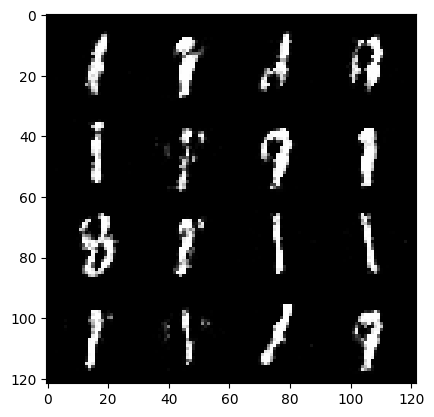

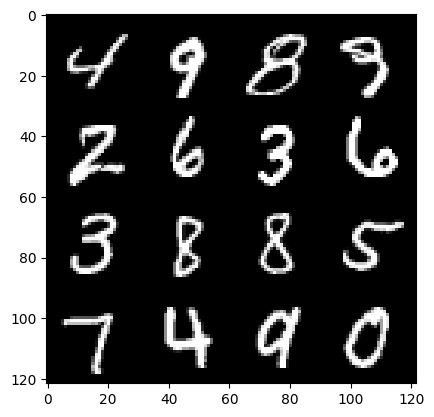

151: step 78000 / Gen loss: 2.313218170007068 / disc_loss: 0.2059684073676665


  0%|          | 0/469 [00:00<?, ?it/s]

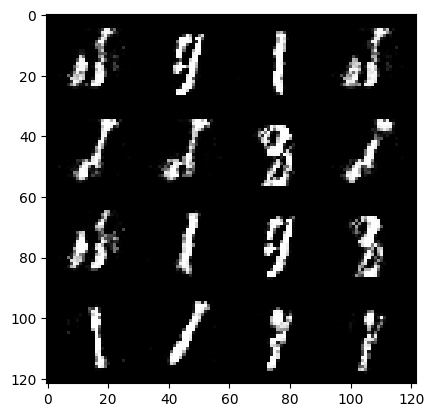

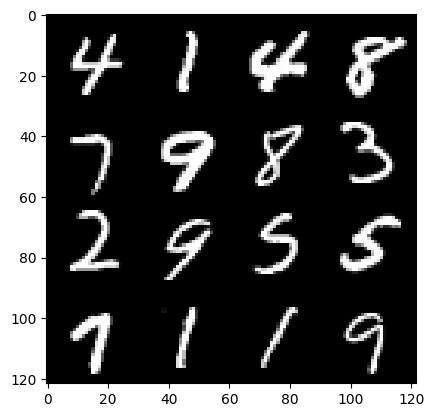

152: step 78300 / Gen loss: 2.3336484551429746 / disc_loss: 0.22321015000343336


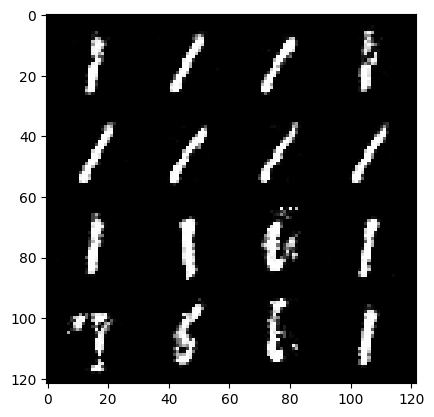

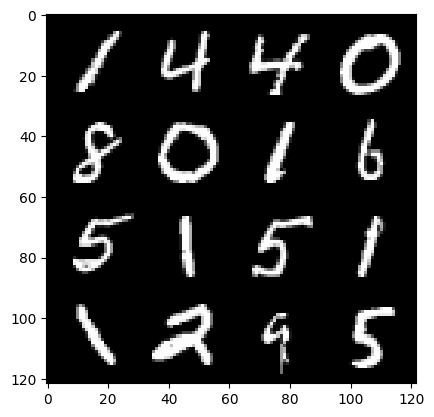

152: step 78600 / Gen loss: 2.2035754752159127 / disc_loss: 0.22351411541302998


  0%|          | 0/469 [00:00<?, ?it/s]

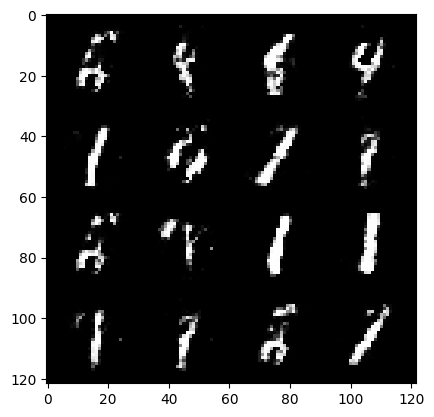

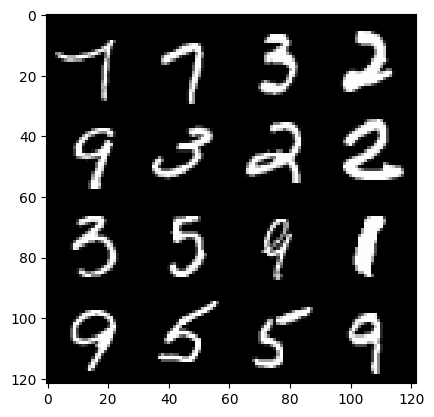

153: step 78900 / Gen loss: 2.311741475264231 / disc_loss: 0.2119314160197972


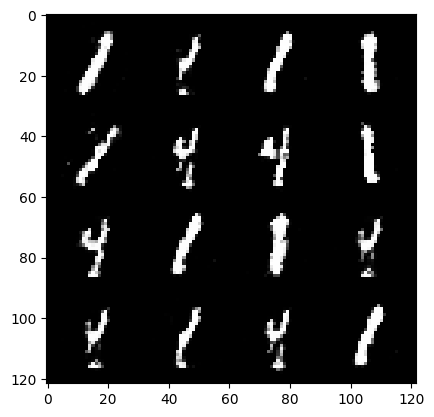

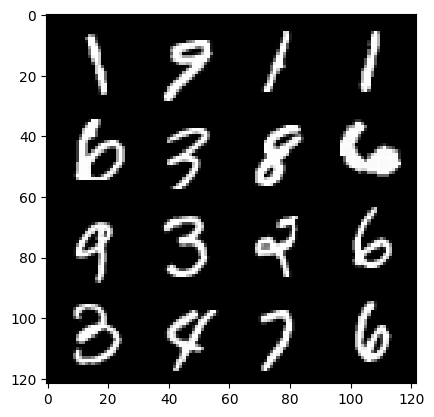

153: step 79200 / Gen loss: 2.175873616536457 / disc_loss: 0.23194429179032658


  0%|          | 0/469 [00:00<?, ?it/s]

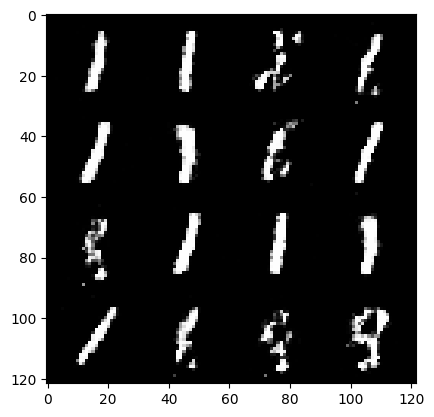

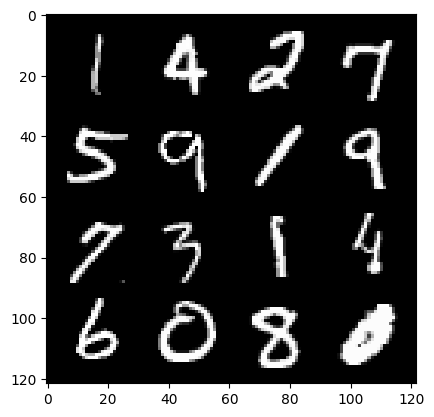

154: step 79500 / Gen loss: 2.2322162381807966 / disc_loss: 0.21797360775371388


  0%|          | 0/469 [00:00<?, ?it/s]

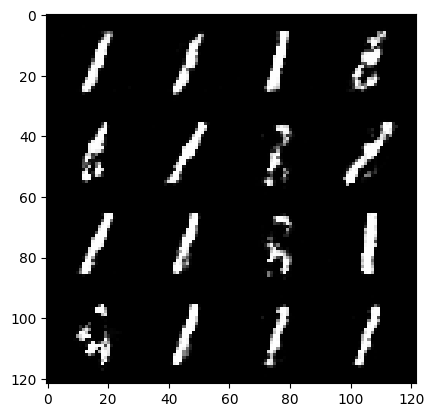

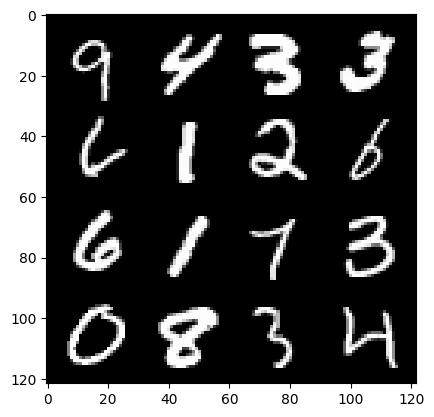

155: step 79800 / Gen loss: 2.2145045753320067 / disc_loss: 0.2262691592176756


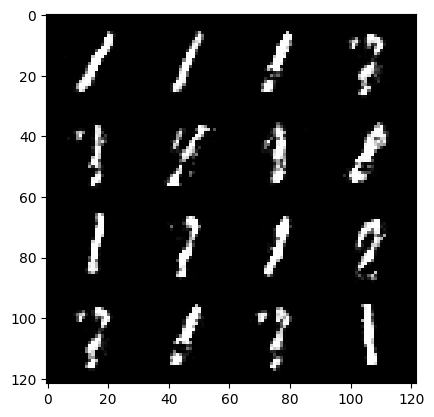

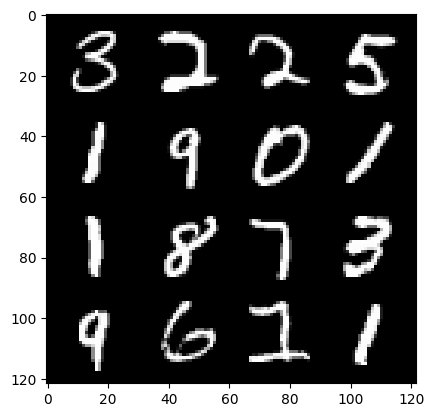

155: step 80100 / Gen loss: 2.2167358501752226 / disc_loss: 0.22944675614436477


  0%|          | 0/469 [00:00<?, ?it/s]

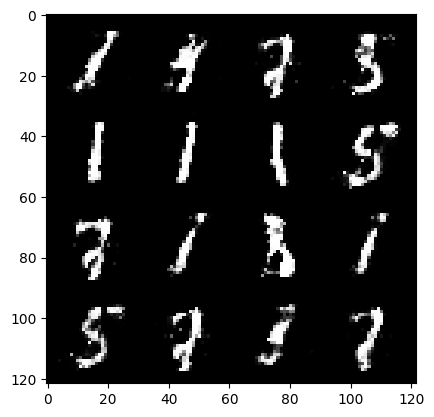

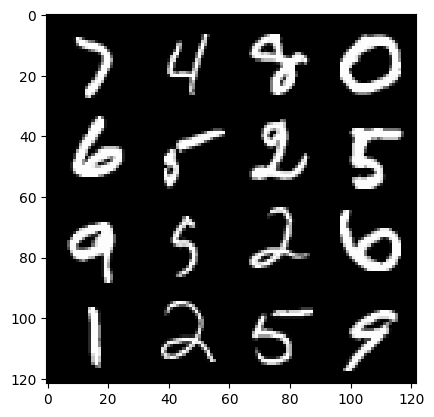

156: step 80400 / Gen loss: 2.063619633118312 / disc_loss: 0.24328105325500174


  0%|          | 0/469 [00:00<?, ?it/s]

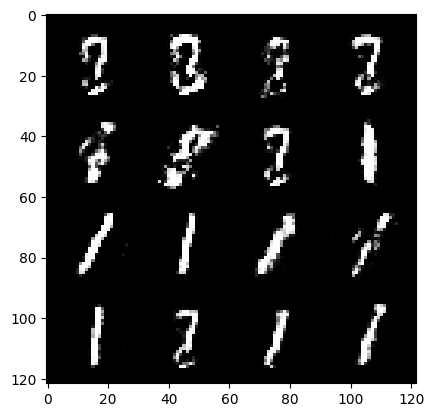

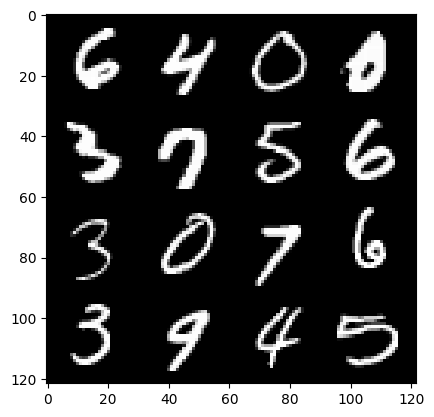

157: step 80700 / Gen loss: 2.240909798145296 / disc_loss: 0.2203286523620287


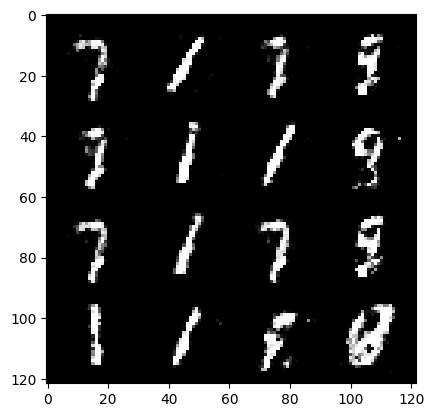

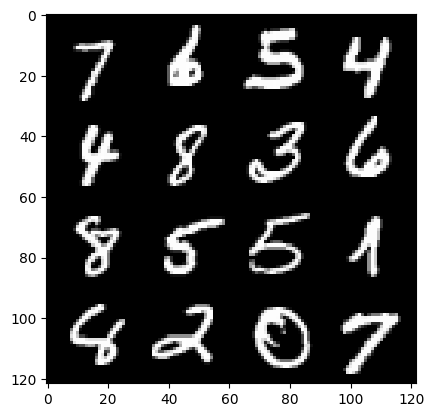

157: step 81000 / Gen loss: 2.1255169542630523 / disc_loss: 0.23507346058885278


  0%|          | 0/469 [00:00<?, ?it/s]

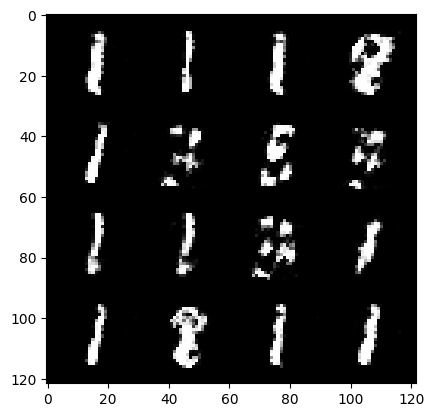

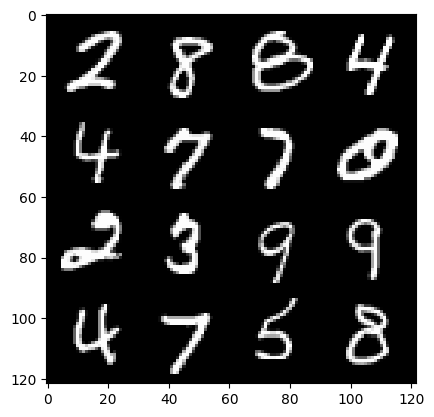

158: step 81300 / Gen loss: 2.1324172155062366 / disc_loss: 0.24000457997123406


  0%|          | 0/469 [00:00<?, ?it/s]

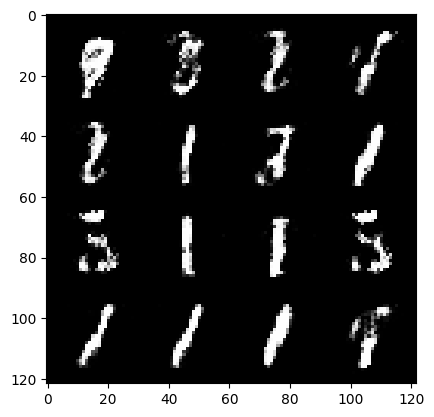

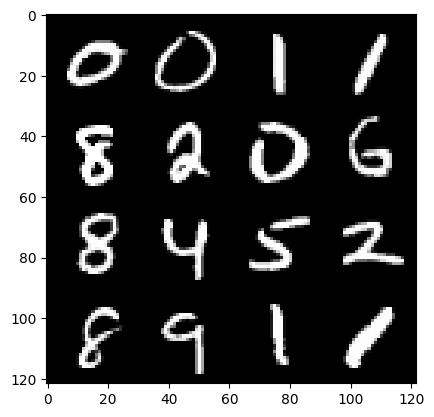

159: step 81600 / Gen loss: 2.188319013913473 / disc_loss: 0.2275836449364822


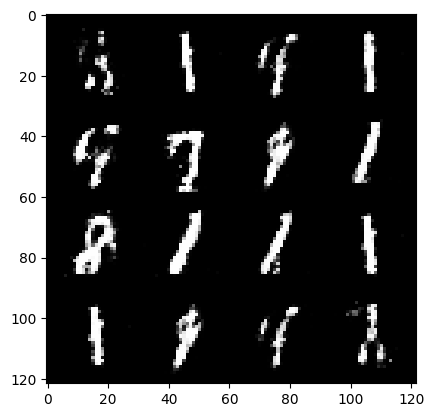

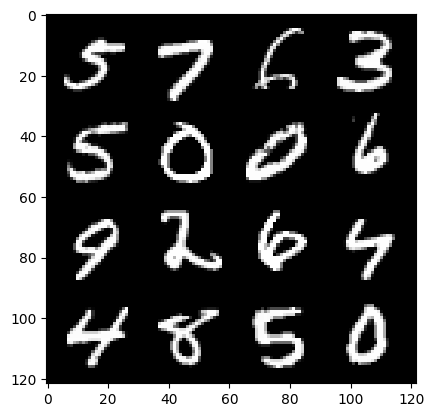

159: step 81900 / Gen loss: 2.095242614348728 / disc_loss: 0.2557905089855194


  0%|          | 0/469 [00:00<?, ?it/s]

In [ ]:
for epoch in range(epochs):
  for real, _ in tqdm(dataloader):
    disc_opt.zero_grad()
    cur_bs=len(real)
    real= real.view(cur_bs, -1)
    real=real.to(device)

    disc_loss=calc_disc_loss(loss_func, gen, disc, cur_bs, real, z_dim)
    disc_loss.backward(retain_graph=True)
    disc_opt.step()

    gen_opt.zero_grad()
    gen_loss=calc_gen_loss(loss_func, gen, disc, cur_bs, z_dim)
    gen_loss.backward(retain_graph=True)
    gen_opt.step()

    mean_disc_loss+=disc_loss.item()/info_step
    mean_gen_loss+=gen_loss.item()/info_step

    if cur_step % info_step == 0 and cur_step > 0:
      noise = gen_noise(cur_bs, z_dim)
      fake = gen(noise)
      show(fake)
      show(real)
      print (f"{epoch}: step {cur_step} / Gen loss: {mean_gen_loss} / disc_loss: {mean_disc_loss}")
      mean_gen_loss, mean_disc_loss=0,0
    cur_step+=1
